In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
from cycler import cycler
import datetime
import seaborn as sns
import re
import datetime

In [2]:
def get_collection(collection_name):
    """
    Read in key to mongoDB and return collection
    @param collection_name: specify the collection to call
    @return: collection object
    """
    import pymongo
    import os

    path = os.path.join(os.getcwd(), '../../../../keys/')
    with open(f"{path}mongo_key.txt", "r") as f:
        data = f.readlines()
        
    client_address = data
    # establish connection to database
    client = pymongo.MongoClient(client_address)
    # access the database by making an instance
    db = client['community-board']
    # make collection instance
    collection = db[collection_name]

    return collection

In [3]:
db_collection = get_collection('transcripts_v4')

In [4]:
def get_all_ids(collection):
    database_IDs = []
    # get IDS in database
    for x in collection.find():
        database_IDs.append(x.get('properties').get('videoURL'))
    return database_IDs

In [5]:
ids = get_all_ids(db_collection)

In [6]:
def make_subset(word_list, label):
    ptrn = "|".join(word_list)
    
    # use $regex to find docs that start with case-sensitive "obje"
    query = { "properties.fullTranscript": { "$regex": ptrn , "$options": "i"}}
    print(ptrn)
    # print count
    docs = db_collection.count_documents(query)
    print(docs)
    subset_df = structure_df(db_collection.find(query))
    # add topic
    subset_output = add_topic(subset_df, ptrn, label)
    return subset_output

In [7]:
def structure_df(input_db_query):
    import pandas as pd
    obj_id = []
    video_url = []
    author = []
    publish_date = []
    title = []
    topic = []
    full_transcript = []
    word_count_list = []
    length = []
    for id in input_db_query:
        obj_id.append(str(id.get('_id')))
        video_url.append(str(id.get('properties').get('videoURL')))
        author.append(str(id.get('CommunityBoardInfo').get('normalizedName')))
        publish_date.append(id.get('YoutubeMetadata').get('publishDate'))
        title.append(str(id.get('YoutubeMetadata').get('title')))
        topic.append(str(id.get('properties').get('meetingType')))
        full_transcript.append(str(id.get('properties').get('fullTranscript')))
        length.append(str(id.get('YoutubeMetadata').get('lengthSeconds')))
        # get list of key words
        word_count_dict = id.get('properties').get('wordCountFullTranscript')
        word_count_dict.update(id.get('properties').get('wordCountSummary'))
        #word_count = list(dict(list(full_word_count.items()) + list(summary_word_count.items())).keys())
        #print(word_count)
        # make into dictionary
        word_count_list.append(word_count_dict)
    
    # make each list into dataframe
    output_df = pd.DataFrame(
    {'obj_id': obj_id,
     'video_url': video_url,
     'author': author,
     'publish_date': publish_date,
     'title': title,
     'topic': topic,
     'fullTranscript': full_transcript,
     'word_count': word_count_list,
     'length':length
    })

    return output_df

In [8]:
def count_word_occurence(input_text, reg_ptrn):
    import re
    ptn = re.compile(reg_ptrn, flags=re.IGNORECASE)
    print(len(ptn.findall(input_text)))
    return len(ptn.findall(input_text))

In [9]:
def add_topic(df, reg_ptrn, label):
    df['topic_label'] = label
    df['topic_label_count'] = df.fullTranscript.apply(lambda x: count_word_occurence(x, reg_ptrn))
    
    return df

# Structure Taxonomy

Transportation - https://docs.google.com/spreadsheets/d/1LwxpZhJWHeb4pVDk82lmiBOSFKuFVC0ur4s8e_XJcCE/edit#gid=1705536098

In [10]:
#import nltk
#nltk.download('wordnet')
from nltk.corpus import wordnet as wn
def morphify(word,org_pos,target_pos):
    """ morph a word """
    
    synsets = wn.synsets(word, pos=org_pos)

    # Word not found
    if not synsets:
        return []

    # Get all  lemmas of the word
    lemmas = [l for s in synsets \
                   for l in s.lemmas() if s.name().split('.')[1] == org_pos]

    # Get related forms
    derivationally_related_forms = [(l, l.derivationally_related_forms()) \
                                    for l in    lemmas]

    # filter only the targeted pos
    related_lemmas = [l for drf in derivationally_related_forms \
                           for l in drf[1] if l.synset().name().split('.')[1] == target_pos]

    # Extract the words from the lemmas
    words = [l.name() for l in related_lemmas]
    len_words = len(words)

    # Build the result in the form of a list containing tuples (word, probability)
    result = [(w, float(words.count(w))/len_words) for w in set(words)]
    result.sort(key=lambda w: -w[1])

    # return all the possibilities sorted by probability
    return result

In [11]:
def get_syn(term):
    from py_thesaurus import Thesaurus
    new_instance = Thesaurus(term)

    # Get the synonyms according to part of speech
    # Default part of speech is noun
    thesaurus =  new_instance.get_synonym()
    synsets = []
    for ss in wn.synsets(term):
        synsets.append([ss.name(), ss.lemma_names()])
    
    return list(thesaurus + synsets)

In [10]:
import spacy
from spacy.matcher import PhraseMatcher
nlp = spacy.load("en_core_web_lg")

In [68]:
def create_taxonomy(word_dict_input):
    import numpy as np
    
    word_list = [r'\b'+i+r'\b' for i in list(word_dict_input.values())[0]]
    title = list(word_dict_input.keys())[0]
    df = make_subset(word_list, title)
    # format as datetime
    df['publish_date'] = pd.to_datetime(df['publish_date'], format='%Y-%m-%dT%H:%M:%S')
    df['topic_count'] = df.fullTranscript.apply(lambda x: \
                                        word_counter(x, [term.lstrip().rstrip() for term in word_list]))
    top_topic_words = {}
    for i in range(len(df)):
        top_topic_words = mergeDict(top_topic_words, df.topic_count.loc[i] )
    print({k: v for k, v in sorted(top_topic_words.items(), key=lambda item: item[1])})
    
    topics_df = pd.concat([df, pd.DataFrame(list(df.topic_count))], axis=1)
    print(topics_df.shape)

    # fix for when the input word in not found!!!!!
    # concatenate topics under title
    topics_df[title+'_total'] = np.add.reduce(topics_df[word_list].fillna(0), axis=1)
    topics_df.columns = topics_df.columns.str.strip('\\b')
    topics_df.columns = topics_df.columns.str.strip('.')
    topics_df.columns = topics_df.columns.str.replace("?", "")
    topics_df['video_url'] = topics_df['video_url'].apply(lambda x: f"https://www.youtube.com/watch?v={x}")
    return topics_df

In [12]:
def mergeDict(dict1, dict2):
    dict3 = {**dict1, **dict2}
    for key, value in dict3.items():
        if key in dict1 and key in dict2:
               dict3[key] = [value + dict1[key]][0]
    return dict3

In [13]:
def word_counter(string_input, word_list):
    total_word_count = {}
    for i in range(len(word_list)):
        print(word_list[i])
        pattern = re.compile(fr'\b{word_list[i]}\b', re.I) # case insensitive
        print(pattern.findall(string_input))
        num = len(pattern.findall(string_input))
        if num > 0:
            
            total_word_count[word_list[i]] = num
    return total_word_count

In [14]:
def split_full_transcript(full_transcript_id, input_dict):
    """
    Takes the transition words and full transcript to split the chunk of text into meaningful line breaks
    @return:
    """
    input_list = [input_x.strip('.') for input_x in [term for term in list(input_dict.values())][0]]

    # Find the sentences containing a transition word
    phrase_matcher = PhraseMatcher(nlp.vocab, attr="LOWER")
    phrases = input_list
    patterns = [nlp(text) for text in phrases]
    phrase_matcher.add('word_input', None, *patterns)
    print('next')

    doc = nlp(full_transcript_id)

    # Append to list
    key_sentences = []
    for sent in doc.sents:
        
        for match_id, start, end in phrase_matcher(nlp(sent.text)):
            if sent.text not in key_sentences:
                if nlp.vocab.strings[match_id] in ["word_input"]:
                    print(sent)
    
                    key_sentences.append(sent.text)


    return key_sentences

In [36]:
def add_key_sentence(df, dict_input):
    df['key_sentence'] = df['fullTranscript'].apply(lambda x: split_full_transcript(x, dict_input))
    #df = df.explode('key_sentence')
    return df

In [16]:
# I want the sentence before an after in addition to the sentence
def get_previous_sentence(doc, token_index):
    if doc[token_index].sent.start - 1 < 0:
        return None
    return doc[doc[token_index].sent.start - 1].sent

def get_next_sentence(doc, token_index):
    if doc[token_index].sent.end + 1 >= len(doc):
        return None
    return doc[doc[token_index].sent.end + 1].sent

In [18]:
oml = {"Open Meetings Law": ["Open Meetings? Law", "public participation", "Public Officers? Law", "in.person access",
                          "virtual"]}

In [21]:
interview = {'interview': ['Regional Plan','Capital Plan', "Prospect Expressway"]}

In [105]:
san_dict = {'Sanitation' : ['sanitation', 'trash', 'litter', 'solid.waste', 'hauler', 'garbage']}

In [24]:
hc_dict = {'Hate Crime': ['hate.crimes?']}

In [54]:
word_dict_open = {'Open Street': ['Open.Streets?']}

In [401]:
word_dict = {'Public Space': ['public.space.management', 'public.spaces?']}

In [13]:
word_dict_queens = {"Richards": ["Borough President", "Donovan Richards", "Donovan", "Richards"]}

In [51]:
word_dict_empire = {"Empire Station":["Penn", ".Penn.Station.", ".Empire.Station.", "Vornado", "Moynihan", "Train.Hall",
                      ".Hotel.Pennsylvania.", ".Empire.State."]}

In [17]:
word_dict_african = {"African Burial Ground":[".African burial ground.", ".burial ground.", ".archaeological."]}

In [10]:
covid = {'Covid': ['pandemic','covid','coronavirus']}

In [11]:
transcript = {'Transcription':['transcription', 'transcribe','transcript']}

In [12]:
access= {'Access':['access', 'accessibility']}

In [13]:
technology = {'Technology':['zoom', 'youtube','chat','online']}

In [14]:
women = {'Woman':['women','woman']}

In [15]:
mother = {'Mother':['mothers?','moms?']}

In [16]:
attend = {'Attend':['attends?','attending','attendance','attendees?']}

In [19]:
oml_df = create_taxonomy(oml)

\bOpen Meetings? Law\b|\bpublic participation\b|\bPublic Officers? Law\b|\bin.person access\b|\bvirtual\b
898
2
3
2
6
3
2
1
2
1
3
1
4
2
2
2
13
1
2
3
3
1
3
1
10
4
6
1
1
12
2
1
1
2
1
2
1
3
1
1
5
1
1
5
11
3
1
1
2
1
8
1
3
5
2
2
2
1
1
4
6
2
63
2
1
3
3
10
1
1
6
1
4
1
1
2
8
4
1
11
1
6
2
4
2
8
1
2
6
3
2
4
3
10
1
1
7
3
1
2
14
1
3
1
12
2
1
3
2
3
7
2
5
2
1
4
1
3
2
1
2
1
7
2
4
4
7
2
2
2
2
2
4
8
1
2
3
8
2
1
1
1
8
4
2
1
2
1
4
6
9
1
1
4
1
1
2
1
1
1
3
1
2
4
1
8
5
3
1
1
2
4
2
1
1
2
1
5
1
3
10
2
2
2
1
7
1
1
8
2
6
6
2
2
4
3
1
4
14
13
1
5
1
2
2
6
3
3
7
4
4
2
2
1
2
1
1
2
7
2
2
2
2
3
3
13
1
3
1
4
2
14
5
10
2
10
3
7
12
2
1
7
2
1
1
1
1
3
2
1
9
5
2
3
1
1
4
3
1
2
3
2
3
9
8
2
3
1
5
1
1
8
1
3
11
2
5
3
2
1
1
5
4
2
1
5
2
1
2
4
4
1
9
2
2
1
4
4
2
1
1
2
1
1
9
1
2
2
1
1
1
4
1
3
1
2
4
1
2
3
2
1
4
1
3
3
1
2
4
1
1
1
1
2
2
1
1
9
5
2
2
3
1
1
3
5
1
2
1
1
1
2
1
2
5
1
3
1
1
2
9
3
1
8
1
3
5
1
1
4
1
6
1
1
2
1
2
4
3
2
2
6
1
2
3
1
6
2
1
2
2
3
1
2
2
1
3
1
6
3
1
2
1
2
3
14
2
1
9
2
1
1
3
3
1
3
1
13
5
1
1
3
2
1
1
6
6
1
4
8
6
1
1
1
1
1

\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual'

\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
['open meeting law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtua

[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation', 'public participation', 'public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
['open meeting law', 'open meeting law',

\bOpen Meetings? Law\b
['open meeting law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvi

[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
['open meetings law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']

[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['Virtual']
\bOpen Meetings? Law\b
['open meeting law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\

\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bp

['public officer law', 'public officer law']
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
['open meetings law', 'open meetings law', 'open meetings law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
['open meetings law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law

\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
['open meeting law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['Virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual'

\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
['open meetings law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meeting

\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
['Open Meeting Law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
[]
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvi

[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen

\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
['open meetings law']
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b


[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
['public participation']
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual']
\bOpen Meetings? Law\b
[]
\bpublic participation\b
[]
\bPublic Officers? Law\b
[]
\bin.person access\b
[]
\bvirtual\b
['virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual', 'virtual'

In [22]:
oml_df.columns = oml_df.columns.str.replace("?", "")

<ipython-input-22-3dfc7d66af0b>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  oml_df.columns = oml_df.columns.str.replace("?", "")


In [27]:
oml_dict = {'Open Meetings Law':['Open Meetings Law','Open Meeting Law',
  'public participation',
  'Public Officers? Law','Public Officer Law',
  'in person access','in-person access',
  'virtual']}

In [29]:
oml_df.to_csv("OpenMeetingLaw.csv",index=False)

In [ ]:
"That's something that the department of housing, the department of housing and urban development determines each year for every region and for the New York City metro region."

In [28]:
add_key_sentence(oml_df, oml_dict)

next
First, we're still, since the start of the pandemic, our office has been offering a monthly virtual housing clinic-
I, don't know how many they'll be on this virtual parade, but they're gonna be getting a special greeting from Carter Booth CB2 chair.
next
My colleague, Isaiah Jenkins and I and Pauline actually are working on something that we hope to get some information to you early next week, where we're planning a joint virtual health seminar prior to thanksgiving.
In addition to possibly coordinating this virtual health, webinar I'll do 1034 more than happy to okay.
Let you know when it's scheduled, because the public can participate they're, all virtual now, so makes it a little bit easier.
next
Those kind of things don't need to be necessarily open to the public, but open meetings law would definitely require anything having to do with forming policy, including before a resolution is actually presented to a committee.
so two things one is that in regards to the open meeting 

We had a lot of virtual or online supplies that were donated, so I could actually it surpassed those in the past, so online donations are really terrific and that's something probably that will definitely enhance and continue in the future.
Bklyn library, business and there's a lot of other programs going on everything from virtual story time to how to use a database to book discussions so check out our website.
First, we were doing face-to-face dinners of 10 people and slightly more at various locations around the borough and the city as far as Covid-19 it hit, we suspended it, we reactivated it and we became virtual and, as a result, I want to thank the community board members who participated in the recent breaking bread, Dinner, Oscar, Luckett and I believe Mr Cohen also participated in the dinners and they are still ongoing.
That is not virtual bite into the fact that many of the people who attend Mr, chair and my colleagues are less tech savvy than myself.
So it is no small amoun

next
How are you thank you, I'm, quick question: did you were you able to get into the virtual class nightbat time because I think I was no I wasn't home, but I will try, but thank you for following up on it.
Everybody is trying to wrap up and do virtual programming.
What we're doing is we just had a virtual program.
We are putting together a robust schedule of virtual programming.
We want to do some crocheting online, we're actually trying to put together with a couple of partners, a virtual dance party, okay, online and we're also looking at as an organization, because we have a little bit of flexibility, we're trying to take a look at even trying to do some online stuff in the evening so that you know we can kind of just come in and one evening you know and just kind of do an entertainment program for seniors on a Friday or a Saturday night.
I, look forward to all the virtual activities, he's planning,
You know now, as we go through the summer and you're doing virtual planning, if y

next

If you click on that, there'll be a whole list of names and if you click on the little virtual hand on the bottom of that list, that says raise hand will be able to see that you're raising hand do not do what Spencer just did, which was raise his real hand, because we can't see it, especially with so many of you interested people here.
So you have to raise your virtual hand in order to be called on and we'll call on you in the order in which you raise your hand, they push you all to the top of the list, we'll start with public members and see how the time goes and then board members and ask that everyone's questions be succinct and compact and concise, and really limit yourselves to one minute of questions.
So getting back to that review process you're going to see a couple of these diagrams this evening there are a number of megaphones that you'll see those really are indicating public participation, opportunities or common opportunities to really pay close note to those.
next
I


Please raise your virtual hand and again for anybody on the phone.
Please raise your virtual hand and for those on the phone, its star, nine Billy has a hand up
Let's talk about what we started talking about it, a previous school board meeting, which is the idea of having the virtual meeting versus in-person meeting, and this is all presuming that the governor will at some point make us go back to the open meetings law with the exemption, and so let's just talk about what we'd like to do at that point.
Since I've since I first raised this I'd like to emphasize that I would like to see our virtual meetings continue at the very least through the end.
Also I have found that there has been a high level of attendance for these virtual meetings.
Yeah, it's very important to have meetings in which it's really easy to participate in and I believe that there are others like they are out there in terms of community board members as well as members of the public, who believe the same as I do tha

Everyone understands the vital importance of virtual meeting, but we also have to understand that in the future there is a digital divide and I would be extremely uncomfortable when we're all in the clear to continue only virtual meetings, especially since there seems to be hesitation to do hybrids.
Yes, thank you during this time, I'm very grateful that we have Zoom meetings and virtual meetings.
Okay, Barber, chaqi, yes, I like-first of all I agree with Michele that we should not have a resolution tonight, but I also want to follow up what Chuck said a lot of you who have been on the board when they know how strongly I believe in open meeting law.
It was part of the New York Department of State, and this is some horror stories about what happens throughout the state when people try to have closed meetings and don't invite the public so I wouldn't want anybody to fool around with it and any really any major changes in the open meeting law changes you make have to be very carefully don

next
We're doing virtual inspections, we're sending people in person all with the goal of building compliance so that they can open safely and we can start to so we can continue to move forward under the New York forward reopening plan the for restaurants and bars in particular, there's a little bit of an overlap that I'll take a second to explain.
next
Okay say we can find a way we could try to figure out a way to making virtual real with us computer.
next
Please raise your hand if you can use the blue virtual hand.
Secondly, another bill the governor signed is my legislation on strategic lawsuits against public participation.
next
You know in our site to being able to make it go virtual, so very similar to this zoom meeting we've been conducting zoom classroom activities since March.
So I'm particularly pleased that, just three days after the center was closed to individuals, we were able to start launching virtual programs.
The remarkableness of this virtual capability is quite spec

You have two minutes, and the beauty I remind everyone of virtual is that we can mute you at any time.
next
I think that makes sense, given some of the challenges of working with a virtual meeting rather than in person, makes it a little trickier to write the resolutions.
next
The comptroller also released his 2020-2021 back-to-school guide, which has a lot of really valuable information for parents and families, including on how they can engage in their school on virtual learning, health guidelines for multilingual learners, students with special education needs and that's available in English, Chinese and Spanish and I'll make sure to drop that in the chat and I please spread it to the rest, your school communities as I hope that is helpful for them, as they start this obviously challenging and unprecedented year.
I realize you have a busy meeting and lots of speakers I'll try to be brief, but you know thank you for continuing to have these forums in this virtual world they're in and

next
Again, we see a lot of folks with mental illness and substance use disorder to come in to supervise release the bail services, and so we just we deliver those services to Brooklyn residents in Brooklyn, and you know, like other services, we're doing a partial in person and a lot of virtual supervision services and to ensure that folks who were arrested, you know attend their virtual court.
Our staff would physically be in the court buildings and in the particularly in arraignments looking for clients and just have a physical presence in virtual we're not able to do that.
next
We want to deal with I wanted to say was that it's very important that we maintain our meetings that we go back to public meetings, because virtual me is just too much lost that we have in public meetings and I'm, hoping that we go back to them and I wish everyone well.
next
There were two issues: one was the water and the other one was the electricity, and so I'm hoping short answer, I'm hoping that we can h

next
If we please and I do agree that we need to table, but I think we also need to come up with a definitive time that we will be moving forward on it, and it should be as soon as possible that we can send our questions and then do another virtual meeting to make some decisions.
So I don't know if you all know our organization, but we offer a number of programs on virtual platform right now, including yoga herbal education and several other healing modalities.
What organizations provide the food and mass we online in our virtual office, you can connect with our customer service department, as well as our reps, Keisha Daniels is actually putting in the information in the chat box.
next

I'd like to ask Rami I'll take just a moment if somebody, if it's your first time joining one of our zoom virtual meetings for cb-8.
Now some are virtual.
Some are live but or virtual within a physical classroom that you're trying to manage and again where I, where I'm coming from, and the tone I'd like

Does that you know it's virtual.
Everything from like focus groups trainings how to better identify that, and we actually are seeing that more I think we're seeing more reports from schools reporting that they've seen something on virtual.
You know in the homes or where children are reporting back to them and maybe related to a variety of actors and children becoming more comfortable in kind of the virtual world.
next

Let me pull up the action items, so the Slack committee met Monday December 7th at to buy a Webex virtual meeting platform.
There was some discussion about whether or not virtual school is being successful for all students, especially given the fact that there are non-traditional caregivers at home, who may not either have access to the digital devices or know how to use digital devices and need you know, assistance with helping the students in those ways and also concern was expressed about whether or not the kids were sent home with paper materials, books, work, packet

I've been talking to the executive superintendent I do think that we need to be I, think it's all or nothing or all of them will be virtual, but when it's virtual, I'm hoping we can do something innovative.
next
It has the ability to set up virtual meetings and an event like a 3d virtual reality space, that's pretty cool, so we're looking into that as an alternative to the in-person meetings and events that we had in mind early on this year.
next
We could create a forum for everybody who is in the meeting and we could list the and let you prioritize in a google form that you guys can do over the you know over the next few days, and then you know we'll build the list based on how you guys prioritize about the open meeting law for that I think we need to vote tonight.
next
that my comrades I have gotten to know them actually more somewhat through code, because we have virtual meetings all the time and it is an incredible community of stores managers as well as some other owners too.
next

next
Pre-Pandemic can be put on the calendar to be heard cases where you have an attorney where there are attorneys on both the landlord and tenant side are already being heard and are being calendered on virtual skype appearances.
next
Digital virtual, basically, and so I'm working with our part-timer Katya on a platform whether it be Google, docs or something or our own vertical response survey.
next
You know I, think and I think this probably falls in the same category as Cody was just referencing, but you know if there is a virtual kind of networking sharing best practices kind of slack community that we could either launch or start or support.
The funding for east Midtown, restaurants in retail I think that would be really useful just because I've seen in my own kind of you know as I'm looking around for resources and things for myself and my own consulting practice that I run on the side like I've, been doing a lot of online research and popping on onto a lot of like online netwo

next
We are on, you know virtual, but can we please keep the questions?
You know this is what I say in the beginning, because we are virtual things we'll miss it just point it out: that's all I'm, not blaming anyone
next
The city should include programming for public participation in the project design process of publicly subsidized projects.
next
You know we're trying to do virtual lactation support.
next
I was my understanding that 40 individuals were physically invited to attend at police headquarters, but then there will be several virtual meetings for every all of the nine council districts through Zoom, so I know that a few resident leaders did not want to be in a room with 40 individuals, so they prefer to participate online,
The link for that by the way, I sent her on the link for a virtual meeting right.
next

If you'd like to ask questions, please raise your virtual hand.
next
So, in the absence of us being physically together, Elita, please take this virtual and we'll have t

These are some of my thoughts and your ideas and how to make community board aid a more efficient, dynamic, inclusive, supportive force for the Upper, East Side and Roosevelt Island, and I'm asking for before your vote, to give me the opportunity to implement them and, as I said, I hope you will ask some of the questions on my priorities and how I want to increase public participation in the question section.
So my question: is you discussed in depth how you're very into the notion of expanding public participation and ensuring that the community is really involved?
My question has to be that many of you, the sometimes exceedingly lengthy meetings that this board happened happens to have as a hindrance to public participation and the ability for members of the public to be truly involved throughout the whole meeting by standing by and spectating, and you know waiting through the public session.
You know it's like we talk in Washington I mean all those white white-haired men, we're not 

Is it possible to explore whether or not parents could get assistance from the public library, as it looks at dealing with things like Google Class or how you know log in or how you begin to structure a schedule for your children who are on who are being virtually engaged in virtual learning?
We do have virtual ones, but they are more about programming file management, basics.
In fact that you know it's cut, it's probably been cut more than ever it's going to be cut more than ever this year, and how do we begin to address that so thinking even of a virtual artist support program?
Virtual program that would at some point when we're back to normal, whatever normal looks like having artists actually in the schools at our 28 schools, visiting and teaching supporting teachers and conducting art programs.
Also, the U of T is having a citywide parent and family virtual conference that is coming up on November 7th that you might want to register for to see.
next
We have one of a group of 14 yo

next
It's virtual, obviously P.M it's on the website on 11:19 at 6:00 p.m.
A virtual parent advisory board I will send Florence and Marie tomorrow the flyer for that, but you can also get on through our website and that's at 6:00 p.m.
As Ernie mentioned, the house is back in session this week and they'll go back into session again after the week after Thanksgiving last week, the commercial hosted a virtual town hall on Thursday.
Also, and as far as this city bank, Virtu, CitiBike virtual town hall, I, really don't feel that we need any more bank bikes in historians in long island city in Dutch kills.
next
We only have one member of the public, but just to make sure they understand that if they would like to speak on any of the items on the agenda, they should raise their virtual hand, which is in the participants section and you just press the virtual hand, raise and the hand will go up and Betty or Paul will call on you.
next
I know the next virtual town hall is November 9th , I'm sur

So we came up with friendly voices which stands for virtual opportunities, improving connections with elders, which is just what it says, it's a virtual opportunity, so friendly voices is meant to only be on the phone and on video we recognize in the future.
Voices like I, said virtual opportunities, improving connections with elders, and we have it's a little bit similar and a little bit different to friendly visiting.
She was one of my first clients she loved friendly visiting and then she became involved in the virtual senior center.
And although this presentation is not about the virtual senior center, I think it really speaks to how powerful belonging to a group can be so Ann loved friendly visiting like I, said, and then she became involved in self-help's virtual senior center and she became involved in this group.
Oh so those of you will start with the committee members and please raise your virtual hand if you can't then wave in the screen,
I mean it will have to be virtual, I 

We want to see that virtual thing going.
next
It was a slam dunk, but I'm, hoping that once we get these people together in the same virtual room and possibly if the applicant explains what they're doing and modifies it or agrees to do sound studies or limits their hours of operation or reassures the residents that maybe they can agree to some reasonable stipulations and get this done without a public here.
We did have the meeting with the applicant and our team a virtual meeting, I guess about five weeks ago
next
The legislature passed this spring and summer, even though we were also doing virtual legislative meetings and virtual committee meetings and hearings and even voting virtually is now possible in the state legislature we're not out of session we've continued and our commitment is to continue year round at this point, given how quickly the world changes and the demands on the legislature, change.
We do regular virtual town halls.
In our virtual town hall, so we have some of th

next
I can also come to do a virtual bend in your building and speak with your building about this project.
next
We also do virtual warm handoffs also as well, and are you seeing any trends?
next

So far, it's only virtual coffee.
next
Of course we were able to get the comptrol on the General Board meeting, which I was thrilled about a virtual drop into Bay Ridge I know there was a very busy land, the Uc agenda, so it was a quick public session, but hopefully we can get the comptroller back sometime soon to speak.
next
It is yeah in person when it was going and if you go into virtual, you know you can just send me the link
yeah, we're doing it virtual now until further notice
And in this climate, like the May I, don't know if you guys read the paper today, but the mayor basically stated that the ball drop on new year's eve is going to be virtual.
next
What's coming up in the contracts meeting it's once a month, you don't actually have to go to the meeting, but it's very easy to go to m

This year really focused on some of the basic information around health cleaning, safety guidance, virtual learning, some mental and emotional wellness supports, and also for special education students, multilingual learners.
The virtual memorial service for Tom Connor that has been organized and scheduled by Greenwich House
As you see in the report, the first one being having secret ballots, she gave us her opinion that, in fact, this is not permitted under New York state's open meetings law and that the results of an election are in fact discoverable pursuant to a FOIL request.
next
If you haven't me in the virtual event, you could view it on our social media platforms.
We have transitioned into our virtual meetings with some minor bumps along the way, but it has not gotten in the way of the board's business.
While they are closed, we were told that virtual story times have been very successful and in our district alone, they've had some successful ones in a multitude of languages, a


In some of my other programs, we've been helping, parents find resources and a lot of the tutoring resources we were able to find were through the New York public library, virtual tutoring and I know.
so I, don't know if she has any information about that, but I can share I think what we've found I have to go back to my resource coordinator, but the person was doing a lot of research about virtual academic supports and one of the things that came up on the list was virtual tutoring through New York, public library , sure maybe we can put if you send that information to me I can put together a list based on what you have and what crystal has
next
so if anybody hasn't attended one of our community board eight virtual meetings, we you'll notice that everybody is muted and you're not able to unmute yourselves.
next

Everyone welcome back to the new normal of our virtual board meetings, I hope everyone had a good summer and found some rest.
It is therefore no small amount of pride that, li

In order for virtual learning to be conducive, it has to have some level of being seamless.
The big day is approaching when, where student is going back to school, those who are going, you know to be inside the buildings or those who choose to be learning or receiving virtual remote learning.
Definitely maybe it's a virtual breakfast meeting.
Yeah virtual is the key word.
next
It's a virtual learning program designed to help middle and high school students pass their classes.
If they're going to be coming back into a classroom because I think the chancellor was saying- or the mayor was saying, there's a 50 chance that the students will still you know, have virtual learning in the fall, and we know that our students, you know historically, are the ones who fall behind the most, because you know other communities will have money to get tutors for their kids and get them some special attention where they may have felt fallen behind, because they didn't do the work that they should have do

If we see you say Brooklyn, you know CB2 or whatever wheels or they'll ask who's this person's name or whatever, because we see the seniors and you're welcome to take a sample in and if you know anybody 60 and over in the community board you want to, if they're isolated, they can join our virtual centers and if they live in community board 2, it's going to be great cigar.
Things might get back for the seniors wanting to come up, but for now they all want to get on the virtual centers Mrs Macy.

Thank you for all of the honestly incredible work that you're doing you mentioned before we were talking about the virtual sessions that you're hosting you mentioned that you're doing wellness calls and checks on members of the community.
If somebody we call- and they say they had no food, so there is support and the wellness call is an addition to the virtual centers.
If you are speaking, if you could please turn on your video just so that we can comply with the open meeting laws, we're trying 

Please just the tree we'll take care of it, we'll mulch it and that is used to beautify battery park city's world-class parks, virtual programming.
next
So far, StuyTown management has had two town halls: well virtual town halls, one for all StuyTown tenants and one for those who reside in the two buildings adjacent to the garage now committee research indicates that when StuyTown was made aware of a misunderstanding about a required permit for the first plant, StuyTown halted its work plants to make sure it had all the appropriate permits for the plants.
The permitting process will provide additional opportunities for public participation and we anticipate hosting a working group meeting with our outside consultants residents, representatives of Community Board six and our local elected officials.
and I'm sitting in front of a tulip bed, absolutely beautiful, wonderful, I thought that was virtual.
next
Yet we are holding this meeting via zoom pursuant to Governor Cuomo's executive ord

if you know anybody who would like to come there and see and have a tour or we can do virtual tours for you, but if a number is 212 977-
we are doing a virtual blood drive this month with the New York's blood center their blood supply is down about 75% because of the events they typically hold at schools businesses.
i'm going to speak a little bit on the virtual learning and kids going to take on outdoor learning letter.
teachers and it seemed to me that somewhere, you might insert something about the primary concern of whether it's testing or social distancing it's missing from this, i think, are we talking about this the same letter this letter is about the student teacher virtual learning initiative.
it's just the virtual learning.
next
I have defined opinion myself, but i'd like to on, virtual table and let me chime in.
next
I want to say that the video calls the virtual calls are far more accessible for someone like me.
The virtual meetings are far more exciting.
next
Hell Day one

next
and the way I celebrated my birthday was by having a virtual event.
I did a virtual event, my family, the ones in my house that lived with me.
We could do digital outreach and virtual events.
So this is some of the ways we're doing it or we create a whole virtual town hall.
We don't know Cb-14 got all those lovely youth, you could probably I imagine Sean having a big virtual town hall with all that you know CB14 youth platforms.
next
and I'll, also put in a plug for the virtual attendant resource, fair that is going on this Thursday hosted by HPD and majority leader combo.
next
Is it possible to have the day switched around so that perhaps this person's job is virtual instead of showing up and that it's in the evening I would seriously doubt it I, don't know
next
Since the time of the January 4th meeting, we've had, which was a virtual meeting, and so as members of the public were able to listen in, we re the District office received three emails concerning the project.
We want to

next
You guys, oh Derek, can I just ask a question: will there be a virtual component in this day and age?
There is always a virtual component.
next
Exactly you know, during the virtual meetings, are getting double and triple the participation of in-person meetings.
next
I know only virtual galas interesting.
That can be done in quite a number of formats, physical and virtual and temporal in terms of or workshops or whatever and ongoing.
next
At times it could be difficult for even people that are feel that they can manipulate social media and these virtual zoom Webex Microsoft teams all these different platforms.
Our office is doing virtual constitutional services to contact our constitutional services department feel free to contact 212-669-7250 again 212-669-7250 our email is guest, help advocate.nyc.gov again get help at advocate.nyc.gov.
next
We have great attendance on if you could raise your virtual hand, so not like this, not your physical hand, because we won't be able to see.

next
In the phase 1b of the vaccination program, I recently held a virtual speak out against the attacks on the capital that happened and against white supremacy, and we were joined by assembly members and senators and we're planning out a series of virtual events.
The committee met virtual December 10 2020.
The slate of nominees for office was presented at the last virtual board meeting December 17th.
This will be the first year that the board will be voted for offices virtual and electronically thanks to volunteers, Danielle and Darwin, who will assist with the technical part of the election.
We held our first virtual practice session last night at seven O'clock committee member volunteered to do another one today at 5 pm and that's Troy Washington thanks to it.

This is the very first year community in Community board history that we're doing a virtual election and from what I can see it's gone pretty smoothly.

One is our website redesign, so stay tuned because, hopefully in I don'

next
yeah just really quickly appreciate again the opportunity to be here connecting with folks sharing community virtually just really encourage people with if you want a way to plug in right now we have a lobby day happening this Thursday on the 4th, it'll be virtual, so it'll be covered compliant and safe.
next
For example, I've heard folks actually suggest because of that kind of in-person online imbalance, actually keeping the kind of the structure of a meeting online, but having a space in person where people can show up if they want, which would mean you know, projecting, for example, if you all, as community board members wanted to be at home, it would mean projecting the zoom onto a big auditorium screen and allowing people to show up and talk into a camera and a microphone there as opposed to trying to insert the virtual process into kind of more of a traditional in-person meeting.
The budget in governmental affairs committee on and actually was going to report on at our full

Bpl is offering up many virtual black history month.
so it is black history month and our office will be holding a virtual event to honor black history month once I have more information in regards to the event.
We have virtual conferences via Microsoft teams, we'll provide you with the sign-in information, much like what we're doing now and if you can not appear through video there's a phone number that you can call in the worst case.
next
So maybe one of those one or two students like from the student government, wouldn't mind like talking about the school and the program and about tech, because a lot of those kids already developing their own apps and virtual simulation programs and all sorts of stuff like that.
next
That I know it's supposed to be having a virtual, a Zoom, Precinct council meeting
next
So please, let me know I'm not used to giving public presentations over this virtual format.
next
We had to pause in April because of the pandemic, and then we started working again 

next
Bert and I did another virtual visit with this to look at the outdoor seating, but it is basically continuing the same operation, respect hours and outdoor seating that have been an effect in the two prior businesses.
next
You know we just have to bombard them and be able to speak to it when we, when they have a virtual meeting
next

We can get how people's experiences have been going with this virtual format and to see what ways we can adapt this to in person or how we want to move forward with that.
So it may seem hard to believe, but mid-march and early April, which are just around the corner, will mark one year since community boards across the city began transitioning from in-person meetings to virtual meetings on zoom in order to help stop the spread of the Corona virus abruptly shifting to all online meetings when community boards have been meeting in person for almost six decades was quite a change for community boards all across the city, but it has allowed us and other c

We have been working with Assemblymember News office on some permit changes to the open meeting law to allow us to continue to meet virtually as a standard that does not omit our goal and desire that we stated early on this year that the goal was always to have.
We try the timer this time, we're going to get better at using it and figuring out how to have that be very functional for virtual meetings and in person.
We should be focusing on virtual education, remote learning as being done better and that's all I'll say: I'll stop right there.
next
Have it open for you, and hopefully Ranger can give you a quick little talk and a self-guided tour, also black history month, where we have a special event, a virtual event on February 18 at 3 p.m, the black family and the education.
We have all the events going on virtual tours, hopefully, in the near future we can open up the visitors center and going back to the original plane giving tours throughout the year.
Once again, the rangers are doi

next
So going back to what Anisha was saying, I get that people that it's real, the webinar is not great and because people can't see each other, but I think we need to separate a virtual meeting from an in-person meeting, because people just don't behave the same.
You mentioned the blended meetings, so the only thing we can decide to do or not do right now is to advocate for blended meetings, and the board probably should take a position on this as long as right now there's an executive order that allows us to deviate from the open meeting law once that executive order expires.
You can not have a black blended meeting unless the open meeting law is changed.
So a lot of the boards want to advocate they're saying you know in order to take advantage of modern technology open meetings law, should it allow blended meetings, so the board can decide to advocate for that.
Only the state would have to amend their open meeting law.
next
It will have public participation, followed by public info


Is that there's a public hearing, a remote virtual hearing is what I'll say taking place tomorrow, and so, if anyone goes to the City Council website and at 10 am in remote hearing room virtual room three right, so the remote hearing virtual room, three, you can watch and hear the discussion, that's related to Intro, 2186, and so once again that is tomorrow at 10 a.m.

For that then segwaying into the New York City Parks Department Green Thumb initiative, which is the group that works very closely with the gardens, especially in particular the ones that are located on park property and they lend all kinds of support to these gardens, and it's actually they're having a week-long virtual conference with workshops on growing vegetables, climate resilience, community, organizing racial justice.
next
So today, I want to quickly run through a short presentation, jack that will talk a little bit about who we are, who we serve and how you can become a virtual mentor with streetwise if it fits

next
So if any of you have questions, let us know we will be hosting two virtual workshops on the discretionary funding application process so that we can walk all of you through the process of how to apply.
So we will be convening with the health department a virtual call this month and we will share that with all of you around the vaccination.

If you would just self-certify on that last page that you've attended a virtual meeting and put the date on it and self-certify that you attended the meeting.
and I do wanna also know the fact that there was that comment made by our council person regarding reservations, that many of our residents may have and misgivings about taking of vaccines and the likely ill effects of vaccines, and she did mention that there may be a virtual teleconference that will lay some of those concerns, so I think that would be important or that we avail ourselves of that opportunity to understand that, because I had certain misgivings now and I talked to my prim

I want to also take this opportunity quickly to thank the public for joining in through a virtual teleconference to ensure that our members continue to participate on our committees now active virtually and that the new members of to the board that they ensure that they continue to play a role not only aboard meetings but at the committee level.
So now, otherwise we would have to have a roll call vote in the interest of not being cut off from this virtual teleconference.

Since we're doing virtual meetings, I would love to join those meetings all right.
next

Cisco Webex is the virtual teleconference for the parks and recreation, youth services and historical outreach committee.
next
Do you still do like the workshops, but there will be like virtual workshops.
next
Who's joined this virtual teleconference came real
next
more so we're really going to push th this term people plug in because it will be virtual, but standby for that information will be forthcoming.
next
The first announce


They are offering virtual one-on-one meetings that you can book to go through resume help cover letter, assistance and they're.

Also now doing virtual financial counseling as well and I've dropped those links into the chat, and thank you all for listening to us tonight.
Our website, redcross.org through our free virtual training courses, can help you better protect your health and safety.
Our virtual cpr course is extraordinarily helpful.
Kate savage who spoke earlier, our Adams street librarian, is conducting both these virtual courses in the future I think she's making plans kate with the organization.

We also have virtual camps available and then in the fall, we'll open for field trips, and we also will have an exam exhibit that will be open to the public.
The floor is open for any contributions once it gets started, I'll let the community go and it'll start off as a virtual meeting and we're just looking for any ideas that anyone might have to help address this issue.
next

Virt

next
The park has its own program of virtual performances that they're, probably starting to roll out for spring and summer.
next
Creating virtual or physical respite is their kids in the family are causing tension.
and I think in virtual programming now sharing our resources, even if it's district specific allows us to still expand throughout the city as well.
next
My legislation giving public bodies, including community boards, the flexibility to hold transparent, safe and virtual meetings during states of emergency past the Senate.
So I want to thank everybody for that as well and recognize the one year since we've moved virtual.

Kyle and speaking of moving to virtual things, you saw that a link to a survey that was just posted in the chat for panelists and for members of the public were attending we're looking for feedback on how you like being able to meet on zoom

Also an upcoming virtual world tuberculosis conference sponsored by the new york city department of health and rutge

We don't think that triggers any requirements of the open meetings law where things may get problematic, where a court may find problems with the public body are occurring, is when the public body starts engaging in substantial deliberations via email and those substantial deliberations are not reflected to the public.

Youtube or facebook live streaming, whatever the case may be under the executive order, instead of providing a physical location, the notice is like is going to contain a virtual location.
So, for example, for many for hearings, statutory public hearings there's an obligation to purchase a legal notice, but for under the open meetings law, there's no obligation to purchase a legal notice.

This doesn't mean we get questions all the time about minutes not being posted on a public bodies website or an agency's website, and while that's a wonderful thing for public bodies to do, because it saves time and energy for all parties if they do post their minutes on their website

The first one was the concern raised that it was a violation of open meetings law.

Often emails can not violate the open meetings law because they are not meetings.
The open meetings law does not prohibit any emails or in any way limit or regulate the content of emails among members of a public body.

You can also look at the Committee on open government's website that has several decisions that they've issued about the use of email, and the one caveat that their decisions do mention is that if the emails are directly related to a vote and I'll read here, we do not believe that the transmission or receipt of emails or information by means of email would constitute a meeting or that the open meetings law would be implicated unless, of course, the response involves a vote.
Okay and I don't think it's used in any way to conduct board business, that's getting towards the issue of voting or violations of open meetings law if we're using it in the way that the 20 people did use it this week

next
So I was gonna, wait to speak, but appreciating what Jay just said, the open meetings law requires us to make decisions in public
next

I can designate what amounts to virtual parking areas and not terminate a ride until my user is in that exact space on a block or until they have used my lock-cable-to terminate the ride and attach to something out of the public ride.
next
I think it's also mentioning that it also addresses congestion to Midtown, and that is independent, virtual complain and the concept.
next

Now in my office is the neue virtual company.
next

Oh all, due respect, if you haven't abandoned and people want to see it, you have to ask virtual where you vote, or else it just lies, but get rid of it.
next
This educator I've been a TA president of a NYCHA resident Association for the last seven years, also as a vice chair of the net South District Council President, designed for voice of the resident associations, the lower east side, all the way up to young West, Side,

You know really recommended this group and now so I just want to let y' all know we're pretty active, we're doing a lot of virtual across the board.

Even though we're physically closed, you know we could still have the capacity to host events and mostly we're really focusing, especially like young adult services like myself and the children services we're focusing on helping teachers and they're just really backed up with like the transition of virtual.
next
Yes, if you don't want to vote yes raise your virtual hand as a participant.

Please remember that whatever you check will be public information when this meeting transcribed so be conscious of that everything generally takes twice as long in virtual meetings and thank you again for participating in this meeting, whether you speak or not, and for helping our community during this unprecedented crisis.

If you could raise your hand, your virtual hands, you will make it easier for will to find you an unmute.
Congratulating Roosevelt

next
This is because your meetings are where they are I mean we're doing virtual, but when the meetings need to be done, they should be done by the world when we're physically meeting again, they should be done near our developments because we're the ones that live there, not the people that live where you have it in Sarah Roosevelt park on behalf of the residents of smith houses.
next

Behavioral health service is a champion for us in terms of the telehealth modality, so the challenges we see for telehealth really is access to internet and wi-fi our patients want to be seen in a virtual environment, but we were just as surprised to know that many of them do not have the capability in terms of the technology.
next
I know that many of the organizations on the Lower East Side, both settlement houses and other organizations are going to have some program offerings young people this summer, most of them in the form of what we're calling hybrid programs, a combination of virtual programs th


We will follow any and all directions by the open meetings law and before I just hand.
So imagine in this virtual world we're physically there like we wouldn't be in any other time.
Here's a quick brain dump, questions using the raised hand, functions and the final bit is about the chat function and about limiting the amount of chat and how it can derail conversations that are side bar and limit from the actual public engagement and being in abundance with open meetings law or for those who are dialing in so that's a quick brain dump on top of jason.

Now is a good opportunity that many of them have been on hiatus or limited virtual meeting that we can fill those roles so and thank you jason for dropping that chat.
You know we're going to try our hardest and, of course, it's going to be virtual to have people at these budget hearings.
next
We had more of our chairs participating and more of our liaisons participating, which is getting them plugged in and then a final note beyond the p

This great virtual meeting, making sure business gets done.

Hearing of the issue this month and of comments by the public and for helping to just generally prove the concept of a virtual committee meeting.
next
no I just I know that the staff is very put upon lately because of these virtual meetings.
But you know and I know that we have the open meetings law, so that was made very clear at the parliamentary meeting that we were all at.
So yes, we're supposed to have open meetings law, but I can tell you that in some cases, if it's something that we need to get done quickly, you know we've used.

People like henry, of course, would not be able to participate if we don't and of course, even though he's not a member of the committee, you know he is here and then that's per the open meetings law.
next
So Clinton, if we knew all the candidates running because we had the floor nominations this thursday night, we could print out a ballot for in-person voting in addition to the virtual stuff 

It hate virtual, well,
Now, thanks for your virtual presence, ladies and gentleman I-I-I-I I just heard somebody suggest that we adjourn the meeting did I hear that you did Mr. co-chair motion to adjourn.
next

Only just kind of moving into a virtual space.
So I first want to thank you, know Jessica putting this together with known community before because of course, this is a amazing experience to actually do a presentation to so many people web virtual now, which is a new term that we all into again.
We have created a virtual viewing and a walkthrough process.
next

If they are looking to ask questions or make comments on any of the agenda items, they can do so by raising their virtual hand, which is under the participants section in the chat section.
next
Obviously on the citywide stuff, the speaker is in daily communication with the mayor and the governor and his team about the citywide plan and I believe that we're gonna have Corey at the full board virtual board,
next

My fourth 

But one of the things in a virtual environment is that they had to figure out what would be the best way to do it, and one of the conclusions that they came to was to have the parent coordinator of each school actually conduct the election.
next
So this particular committee is absolutely critical now, in this virtual world and I think the idea of trying to engage with the local block associations is another way to help create conduits of information when we can't always meet in person in this for the next I think it may be as long as another year.
next

Slash art talk for when the pieces go in so that be virtual with me.
It would likely be virtual if we can gather outside distanced.
So, unfortunately, I don't know exactly what form it will be yet I do want to explore having a virtual option for those of us who are may not be comfortable coming outside just yet.
next
That was virtual, that and it was approved to go forward at that point into and they approved having the public hearing w


If you know whether it's storytime or workout classes, or something like that-that's virtual and local folks that we would want to come to have as consultants to offer that for the community and that's something that is possible.
There are a number of programs that have happened in the community that have offered those kinds of free classes and they've all lost their funding, so bread and yoga was doing yoga and a couple of other different programs in Fort, Tryon Park, and if we can fund some kind of virtual conversion of that would be great in what artworks was funding a free summer.

Film series in the park I mean I can't imagine that's going to be happening anytime soon, but they've done a really good job of moving on to some virtual platforms.
So there are a bunch of people who have been doing that kind of programming that was subsidized through other organizations and if we have the ability to give modest stipends for that kind of programming to bring it online to the community t

The hospital is asking that we promote virtual Urgent Care, that we encourage people not to go to the emergency room unless they really are in dire need.

Earlier last week on getting uptown parks, uptown cultural organizations together and working towards how to use these virtual platforms to bring arts into our homes and to continue to engage.

Putting the emphasis the most, because I really wanted to concentrate in any event, come in which of course, going to be a virtual event, so we can really pound on the real necessity and the challenges are the students and their parents are facing.
We were told that the board of standards and appeals was closed, but it too is working virtually so every you know, city agency, that lanyons might have to address an application from they are still operating they're operating with virtual.

We just have to make sure that we are reacting to those and follow whatever procedures are laid out to participate and that we need to their virtual meetings, a

But I wanted to mention that the women's women entrepreneurs NYC the week and we NYC, is having a virtual meeting.
next
We are also assessing the current Covid-19 related terms of public engagement, we're working hand-in-hand with our consultants to reform strategies for public engagement, such as hosting virtual meetings, speaking of which we held the first entry campaign on Wednesday, June 17th, and we were thankful to have CB6 join us.
next
Molly I know you guys are doing great work thanks for all of your virtual work, I want to get feedback on the bill that I introduced about SLA and to go, but we can talk about that in another juncture.

Holding senator Kruger is hosting another virtual town hall tomorrow, thursday evening at seven o'clock on facebook about reopening.
I know we have our virtual ballots.
I think there are a few people that are unable to do the virtual ballot, but otherwise I think it went very smoothly.
So I'm not sure how we do that with a virtual.
Okay, thank you

next

Is the development consultant for this project on our virtual deus here we have ken horn and lucia finn of alchemy and they will be available for questioning or questions and we'll may make some comments as to what we're doing if I slip up they'll step there.
next

Can I think, oh in two more things, we are working right now with the border president's office to have a virtual job fair.
First, on next week on tuesday March 23rd, we have a virtual parent advisory board meeting at six o'clock P.M.

We also have a virtual gender justice summit on tuesday March 30th in celebration of women's history month, and it will dive into women's rights across the spectrum and you can rsvp for both of these events at queensbp.org.
Our staff continue to work remotely and our clinic legal clinic is also accepting virtual appointments from those who need the service, so you can reach us at 718-803-6373 or email at drum console.nyc.gov.
next
We have been audited on inventory, for electronics, we've


What would be useful, maybe it's a great time to do virtual interviews to do practice, because that's what we're all doing right now in real life right?
And then you know direct traffic, because this is virtual.
Yet, just in terms of what that might look, like so I mean sorry Jonathan, so I mean it's something that I've thought about with it being virtual I think we would still need to have the same level of commitment from volunteers to support staff wherever possible and however possible what that looked like I don't know because I wasn't sure what platform we're going to use
next
and so they've done a lot of different strategies, including putting us on a split schedule to reduce the people in the buildings and allow us like more time to create virtual programs.
We've tried to have virtual equivalence where we can, and so I'm gonna just message the page from the NYPL website in the chat here we can share that out, and this is where you can filter.
An adult book club we've tried to 

By raising your virtual hand, you can do that by going to the reactions button at the bottom of your screen and selecting raise hand, it's important not to raise your physical hand just because we may not see that so just go ahead and use that function at the bottom of your screen.

Food bank works with our network of partner providers that are equipped to be able to either do a virtual snap application assistance or walk community members through access NYC, so that they're able to apply for public benefits.

Food bank also has one of the largest free tax programs in the country, so whether that's free in-person tax preparation that we do at sites across New York City or we've now created a virtual tax platform where everything is managed in compliance with the IRS privacy guidelines and we're able to provide free tax preparation services, ultimately again addressing the issues of food insecurity and, ultimately, economic insecurity.
Everything right now, of course, is virtual, so the

next
It is virtual, but they are still selling tickets.
Even though it's virtual, we have some events coming up for the month of March.
So if you know anyone that is a victim of crime and they're, looking for assistance or resources have them reach out by contacting 718-590-2115, and if you know of anyone that is interested in virtual workshops for the community, be it youth workshops, community workshops, you can reach out to robert spencer who's, our concept coordinator at 347-203-0355
next
So I'm going to talk about what kind of jobs there actually are out there, I'm going to talk about how I got into sports-and you know, if you know, hopefully my story-can give you an idea of what it's like getting into sports and then ways for you guys to get involved, whether it's you know, if there's any young kids on the call that are going to do junior knicks clinics, maybe some older folks, maybe in college looking into internships, I'm going to talk about our student associate program and th

There was recently a media story about how community board meeting attendance has kicked up across the city, because it's so easy to go to a virtual meeting and our board miss george and ms neil.
next

You can raise your virtual hand and we will mark you down as wanting to speak, we will cut that time off at one after about a minute.
So anybody, after a minute who has not signed up and has not raised their virtual hand, we will not be taking them.

Of course, it will be virtual once you register the digital event will be available through April 22nd, which is earth day.

I'm having a virtual town hall with Senator, Schumer and I encourage everybody who's interested in hearing.
next

Please raise your virtual hand, we'll recognize you and we'll call on you may I ask you to please keep your comments to two minutes.
Anyone posing not voting for cause or no, please raise your virtual hand and will call on you.
So again, if you are not voting for cause voting, no or abstaining, please raise

We hosted a virtual internship last year with a series of eight high school students that were researching microplastics.
So, interestingly, we do for earth day have a public virtual program about composting.
yeah I think most large urban school districts have come to the realization that yeah next year, they'll continue to have to provide a virtual or a hybrid option.
next

Let me see about 10 verse, virtual classes going on right now in each of those classes, there are about eight to 15 students and that's a wide range again.

Currently, everything is being done virtual because of the pandemic, but we hope that one day we would be able to be there in person and host these wholesale programs.
It comes through my home and when Covid-19 hit that work, that writing group became a virtual writing group that we still host is now a year almost a year and a half that we host these writing workshops on sundays, for the writer, who is afraid to write right afraid to write, so anyone could join

Yes, certainly, I definitely want to take the lessons learned because I think, if there's a way going forward to continue to offer hybrid services, like especially in those workshops where, if they do resume and we're doing in person that we can still have individuals join virtually or we can do, you know we can do separate cohorts of virtual versus in person depending on needs, because I don't think that, just because things open back up that everybody will be fully comfortable like young people will all be fully comfortable, because I think everyone is going to be dealing with various levels of trauma related to coming out of quarantining and virtual, the virtual environment.
and I think if we can put more energy into figuring out how to make programming more responsive in a virtual environment.

Try apply a virtual summer internship, which they trained young people called youth captains to facilitate workshops for other youth members of the organization that were in the summer progr

She has already passed a bill that created an enhanced public participation processes for all the major energy plants there is.
next
So please raise your virtual hand and you'll be unmuted by max.

If you would like to make a comment or ask a question and share, please raise your virtual hand, shannon burkowski hi.
But it's really important for us to hear from as many parents as possible and as many perspectives as possible from the community, so I encourage you to raise your virtual hand, I'll turn it over to romney
It is so it's a completely virtual test.
Okay, so my name is James pulos I go to St David's, I'm in fifth grade, and so I can't speak for public schools, because Saint David is a private school, but I think being in person has allowed me to socialize with my classmates and build better bonds with them, and my teachers, but and being virtual, really I feel it makes me it makes it harder to learn and really it just makes it and I feel it makes it harder just like, because wh

You know seven days, I mean at seven days seven hours a day and like looking for something to do you know, so it would be about eight hours or ten hours a week or something like that, and it could be a virtual world I think we I think it's a great idea.
next
I want to thank everyone for taking the time out of your busy days to attend this virtual meeting.
The purpose of the public scoping meeting again is to allow public participation in the preparation of the DEIS at the earliest possible stage in the environmental review process.
next
Because if there's not especially since we've been going virtual, my proposal would be to just ask that first sentence, but if we are required to keep paper ballots or something, then you know we can keep it in well.
Even when we were before virtual, we weren't, you know we weren't voting all the time by written paper, ballots that I can recall.
How do we make these accessible to board members, so I just hope as we're, considering each of these very spe

Well, I want to know if there is a way that via zoom I can step down and provide my own comments, we'll just say that it's a virtual stage, the world's a stage, and that if you move over right now, you're in front of the window, you move over to be in front of the drapery.
Are there any members of community board eight that I have missed all right, so I guess we're ready to take the role well wait before we do that if you're in favor of calling the question just raise your hand, please virtual hand or is there, anyone opposed I only see elaine assuming no one else is in favor of calling the question at this point.
next
It's virtual matches that are matched are meaning virtually but matches that were matched before Covid-19.
Are there have you developed virtual events for the mentor and the little one, as you call them to a mentee to be part of, or is it for the mentor to figure it out on their own?
next
You have to think about the fact that it's going to be virtual, any type of gatheri

next

Law and I have not seen any changes in the open meetings law or any discussion of how we're going to be dealing with the open meetings law after the pandemic restrictions are lifted.
next
That's gonna be virtual.
This is going to be the first annual virtual and then they'll fill I don't know they they'll start it up.
I'll reach out to them then, and maybe I can have them come and just take this, because maybe it might not be virtual or half virtual or you know,
You know out in public space, we're not sure who's, just gonna be doing a virtual event like we did last year, so we have four events.
For you know half hour an hour if we give them proper notice of a meeting and we can still do it virtual if anything you're so wrapped up, but you didn't, let me get to it.
next
The r5, which is a residential medium density, is limited in terms of bike to 40 feet, but you can actually get a four-story residential building virtual if there's a virtual overlay as long as you don't penetrate t

next

Virtual programming calls with our health coach case managers nurse trying as best we can to stay connected to our senior population and we've also been addressing head-on issues of food insecurity, mental health.
That's really popped up because you know isolation also, a lot of issues around chronic diseases, access to health care, fear all the things that come along with dealing with an aging population and really trying to be creative as much as we can to address the needs of seniors from a distance for the most part and we're still pretty much virtual.

During the pandemic, we've only increased food access to older adults in need in terms of the senior center it switched to a virtual model of both 93rd and East Harlem, as lindy pointed out, and we've invested in healthcare services, access technology making sure older adults have ACS as well has been a big part of our portfolio.
next

You can be asked to be recognized by raising your virtual hand, you can do that by going to 

next

You can ask to be recognized by raising your virtual hand, you can do that by going to the reactions button at the bottom of your screen and selecting raise hand, it's important not to raise your physical hands or wave at the screen, because we may not be able to see you among the other participants.
next
We just bought new computers and laptops in theory, if we're going to do virtual meetings, we may want to invest in a laptop or two
Virtual meetings right now is because of a temporary suspension to the open meetings law.

Since again, we can't do hybrids unless they change the open meetings law, which I don't think is going to happen.

If we're going to be doing virtual streaming of meetings, you know we will need staff to be at each meeting to do the logistics of streaming, so we would have to I would feel most comfortable if we had for staff members to be able to take on all of that responsibility.
next
There is financial aid that will help you cover not only for tuition, but

next
I hope, let's see that'll be I don't know of what the state might want to do with the open meetings law in terms of permanent amendments to it, and what boards want to do in terms of hybrid meetings, quite question Adele
I have is that would this if they, the executive order, is rescinded and we're then forced into a situation where we have to have open meetings law and we have to be in person.
Your bylaw is amended for this period of time, whether or not I mean I hear what you're saying will let your meaning then violate the open meetings law.
yeah, because all sites from which remote sites under the old open meetings law, any remote site when somebody's you know in looking into a meeting, has to be open to the public, like your house would have to be over to the public, so I have to say that would be a disastrous all move all over the state, because it's not just community boards.
So it's a little bit of torture, but we have to rely on the fact that you know if he were to rescin

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law,key_sentence
0,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,"[First, we're still, since the start of the pa..."
1,5fe7e243539a4d487dc18b69,n96Xzbg7Fls,Manhattan Community Board 12,2020-11-06,Health & Environment,"[[0.616631269454956, 'Health'], [0.03978963568...",And with the restaurants and this open street ...,"{'services': 15, 'health': 15, 'fireworks': 36...",3:07:09,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0,"[My colleague, Isaiah Jenkins and I and Paulin..."
2,5fe7e243539a4d487dc18b6a,qFSKUYsrxaE,Manhattan Community Board 6,2020-11-19,Manhattan Community Board Six - Executive Comm...,"[[0.24757340550422668, 'Safety'], [0.160005897...",Give me one second here: while we have a secon...,"{'safety': 9, 'rights': 11, 'housing': 4, 'tra...",1:08:45,Open Meetings Law,2,{'\bOpen Meetings? Law\b': 2},NaN,2.0,NaN,NaN,NaN,2.0,[Those kind of things don't need to be necessa...
3,5fe7e243539a4d487dc18b6b,WYAIXLdB9wI,Manhattan Community Board 12,2020-06-15,Executive Committee Virtualmeeting,"[[0.4039784073829651, 'Parks'], [0.29193249344...","Oh three two go ahead: okay, it may just a few...","{'report': 4, 'business': 6, 'traffic': 5, 'su...",2:12:43,Open Meetings Law,6,"{'\bOpen Meetings? Law\b': 1, '\bvirtual\b': 5}",5.0,1.0,NaN,NaN,NaN,6.0,"[Most wonderful events in Inwood, Hill Park on..."
4,5fe7e243539a4d487dc18b6e,g1gcT-cVsWM,Manhattan Community Board 8,2020-12-10,Land Use Committee Meeting,"[[0.541478157043457, 'Zoning'], [0.09162350744...","Foreign me, okay, will tell me when it's a goo...","{'building': 47, 'buildings': 29, 'flood': 38,...",3:14:40,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0,[If you click on the participants button at th...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
893,60aaea366603f15ddc8c5f30,FumlESzqeeA,Queens Community Board 1,2021-05-19,Community Board Queens Full Board Meeting,"[[0.3688329756259918, 'Housing'], [0.277885288...",Going live in three minutes two minutes one mi...,"{'hotel': 26, 'hotels': 16, 'permit': 21, 'pro...",2:33:19,Open Meetings Law,1,{'\bpublic participation\b': 1},NaN,NaN,1.0,NaN,NaN,1.0,"[The next update is, we have also introduced p..."
894,60aaeb766603f15ddc8c5f34,eH2t8leIs8g,Manhattan Community Board 7,2021-05-21,"Youth, Education and Libraries Committee Meeting","[[0.41322457790374756, 'Education'], [0.313672...","Okay, so we are now recording and we're about ...","{'school': 35, 'kids': 18, 'schools': 21, 'dat...",1:56:12,Open Meetings Law,9,{'\bvirtual\b': 9},9.0,NaN,NaN,NaN,NaN,9.0,[There was an ebb and flow of both those openi...
895,60aaebc96603f15ddc8c5f36,rEFCAAsp5AM,Manhattan Community Board 11,2021-05-22,Executive Committee Meeting,"[[0.8282318711280823, 'Elections'], [0.0240743...","Yes, okay great, we have our closed caption se...","{'angel': 8, 'bylaws': 4, 'amendment': 4, 'eff...",1:10:07,Open Meetings Law,10,"{'\bOpen Meetings? Law\b': 8, '\bvirtual\b': 2}",2.0,8.0,NaN,NaN,NaN,10.0,"[I hope, let's see that'll be I don't know of ..."
896,60ac488733f963c699d12e1c,eDXpwSUCrKs,Bronx Community Board 3,2021-05-23,Parks & Recreation Youth Services Committee Me...,"[[0.5080875158309937, 'Youth'], [0.30241662263...","Patrick, hey John, how you doing good man-oh h...","{'park': 22, 'dog': 15, 'parks': 6, 'schools':...",1:52:32,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,[So you could count on me to help you with the...


In [37]:
oml_df.shape

(898, 19)

In [30]:
oml_df.head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law,key_sentence
0,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,"[First, we're still, since the start of the pa..."
1,5fe7e243539a4d487dc18b69,n96Xzbg7Fls,Manhattan Community Board 12,2020-11-06,Health & Environment,"[[0.616631269454956, 'Health'], [0.03978963568...",And with the restaurants and this open street ...,"{'services': 15, 'health': 15, 'fireworks': 36...",3:07:09,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0,"[My colleague, Isaiah Jenkins and I and Paulin..."
2,5fe7e243539a4d487dc18b6a,qFSKUYsrxaE,Manhattan Community Board 6,2020-11-19,Manhattan Community Board Six - Executive Comm...,"[[0.24757340550422668, 'Safety'], [0.160005897...",Give me one second here: while we have a secon...,"{'safety': 9, 'rights': 11, 'housing': 4, 'tra...",1:08:45,Open Meetings Law,2,{'\bOpen Meetings? Law\b': 2},NaN,2.0,NaN,NaN,NaN,2.0,[Those kind of things don't need to be necessa...
3,5fe7e243539a4d487dc18b6b,WYAIXLdB9wI,Manhattan Community Board 12,2020-06-15,Executive Committee Virtualmeeting,"[[0.4039784073829651, 'Parks'], [0.29193249344...","Oh three two go ahead: okay, it may just a few...","{'report': 4, 'business': 6, 'traffic': 5, 'su...",2:12:43,Open Meetings Law,6,"{'\bOpen Meetings? Law\b': 1, '\bvirtual\b': 5}",5.0,1.0,NaN,NaN,NaN,6.0,"[Most wonderful events in Inwood, Hill Park on..."
4,5fe7e243539a4d487dc18b6e,g1gcT-cVsWM,Manhattan Community Board 8,2020-12-10,Land Use Committee Meeting,"[[0.541478157043457, 'Zoning'], [0.09162350744...","Foreign me, okay, will tell me when it's a goo...","{'building': 47, 'buildings': 29, 'flood': 38,...",3:14:40,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0,[If you click on the participants button at th...


In [25]:
covid_df = create_taxonomy(covid)

\bpandemic\b|\bcovid\b|\bcoronavirus\b
1484
19
5
13
38
2
7
1
19
11
8
18
5
2
4
20
2
17
6
15
8
1
2
13
1
5
8
16
2
3
7
1
1
28
6
13
5
37
7
5
28
2
19
16
21
1
12
17
25
4
1
6
11
6
9
8
8
14
14
13
8
7
5
5
1
13
12
12
9
16
1
16
1
5
2
26
7
25
20
3
22
23
29
2
11
24
7
7
2
5
3
27
2
12
18
8
13
2
8
1
3
30
6
4
17
3
11
12
10
10
9
2
7
11
7
3
3
20
4
33
15
2
21
9
8
1
1
5
10
10
20
22
2
27
7
18
2
5
1
26
4
15
4
4
16
20
10
26
1
5
8
7
9
12
8
2
1
3
1
11
7
15
8
2
21
25
1
9
6
23
7
4
6
6
11
15
7
8
3
15
30
2
15
14
4
11
5
4
5
13
14
24
2
27
13
4
13
5
7
5
3
8
29
7
6
25
17
4
12
4
11
8
1
2
28
3
3
14
5
2
16
11
17
29
10
9
7
7
18
18
40
1
19
36
1
1
16
17
18
2
6
12
3
19
26
5
2
11
30
9
16
10
45
2
15
7
5
5
58
23
8
29
2
19
7
5
19
5
4
17
1
19
5
11
10
17
27
3
19
5
18
4
7
16
11
5
4
5
5
18
9
5
11
39
20
15
40
2
9
28
27
8
28
5
6
5
1
7
9
17
22
5
19
7
31
1
5
2
23
1
15
12
13
13
17
9
16
17
14
9
19
18
5
22
14
32
5
10
20
9
29
6
14
14
5
25
21
1
12
1
4
20
2
8
11
1
14
1
2
12
15
13
7
3
13
2
9
2
10
14
12
12
15
4
7
20
19
11
14
11
9
7
12
10
4
15
3
2

['pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus', 'coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 

\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
[]
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic

\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid']
\bcorona

\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
[]
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid'

\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pand

['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic

['coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'Pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpa

\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic', 

['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus', 'coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]


['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'Pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavi

['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus', 'coronavirus', 'coronavirus']
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Cov

\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\b

[]
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronaviru

\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 

['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus', 'coronavirus', 'Coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus', 'coronavirus']
\bpandemic\b
['Pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', '

['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['coronavirus', 'coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Cov

[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemi

[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covi

\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'C

['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
['coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
['Coronavirus']
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'Pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\b

[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'p

\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpa

\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
[]
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
[]
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', '

[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pandemic', 'pandemic']
\bcovid\b
['Covid', 'Covid', 'Covid', 'Covid']
\bcoronavirus\b
[]
\bpandemic\b
['pand

In [26]:
attend_df = create_taxonomy(attend)
mother_df = create_taxonomy(mother)
women_df = create_taxonomy(women)
technology_df = create_taxonomy(technology)
access_df = create_taxonomy(access)
transcript_df = create_taxonomy(transcript)


\battends?\b|\battending\b|\battendance\b|\battendees?\b
1401
4
11
5
1
3
5
6
6
7
1
4
13
2
6
1
6
4
5
5
6
5
3
2
6
1
13
13
2
5
11
4
2
2
1
1
4
6
9
8
12
5
1
3
10
15
2
1
6
2
9
1
2
6
6
1
2
2
4
7
5
4
1
10
4
18
2
1
4
6
1
6
2
2
6
4
4
4
2
1
20
5
3
4
7
2
3
6
6
1
4
1
7
5
5
1
6
14
4
2
1
3
6
3
6
5
1
4
4
6
2
2
6
5
7
2
8
4
4
2
4
3
2
1
3
1
5
3
5
6
1
2
1
4
5
1
21
2
1
4
3
6
6
9
6
2
2
2
2
3
6
22
7
4
5
1
2
10
2
5
7
2
2
5
3
11
14
4
1
1
4
8
1
1
1
1
1
2
4
4
7
7
1
4
8
6
6
2
9
1
5
1
2
4
1
2
5
1
3
6
7
3
7
2
8
4
4
7
4
7
7
2
3
11
7
2
2
1
1
2
3
3
19
1
2
2
1
3
2
5
8
2
3
8
3
1
1
2
1
1
3
5
4
2
1
3
3
3
5
5
2
7
1
11
1
4
1
3
2
5
6
3
4
2
1
7
5
5
2
8
2
7
2
1
5
4
10
7
6
4
9
23
6
2
3
1
1
9
55
4
6
2
5
1
12
8
6
5
1
4
5
2
6
5
8
2
2
2
3
1
3
3
1
1
3
9
1
3
3
1
2
2
5
1
2
1
9
1
4
2
4
3
6
9
1
4
3
2
13
3
5
5
1
1
7
1
7
6
2
6
3
3
38
6
1
4
2
2
10
1
1
2
6
7
9
5
10
9
2
3
2
8
2
1
3
2
3
9
8
12
8
5
3
2
1
5
2
1
2
10
3
4
5
1
9
4
5
18
4
6
2
3
4
5
2
16
3
4
1
2
1
3
4
5
3
5
5
1
7
4
1
2
4
1
21
1
8
5
2
3
1
1
1
3
9
1
1
1
2
1
3
1
3
2
5
17
5
2
1
6
2
6
4


['attendees', 'attendees', 'attendee']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending', 'attending', 'attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendee', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendee']
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
['attending', 'attending']
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\

\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance']
\battendees?\b
[]
\batten

['attendees', 'attendees', 'attendee', 'attendees', 'attendees', 'attendee']
\battends?\b
['attend', 'attend']
\battending\b
['attending', 'attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendee']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attends', 'attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendee

[]
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending', 'attending', 'attending', 'attending', 'attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'Attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendee']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendee', 'attendee']
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
[]
\battends?\b


[]
\battendees?\b
[]
\battends?\b
['attends', 'attends']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending', 'attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend']
\battending\b
['attending', 'attending', 'attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendee', 'attendee', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendee']
\battends?\b
['attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attend

\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend']
\battending\b
['attending', 'attending', 'attending', 'attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendee', 'attendee', 'attendees']
\battends?\b
['attend']
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendee']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees',

\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['Attendees', 'attendees', 'attendees']
\battends?\b
['attend', 'attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendee']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendee', 'attendee', 'attendee', 'attendees']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendee', 'attendee', 'attendee']
\battends?\b
['attend', 'attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance'

\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendees']
\battends?\b
['attend', 'attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendee']
\battends?\b
[]
\battending\b
['attending', 'attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending', 'attending', 'Attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending']
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
['attend', 'attend']
\battending\b
['attending']
\b

\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendee', 'attendee', 'attendee', 'attendees', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending', 'attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
['attend', 'attend']
\battending\b
['attending', 'attending', 'attending']
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendee', 'attendee']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battend

['attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending', 'attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendee']
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending', 'attending', 'attending', 'attending', 'attending', 'attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'atte

\battendees?\b
['attendee']
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendee', 'attendee', 'attendee']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendees']
\battends?\b
['attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees', 'attendees']
\battends?\b
['attend']
\

[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendee']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendee', 'attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendee']
\battends?\b
['attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendee', 'attendee']
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees']
\

\battends?\b
['attend', 'attend', 'attend', 'attend', 'attends', 'attend', 'attend', 'attend', 'attends', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending', 'attending', 'attending', 'attending', 'attending', 'attending', 'attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attends', 'attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'att

['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendee', 'attendees', 'attendees', 'attendees', 'attendees', 'Attendees', 'attendee']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendee', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending', 'attending']
\battendance\b
['attendance']
\battendees?\b
['attendees']
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending']
\battenda

\battendance\b
[]
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendee', 'attendees', 'attendee']
\battends?\b
[]
\battending\b
['attending', 'attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending', 'attending', 'attending', 'attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'att

[]
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees', 'attendee', 'attendees', 'attendee']
\battends?\b
['attend']
\battending\b
['attending', 'attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendee', 'attendee', 'attendee', 'attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendee']
\battends?\b
['attend', 'attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendees', 'attendees', 'attendee', 'attendee', 'attendee']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
[]
\battends?\b
[]
\battending\b
['attending']
\battendance\b
[]
\battendees?\b
['attendees', 'attendees']
\battends?\b
[]
\battending\b
['attending', '

['attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'attendance', 'Attendance']
\battendees?\b
['attendees', 'attendee', 'attendees', 'attendee']
\battends?\b
['attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
['attendee']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
[]
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend', 'attends']
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
['attending']
\battendance\b
['attendance', 'attendance', 'attendance', 'attendance', 'attendance']
\battendees?\b
[]
\battends?\b
['attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'attend', 'atte

\battendees?\b
[]
\battends?\b
[]
\battending\b
[]
\battendance\b
[]
\battendees?\b
['attendee', 'attendees', 'attendee']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendee', 'attendees', 'attendees', 'attendee', 'attendees', 'attendees', 'attendees']
\battends?\b
['attend']
\battending\b
[]
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance']
\battendees?\b
['attendees', 'attendees']
\battends?\b
['attend', 'attend', 'attend']
\battending\b
['attending']
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendees']
\battends?\b
[]
\battending\b
[]
\battendance\b
['attendance', 'attendance']
\battendees?\b
['attendees', 'attendees', 'attendees', 'attendees', 'attendees', 'attendee', 'attendee', 'attendees', 'attendees', 'attendee']
\battends?\b

['mothers', 'mother', 'mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['moms']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mothers', 'mother', 'mothers', 'mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['Mom']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mother', 'mother', 'mother', 'mother', 'mother', 'mother']
\bmoms?\b
['mom', 'mom', 'mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom', 'mom', 'mom', 'moms', 'mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['moms']
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mot

\bmothers?\b
['mother']
\bmoms?\b
['mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom', 'mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom']
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mother', 'mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mother', 'mothers', 'mothers', 'mothers']
\bmoms?\b
['mom', 'mom', 'mom']
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mother', 'mother', 'mother', 'mother']
\bmoms?\b
['mom', 'mom', 'mom', 'mom', 'mom', 'mom']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
['Mother', 'Mother']
\bmoms?\b
[]
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
[

\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
['Mother']
\bmoms?\b
[]
\bmothers?\b
['mothers', 'Mother', 'Mother']
\bmoms?\b
['moms']
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'moms']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['Mother']
\bmoms?\b
['mom', 'mom']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
[]
\bmoms?\b
['mom', 'mom', 'mom', 'mom', 'mom', 'mom', 'mom', 'mom', 'mom']
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b


['mother', 'mother', 'mothers']
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
['moms']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['Mother', 'mother', 'mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mothers']
\bmoms?\b
['mom', 'mom', 'mom']
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
['mom', 'mom', 'mom', 'mom', 'moms', 'mom', 'mom', 'mom', 'mom', 'mom', 'mom', 'mom', 'mom']
\bmothers?\b
[]
\bmoms?\b
['mom']
\bmothers?\b
['mother', 'mother', 'mothers', 'mother', 'mother', 'mothers', 'mothers']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mothers', 'mother', 'mother', 'mother']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
[]
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mother', 'mothers']
\bmoms?\b
[]
\bmothers?\b
['mothers']
\bmoms?\b
[]
\bmothers?\b
['mother', 'mothers']
\bmoms?\b
[]
\bmothers?\b
['mother']
\bmoms?\b
['mom']
\bmo

['woman', 'woman']
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
[]
\bwoman\b
['woman', 'woman']
\bwomen\b
['women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['Women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman', 'woman']
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman']
\bwomen\b
['Women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'w

\bwoman\b
['woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
['woman']
\bwomen\b
[]
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
['woman', 'woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
['woman']
\bwomen\b
['women

\bwomen\b
['women', 'women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
['women', 'women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women', 'women']
\bwoman\b
['woman', 'woman', 'woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
['woman']
\bwomen\b
['women', 'women', 'women']
\bwoman\b
['woman', 'woman']
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
['Woman']
\bwomen\b
['women']
\bwoman\b
[]
\

\bwoman\b
[]
\bwomen\b
['women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman', 'woman', 'woman', 'woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women']
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'Women']
\bwoman\b
['woman']
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'Women']
\bwoman\b
['woman', 'woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women', 'women', 'Women']
\bwoman\b
[]
\bwomen\b
['women']
\bwoman\b
['woman', 'woman']
\bwomen\b
['women', 'Women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
['women']
\bwo

[]
\bwoman\b
['woman', 'woman']
\bwomen\b
['women', 'women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman']
\bwomen\b
[]
\bwoman\b
['woman', 'woman', 'woman']
\bwomen\b
[]
\bwoman\b
['woman']
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
[]
\bwoman\b
['woman', 'woman', 'woman', 'woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman', 'woman', 'woman', 'woman', 'woman', 'woman']
\bwomen\b
['women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman', 'woman']
\bwomen\b
['women', 'women']
\bwoman\b
['woman']
\bwomen\b
['women']
\bwoman\b
[]
\bwomen\b
['women', 'women']
\bwoman\b
[]
\bwomen\b
['women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women', 'women']
\bwoman\b
['woman', 'woman', 'woman', 

['women', 'women', 'women', 'women', 'women']
\bwoman\b
[]
{'\\bwoman\\b': 1091, '\\bwomen\\b': 2262}
(874, 14)
\bzoom\b|\byoutube\b|\bchat\b|\bonline\b
1605
24
22
15
5
3
16
10
14
14
6
9
8
22
3
7
2
3
8
13
2
21
6
26
25
7
2
8
7
20
31
7
8
3
12
17
2
11
11
8
16
7
14
23
1
12
3
32
31
7
35
5
7
2
17
15
1
1
16
4
17
13
1
6
7
11
13
12
37
20
4
17
12
2
27
11
6
20
6
38
13
6
10
39
13
9
2
7
2
1
11
6
5
28
15
6
14
14
9
14
39
3
19
1
8
5
9
2
15
10
24
5
10
24
14
3
20
3
5
6
6
5
19
19
3
5
9
7
2
15
31
3
7
6
6
29
4
15
24
3
2
4
6
7
12
3
3
10
27
9
9
19
18
3
4
18
8
1
13
5
6
36
4
1
1
10
15
20
5
3
32
3
19
7
21
3
2
15
15
3
18
14
9
6
31
30
4
4
18
5
3
6
2
3
11
24
35
14
5
7
16
13
8
2
2
17
3
5
6
4
10
10
19
10
11
29
3
16
1
10
21
2
5
11
11
15
11
16
5
4
14
31
13
29
4
9
18
14
10
16
16
1
11
24
10
20
21
16
3
1
7
10
11
9
16
6
32
6
2
3
11
10
36
7
14
16
7
11
10
8
6
6
1
6
12
11
6
12
5
15
1
11
6
6
6
11
22
10
18
20
4
40
12
3
7
1
16
5
6
5
6
2
10
7
6
8
9
7
40
5
4
19
19
2
9
10
7
2
4
9
5
13
8
5
11
13
18
17
2
3
21
2
4
3
11
19
3
2
1
19
8


\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'Online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online', 'online

\bonline\b
['online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['Online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'Zoom', 'Zoom', 'zoom', 'zoom', 'Zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
[]
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'z

\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'Zoom', 'Zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zo

\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'Zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom', 'Zoom', 'zoom', 'zoom'

['online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom

[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'Zoom

\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom

['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['Zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 

['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['youtube', 'Youtube', 'youtube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['Online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'Zoom', 'zoom', 'zoom']
\byoutube\b
['Youtube']
\bchat\b
['chat', 'chat',

\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online', 'online']
\bzoom\b
['Zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat

\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online', 'online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'Zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
[]


['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['Zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'ch

\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', '

\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'Zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\

[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'cha

[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\

\bonline\b
['online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'onlin

['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'Zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat']
\bonline\b
['online', 'online']
\bzoom\b
['Zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat']
\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\

\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat'

\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'c

\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'Zoom', 'Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'Zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube', 'YouTube']

\bzoom\b
['Zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['Zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube']
\bchat\b
[]
\bonline\b
['online', 'online']
\bzoom\b
['zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online', 'online', 'online', 'online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'Zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online', 'onl

[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom']
\byoutube\b
['YouTube', 'YouTube', 'Youtube', 'YouTube', 'YouTube']
\bchat\b
['chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
['zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
[]
\byoutube\b
['YouTube']
\bchat\b
['chat'

\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
['online', 'online', 'online', 'online', 'online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online', 'online', 'online']
\bzoom\b
['zoom', 'zoom']
\byoutube\b
['YouTube']
\bchat\b
['chat', 'chat', 'chat', 'chat']
\bonline\b
['online', 'online']
\bzoom\b
['zoom', 'zoom', 'zoom', 'zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
[]
\bonline\b
[]
\bzoom\b
['zoom', 'zoom', 'Zoom', 'zoom', 'zoom']
\byoutube\b
[]
\bchat\b
['chat', 'chat', 'chat', 'chat', 'chat', 'chat']
\bonline\b
['online']
\bzoom\b
[]
\byoutube\b
[]
\bchat\b
['chat', 'chat']
\bonline\b
['o

\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access

\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'Access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility']
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
[]
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
[]
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b

\baccess\b
['access']
\baccessibility\b
['Accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'Accessibility']
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]

['accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'Access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\bac

['access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access'

\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['Accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'acce

['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['ac

['access', 'access', 'access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'acces

['access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'Access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibi

\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access',

['access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
[]
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 

\baccessibility\b
['accessibility']
\baccess\b
['access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access

['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility']
\baccess\b
[]
\baccessibility\b
['accessibility']
\baccess\b
['access']
\baccessibility\b
[]
\baccess\b
['access', 'acce

['access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
[]
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access', 'access']
\baccessibility\b
['accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility', 'accessibility']
\baccess\b
['a

['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript', 'transcript', 'transcript', 'transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['Transcript', 'transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript', 'transcript', 'transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btranscription\b
[]
\btranscribe\b
['transcribe']
\btranscript\b
[]
\btranscription\b
[]
\btranscribe\b
[]
\btranscript\b
['transcript']
\btr

In [27]:
cheryl = pd.concat([attend_df,mother_df,women_df,technology_df,access_df,transcript_df, covid_df], axis=0)

In [28]:
cheryl.head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,attends?,attending,attendance,attendees?,Attend,mothers?,moms?,Mother,women,woman,Woman,zoom,chat,online,youtube,Technology,access,accessibility,Access,transcript,transcription,transcribe,Transcription,pandemic,covid,coronavirus,Covid
0,5fe7e243539a4d487dc18b65,tv-N4M_zCT4,Brooklyn Community Board 8,2020-11-06,Land Use Committee,"[[0.4097696840763092, 'Landmarks'], [0.3762851...","Good at it today, let's see okay, so there see...","{'building': 17, 'landmarks': 9, 'units': 5, '...",2:45:00,Attend,4,{'\battends?\b': 4},4.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Attend,11,"{'\battends?\b': 3, '\battending\b': 2, '\batt...",3.0,2.0,6.0,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5fe7e243539a4d487dc18b67,wulekhvNcIk,Manhattan Community Board 3,2020-05-12,"Manhattan, Landmarks Committee meeting","[[0.2568089962005615, 'Employment'], [0.245191...","Okay, there you go yep, so welcome everybody t...","{'tile': 4, 'facade': 5, 'staff': 9, 'residenc...",0:33:51,Attend,5,"{'\battends?\b': 1, '\battending\b': 1, '\batt...",1.0,1.0,1.0,2.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5fe7e243539a4d487dc18b68,OVHshrqxRgo,Manhattan Community Board 5,2020-11-06,Landmarks Committee Meeting,"[[0.09517455846071243, 'Land Use'], [0.0794066...","Okay, so it looks like Paul just joined us, ok...","{'sign': 19, 'building': 17, 'plan': 5, 'maste...",1:02:10,Attend,1,{'\battendees?\b': 1},NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5fe7e243539a4d487dc18b69,n96Xzbg7Fls,Manhattan Community Board 12,2020-11-06,Health & Environment,"[[0.616631269454956, 'Health'], [0.03978963568...",And with the restaurants and this open street ...,"{'services': 15, 'health': 15, 'fireworks': 36...",3:07:09,Attend,3,"{'\battends?\b': 1, '\battendees?\b': 2}",1.0,NaN,NaN,2.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
cheryl = cheryl[cheryl['author'] == 'Manhattan Community Board 7']#.shape

In [30]:
cheryl.shape

(733, 39)

In [31]:
len(cheryl['video_url'].unique())

184

In [32]:
cheryl.publish_date.min()

Timestamp('2015-04-14 00:00:00')

In [34]:
cheryl.publish_date.max()

Timestamp('2021-05-13 00:00:00')

In [35]:
cheryl.columns = cheryl.columns.str.replace("?", "")

<ipython-input-35-e680fc90229c>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  cheryl.columns = cheryl.columns.str.replace("?", "")


In [39]:
cheryl.head()

,video_url,author,publish_date,title,length,topic_label,topic_label_count,topic_count,attends,attending,attendance,attendees,Attend,mothers,moms,Mother,women,woman,Woman,zoom,chat,online,youtube,Technology,access,accessibility,Access,transcript,transcription,transcribe,Transcription,pandemic,covid,coronavirus,Covid
43,https://www.youtube.com/watch?v=ebPxTIGKnsw&t=2s,Manhattan Community Board 7,2020-10-06,Full Board Meeting,3:51:38,Attend,10,"{'\battending\b': 3, '\battendees?\b': 7}",NaN,3.0,NaN,7.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
63,https://www.youtube.com/watch?v=jUfCk_fley4,Manhattan Community Board 7,2020-08-13,Preservation Committee,1:33:10,Attend,4,{'\battendees?\b': 4},NaN,NaN,NaN,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
71,https://www.youtube.com/watch?v=b1RzDydQ0hI,Manhattan Community Board 7,2020-11-11,Transportation Committee,2:54:05,Attend,2,"{'\battends?\b': 1, '\battendees?\b': 1}",1.0,NaN,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
84,https://www.youtube.com/watch?v=t6ye6FKgWUc,Manhattan Community Board 7,2020-10-15,Business and Consumer Issues Committee,1:25:11,Attend,2,"{'\battending\b': 1, '\battendees?\b': 1}",NaN,1.0,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
112,https://www.youtube.com/watch?v=HsyGfbx_BYU,Manhattan Community Board 7,2020-12-09,Transportation Committee,2:29:45,Attend,5,"{'\battending\b': 1, '\battendees?\b': 4}",NaN,1.0,NaN,4.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
cheryl.columns


Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'attends', 'attending',
       'attendance', 'attendees', 'Attend', 'mothers', 'moms', 'Mother',
       'women', 'woman', 'Woman', 'zoom', 'chat', 'online', 'youtube',
       'Technology', 'access', 'accessibility', 'Access', 'transcript',
       'transcription', 'transcribe', 'Transcription', 'pandemic', 'covid',
       'coronavirus', 'Covid'],
      dtype='object')

In [37]:
cheryl = cheryl[[ 'video_url', 'author', 'publish_date', 'title', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'attends', 'attending',
       'attendance', 'attendees', 'Attend', 'mothers', 'moms', 'Mother',
       'women', 'woman', 'Woman', 'zoom', 'chat', 'online', 'youtube',
       'Technology', 'access', 'accessibility', 'Access', 'transcript',
       'transcription', 'transcribe', 'Transcription', 'pandemic', 'covid',
       'coronavirus', 'Covid']]

In [38]:
cheryl['video_url'] = cheryl['video_url'].apply(lambda x: f"https://www.youtube.com/watch?v={x}")

In [42]:
cheryl.to_csv('BlockParty_CB7_Case_Study.csv',index=False,encoding='utf-8')

In [41]:
cheryl[cheryl.title.str.contains('CB7 Manhattan Full Board October 2')]

,video_url,author,publish_date,title,length,topic_label,topic_label_count,topic_count,attends,attending,attendance,attendees,Attend,mothers,moms,Mother,women,woman,Woman,zoom,chat,online,youtube,Technology,access,accessibility,Access,transcript,transcription,transcribe,Transcription,pandemic,covid,coronavirus,Covid
870,https://www.youtube.com/watch?v=wtk6vwV6K9o,Manhattan Community Board 7,2019-10-02,"CB7 Manhattan Full Board October 2, #2",0:28:10,Attend,4,"{'\battends?\b': 3, '\battending\b': 1}",3.0,1.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
392,https://www.youtube.com/watch?v=2ewy67C29Xs,Manhattan Community Board 7,2019-10-03,"CB7 Manhattan Full Board October 2, #7",0:24:24,Mother,1,{'\bmothers?\b': 1},NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
393,https://www.youtube.com/watch?v=-rBE3TwsmEc,Manhattan Community Board 7,2019-10-03,"CB7 Manhattan Full Board October 2, #3",0:28:10,Mother,1,{'\bmoms?\b': 1},NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
394,https://www.youtube.com/watch?v=XWpbHp4B3m0,Manhattan Community Board 7,2019-10-02,"CB7 Manhattan Full Board October 2, #4",0:20:45,Mother,2,{'\bmothers?\b': 2},NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
519,https://www.youtube.com/watch?v=2ewy67C29Xs,Manhattan Community Board 7,2019-10-03,"CB7 Manhattan Full Board October 2, #7",0:24:24,Woman,10,"{'\bwomen\b': 9, '\bwoman\b': 1}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,1.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
520,https://www.youtube.com/watch?v=DEvbTfC2Vuk,Manhattan Community Board 7,2019-10-03,"Copy of CB7 Manhattan Full Board October 2, #1",0:28:10,Woman,22,"{'\bwomen\b': 19, '\bwoman\b': 3}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.0,3.0,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
521,https://www.youtube.com/watch?v=e-bp2x3136E,Manhattan Community Board 7,2019-10-03,"CB7 Manhattan Full Board October 2, #5",0:28:10,Woman,5,"{'\bwomen\b': 4, '\bwoman\b': 1}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
522,https://www.youtube.com/watch?v=XWpbHp4B3m0,Manhattan Community Board 7,2019-10-02,"CB7 Manhattan Full Board October 2, #4",0:20:45,Woman,6,{'\bwomen\b': 6},NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
523,https://www.youtube.com/watch?v=wtk6vwV6K9o,Manhattan Community Board 7,2019-10-02,"CB7 Manhattan Full Board October 2, #2",0:28:10,Woman,1,{'\bwomen\b': 1},NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
524,https://www.youtube.com/watch?v=A5tzeH1cuQo,Manhattan Community Board 7,2019-10-02,"CB7 Manhattan Full Board October 2, #1",0:28:10,Woman,22,"{'\bwomen\b': 19, '\bwoman\b': 3}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.0,3.0,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
cheryl.describe()

,topic_label_count,attends?,attending,attendance,attendees?,Attend,mothers?,moms?,Mother,women,woman,Woman,zoom,chat,online,youtube,Technology,access,accessibility,Access,transcript,transcription,transcribe,Transcription,pandemic,covid,coronavirus,Covid
count,547.000000,68.000000,49.000000,95.000000,32.000000,107.000000,29.000000,33.000000,54.000000,30.000000,36.000000,50.00000,107.000000,112.000000,84.000000,26.000000,117.000000,93.000000,24.000000,94.000000,11.000000,2.000000,0.0,13.000000,90.000000,109.000000,16.000000,112.000000
mean,9.244973,2.470588,1.612245,3.463158,2.593750,6.158879,1.344828,1.969697,1.925926,3.600000,1.444444,3.20000,5.887850,9.669643,3.261905,1.384615,17.290598,7.322581,3.541667,8.148936,1.454545,1.500000,NaN,1.461538,5.511111,7.376147,1.625000,11.839286
std,10.226660,2.098120,0.837066,3.417136,2.367241,5.423829,0.973795,1.828333,1.746715,3.700885,1.026630,3.75255,7.122019,7.122339,2.742433,0.697247,13.335240,6.648245,8.687718,8.900837,0.934199,0.707107,NaN,0.877058,4.138730,6.728586,0.885061,9.567733
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,2.000000,5.000000,1.000000,1.000000,9.000000,2.000000,1.000000,2.000000,1.000000,1.250000,NaN,1.000000,2.000000,2.000000,1.000000,5.000000
50%,6.000000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.00000,3.000000,8.000000,2.000000,1.000000,15.000000,5.000000,1.000000,6.500000,1.000000,1.500000,NaN,1.000000,4.500000,5.000000,1.000000,9.000000
75%,13.000000,3.000000,2.000000,4.500000,3.000000,7.500000,1.000000,2.000000,2.000000,4.000000,1.250000,4.00000,7.000000,13.000000,4.250000,2.000000,22.000000,10.000000,2.250000,10.000000,1.500000,1.750000,NaN,2.000000,7.750000,11.000000,2.000000,16.000000
max,104.000000,11.000000,4.000000,19.000000,13.000000,26.000000,6.000000,9.000000,9.000000,15.000000,6.000000,21.00000,49.000000,49.000000,13.000000,4.000000,104.000000,33.000000,44.000000,67.000000,4.000000,2.000000,NaN,4.000000,19.000000,33.000000,4.000000,42.000000


In [275]:
hc_dict

{'Hate Crime': ['hate.crimes?']}

In [ ]:
{'\\b.hate.crimes?.\\b': 426}
(56, 13)

In [548]:
today_dict = {'People':["Brad hoylman", "Lebron", "Chris Lebron", "Christopher Lebron", "Brad Holman"]}

In [ ]:
'\\bProspect Expressway\\b': 1, '\\bRegional Plan\\b': 21, '\\bCapital Plan\\b': 134}

In [17]:

air_dict = {'Air Rights':["air rights?", "tdr", "transferable development rights"]}


In [18]:
air_df = create_taxonomy(air_dict)

\bair rights?\b|\btdr\b|\btransferable development rights\b
101
1
2
6
4
9
3
1
4
2
1
1
1
1
4
5
1
1
3
1
5
6
1
9
1
3
1
1
2
1
1
1
1
1
6
4
1
2
1
1
16
1
1
1
10
8
1
2
5
3
1
1
2
2
2
1
9
1
6
2
1
4
1
3
3
1
2
1
1
17
1
1
1
1
1
5
1
5
8
1
7
2
2
1
1
4
1
3
1
2
1
1
1
1
12
1
19
1
2
25
1
1
\bair rights?\b
['air right']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights', 'air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights', 'air rights']
\btdr\b
[]
\btransferable d

['air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air right']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights', 'air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair rights?\b
['air rights']
\btdr\b
[]
\btransferable development rights\b
[]
\bair righ

In [20]:
air_df[air_df['tdr'] == air_df['tdr'].max()]

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,air rights?,transferable development rights,tdr,Air Rights
68,604e8f2615ba2d4681b8058f,Y_20y_n2gTw,Manhattan Community Board 7,2020-05-20,Land Use - Joint with Housing,"[[0.6984575390815735, 'Housing'], [0.035079926...","Okay, so we're, let's see gonna make that work...","{'housing': 26, 'rights': 8, 'building': 32, '...",2:05:21,Air Rights,17,"{'\bair rights?\b': 11, '\btdr\b': 3, '\btrans...",11.0,3.0,3.0,17.0


In [ ]:
add_key_sentence(air_df, air_dict)

In [22]:
interview_df = create_taxonomy(interview)

\bRegional Plan\b|\bCapital Plan\b|\bProspect Expressway\b
77
1
2
1
1
1
15
1
1
1
4
3
1
4
1
1
1
2
1
1
1
1
3
3
1
1
1
2
1
1
1
1
1
1
1
1
1
1
1
3
1
2
1
1
1
1
1
1
4
3
1
1
1
1
1
7
1
1
1
6
1
3
3
3
1
2
2
2
5
2
1
3
1
1
15
1
1
2
\bRegional Plan\b
[]
\bCapital Plan\b
['capital plan']
\bProspect Expressway\b
[]
\bRegional Plan\b
[]
\bCapital Plan\b
['capital plan', 'capital plan']
\bProspect Expressway\b
[]
\bRegional Plan\b
[]
\bCapital Plan\b
[]
\bProspect Expressway\b
['Prospect expressway']
\bRegional Plan\b
[]
\bCapital Plan\b
['capital plan']
\bProspect Expressway\b
[]
\bRegional Plan\b
[]
\bCapital Plan\b
['capital plan']
\bProspect Expressway\b
[]
\bRegional Plan\b
[]
\bCapital Plan\b
['capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan', 'capital plan']
\bProspect Expressway\b
[]
\bRegional Plan\b
['regional plan']
\bCapit

In [23]:
add_key_sentence(interview_df, interview)

next
So the bottom line is that the MTA needs about 12 billion dollars in emergency federal aid to make it through 2021, so that 12 billion dollars will sustain us through 2021, and we need that 12 billion dollars, because without that funding, we're going to be forced to reduce service up to 50 percent, lay off about 8,000 workers, and it will cause us to gut our historic 51.5 billion dollar capital plan.
next
So I the capital plan I, you know, I haven't looked at it for there's always a five-year capital plan that the DOE has I, assume that is still in place, and so whatever was being planned earlier, will probably be the plan until they can look around and change the plan which they do all the time.
next
I think it's right on the other side of the Prospect expressway right now, if you click on that link , you can it'll.
next
So here we have developed neighborhood plan land use application, urban design, Zoning capital plan, draft scope of work, draft environmental impact statement.


next
there were a number of projects that were sort of in the pipeline and close to a close to completion, that i think went through, but i know of others that were that were never completed the in the executive budget capital plan.
well, i can tell you what the administration's view is, but the current debt service that is the annual payment for bonds over issued to finance the city's capital plan is about$ 7 billion.
Paul Devlin Betty Mackintosh Christine retail to Hell Corvino and our first vice chair Jeffrey left Francois have meeting with Cb five and with the regional Plan Association regarding the empire station complex project and that has been ongoing in August, the port Authority Working group continues to work with port authority on a redesign on the ACES committee. has been working and these, these are the new the new business letters that are going to come up out of ACES that you will hear more about, but i want to single out the work of Leslie because Ian Murphy and Joseph

next
Okay, as Paige mentioned, there's going to be a joint housing and land use meeting tomorrow, and it's gonna be very interesting, we're having a speaker from our PA, the Regional Plan Association, but they have a plan to build market-rate housing in the middle of Nitra.
next
If that's something you would like from our office and then there's the capital plan, which is that the plan that includes a long-term plan on how we're going to be handling infrastructure, so water main tunnels, streets, building, schools, maintaining city-owned buildings that thing so there is a lot of eligibility criteria when it comes to capital, budget and I am focusing a little bit more on that, because it's a little bit more of the role that we have in the borough president's office.
next
Here's the performance measures of like what the circulation looks like you can skip the Brooklyn stuff because they don't matter Queens matters less, I'm kidding I could capital plan.
next
The SCA, which is the school 


It's it will not in any way replace the capital plan commitments for funding station accessibility projects now or in the future, so just want to make sure that that's very clear, good thanks, nina Donald, then Glenn, then Greg Alvarez.

Good to see you so I wanted to revert back to the MTA capital plan and the church avenue station, getting the elevator that we've been so desperate to receive, given our populations here, and so I'm just curious.
next
We're closed, got them enough money that they kept open and now they can resume their capital plan.
next
The regional plan helped all of us, because it was a community effort to build a second avenue something, and it was a difficult time when we were building and I'm surprised, I got reelected, because all the complaints were about the air and the noise and everything going on.
and I don't know whether you want to just give it to the MTA or you want to give it to the regional plan and the MTA and any other ideas you have I'll try to get

So, for example, the stations we mentioned, Broadway Steinway, northern boulevard and queensborough plaza we're going to be moving forward with those improvements under our current capital plan, regardless, if there's any change based on zoning for accessibility moving forward in terms of specific lots, I think screen was just going to bring up that last slide, which shows kind of the analysis has been done at each of these stations and I'll.
You know, as I mentioned, we're continuing to make more stations accessible in our latest capital plan.
So, yes, these four are in the capital plan, but anything outside of the capital plan.
You know some of those will just go to a mezzanine and then the MTA would need to come back and build the elevators within the station that aren't within a building footprint that are from the platform to the mezzanine, and so that's kind of what would happen is so we'd have the easement set aside and then the MTA would add the station in the capital plan, or 

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,Capital Plan,Prospect Expressway,Regional Plan,interview,key_sentence
0,5fe7e244539a4d487dc18b82,tgNgYaovCdQ,Manhattan Community Board 8,2020-10-07,Transportation Committee Meeting,"[[0.4971379041671753, 'Transportation'], [0.09...","My Craig, you can unmute any time, I'm unmuted...","{'street': 27, 'bike': 11, 'parking': 7, 'bus'...",2:20:19,interview,1,{'\bCapital Plan\b': 1},1.0,NaN,NaN,1.0,[So the bottom line is that the MTA needs abou...
1,5fe7e244539a4d487dc18b85,E_GSX-J39wM,Brooklyn Community Board 14,2020-12-22,"Education, Libraries & Cultural Affairs Commit...","[[0.46305450797080994, 'Education'], [0.344657...","Problems go ahead, girl all right so folks, go...","{'school': 20, 'kids': 17, 'schools': 15, 'par...",1:17:56,interview,2,{'\bCapital Plan\b': 2},2.0,NaN,NaN,2.0,"[So I the capital plan I, you know, I haven't ..."
2,5fe7e245539a4d487dc18ba9,HsjUI5eg6Ic,Brooklyn Community Board 6,2020-10-21,10-21-20 Brooklyn Community Board 6 Parks/Recr...,"[[0.786676287651062, 'Parks'], [0.034497790038...","All right, hey angelic for one second I, don't...","{'air': 8, 'heat': 9, 'parks': 5, 'park': 5, '...",1:39:02,interview,1,{'\bProspect Expressway\b': 1},NaN,1.0,NaN,1.0,[I think it's right on the other side of the P...
3,5fe7e246539a4d487dc18bc9,qTHsnM5dUps,Brooklyn Community Board 8,2020-08-14,Land Use Committee meeting,"[[0.5152997970581055, 'Housing'], [0.239417657...",What is that we need everyone to mute themselv...,"{'plan': 11, 'housing': 13, 'planning': 9, 'sp...",2:08:02,interview,1,{'\bCapital Plan\b': 1},1.0,NaN,NaN,1.0,[So here we have developed neighborhood plan l...
4,5fe7e247539a4d487dc18be4,YpiiLfu8VSI,Queens Community Board 4,2020-12-09,QGeneral Board meeting,"[[0.19836336374282837, 'Education'], [0.130891...","If we did, that would be. This would be the fi...","{'holidays': 24, 'street': 4, 'service': 4, 'm...",2:32:50,interview,1,{'\bCapital Plan\b': 1},1.0,NaN,NaN,1.0,[The two schools were constructed under the De...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,60831193d0190a797ad234e4,n2C1TJleqNY,Manhattan Community Board 2,2021-04-23,Monthly Meeting,"[[0.3676261305809021, 'Education'], [0.3302089...","Here: okay, rich cappuccillo, catch up hollow ...","{'street': 15, 'shelter': 18, 'state': 16, 'bi...",3:13:44,interview,1,{'\bCapital Plan\b': 1},1.0,NaN,NaN,1.0,[\nFive urged DOE and SCA to create and fund p...
73,608312e9d0190a797ad234e8,JTHNDTLcDGM,Queens Community Board 1,2021-04-21,Community Board Queens Full Board Meeting,"[[0.5761062502861023, 'Zoning'], [0.1922440528...","Oh on YouTube, okay, thank you good evening.\n...","{'school': 72, 'building': 15, 'station': 15, ...",3:15:39,interview,15,{'\bCapital Plan\b': 15},15.0,NaN,NaN,15.0,"[And so, with that in mind, the MTA has made a..."
74,60856c0f9e76bfb1446c46ed,5SWBKR7SE3s,Manhattan Community Board 2,2021-04-22,Land Use Committee Meeting,"[[0.3919488489627838, 'Housing'], [0.216001674...","So good evening, everyone, my name, is federic...","{'housing': 40, 'zoning': 22, 'station': 17, '...",3:30:13,interview,1,{'\bCapital Plan\b': 1},1.0,NaN,NaN,1.0,"[\nFor example, Leah talked about in our curre..."
75,60889b9c3c3c8ebfa44af209,ZCl6eya2IS4,Manhattan Community Board 6,2021-04-27,Joint Land Use & Waterfront and Housing & Home...,"[[0.6516255736351013, 'Housing'], [0.112005569...","Okay, script: all right he's more ready to go ...","{'project': 19, 'housing': 22, 'shelter': 19, ...",1:40:26,interview,1,{'\bCapital Plan\b': 1},1.0,NaN,NaN,1.0,[You know the mayor said that you know he's go...


In [ ]:
hc_sentence = mocj_df.explode('key_sentence')

In [26]:
interview_df = interview_df.explode('key_sentence')

In [54]:
for i,j in zip(interview_df['title'], interview_df['key_sentence']) :
    print(i)
    print('\n')
    print(j)
    print('\n')

Transportation Committee Meeting


So the bottom line is that the MTA needs about 12 billion dollars in emergency federal aid to make it through 2021, so that 12 billion dollars will sustain us through 2021, and we need that 12 billion dollars, because without that funding, we're going to be forced to reduce service up to 50 percent, lay off about 8,000 workers, and it will cause us to gut our historic 51.5 billion dollar capital plan.


Education, Libraries & Cultural Affairs Committee Meeting


So I the capital plan I, you know, I haven't looked at it for there's always a five-year capital plan that the DOE has I, assume that is still in place, and so whatever was being planned earlier, will probably be the plan until they can look around and change the plan which they do all the time.


10-21-20 Brooklyn Community Board 6 Parks/Recreation/Environmental Protection Committee Meeting


I think it's right on the other side of the Prospect expressway right now, if you click on that link 

In [29]:
interview_df.columns

Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'Capital Plan',
       'Prospect Expressway', 'Regional Plan', 'interview', 'key_sentence'],
      dtype='object')

In [35]:
interview_df['Prospect Expressway'].unique()

array([nan,  1.])

In [46]:
print(interview_df[interview_df['Prospect Expressway']==1.]['obj_id'].value_counts())
print()
print(interview_df[interview_df['Prospect Expressway']==1.]['video_url'].value_counts())

https://blockparty.studio/Archive/?_id=5fe7e245539a4d487dc18ba9    1
Name: obj_id, dtype: int64

https://www.youtube.com/watch?v=HsjUI5eg6Ic    1
Name: video_url, dtype: int64


In [39]:
interview_df['obj_id'] = interview_df['obj_id'].apply(lambda x: f"https://blockparty.studio/Archive/?_id={x}")

In [40]:
interview_df['video_url'] = interview_df['video_url'].apply(lambda x: f"https://www.youtube.com/watch?v={x}")

In [549]:
today_df = create_taxonomy(today_dict)

\bBrad hoylman\b|\bLebron\b|\bChris Lebron\b|\bChristopher Lebron\b|\bBrad Holman\b
95
1
1
4
2
1
2
1
1
2
2
1
1
3
1
1
1
2
1
1
1
1
1
1
1
1
24
6
1
2
1
1
1
1
3
1
1
1
3
3
1
1
3
4
1
1
1
1
2
1
2
1
1
2
3
1
1
2
1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
1
2
1
1
3
1
2
1
4
1
2
1
1
1
2
1
5
2
3
2
1
1
1
\bBrad hoylman\b
[]
\bLebron\b
['Lebron']
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
[]
\bLebron\b
['Lebron']
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
[]
\bLebron\b
['Lebron', 'Lebron', 'Lebron', 'Lebron']
\bChris Lebron\b
['Chris Lebron', 'Chris Lebron', 'Chris Lebron']
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
[]
\bLebron\b
[]
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
['Brad Holman', 'Brad Holman']
\bBrad hoylman\b
[]
\bLebron\b
[]
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
['Brad Holman']
\bBrad hoylman\b
['Brad Hoylman', 'Brad Hoylman']
\bLebron\b
[]
\bChris Lebron\b
[]
\b

['Brad hoylman']
\bLebron\b
[]
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
['Brad hoylman']
\bLebron\b
[]
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
['Brad hoylman', 'Brad hoylman', 'Brad hoylman']
\bLebron\b
[]
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
[]
\bLebron\b
['lebron']
\bChris Lebron\b
['Chris lebron']
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
['Brad Hoylman']
\bLebron\b
['Lebron']
\bChris Lebron\b
['Chris Lebron']
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
[]
\bLebron\b
['lebron']
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
['Brad hoylman']
\bLebron\b
['LeBron', 'LeBron', 'LeBron']
\bChris Lebron\b
['Chris LeBron', 'Chris LeBron', 'Chris LeBron']
\bChristopher Lebron\b
[]
\bBrad Holman\b
[]
\bBrad hoylman\b
[]
\bLebron\b
['lebron']
\bChris Lebron\b
[]
\bChristopher Lebron\b
[]
\bBrad H

In [550]:
{'\\bChristopher Lebron\\b': 3, '\\bBrad Holman\\b': 14, '\\bChris Lebron\\b': 51, '\\bBrad hoylman\\b': 53, '\\bLebron\\b': 102}


{'\\bChristopher Lebron\\b': 3,
 '\\bBrad Holman\\b': 14,
 '\\bChris Lebron\\b': 51,
 '\\bBrad hoylman\\b': 53,
 '\\bLebron\\b': 102}

In [553]:
today_df[(today_df['publish_date']>'2021-04-01') &
         (today_df['publish_date']<'2021-04-28')]

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,Lebron,Chris Lebron,Brad Holman,Brad hoylman,Christopher Lebron,People
88,60707be9b4259ed56002518f,H76IeJw7a6k,Manhattan Community Board 4,2021-04-08,Full Board Meeting,"[[0.45215141773223877, 'Housing'], [0.15975473821163177, 'Police'], [0.1206170842051506, 'Health...","And our and the deputy inspector from the Midtown south precinct is here, and our second present...","{'housing': 21, 'dollars': 9, 'state': 37, 'money': 36, 'street': 7, 'plan': 33, 'health': 13, '...",3:18:57,People,5,"{'\bBrad hoylman\b': 1, '\bLebron\b': 4, '\bChris Lebron\b': 2}",4.0,2.0,NaN,1.0,NaN,7.0
89,6070a95d88ef18917e47a718,fjsMsntc-wk,Manhattan Community Board 5,2021-04-09,Full Board Meeting,"[[0.5405252575874329, 'Housing'], [0.1783684492111206, 'Transportation'], [0.14509503543376923, ...",The last couple days about all the concerns with the empire station proposal was so invaluable t...,"{'money': 13, 'budget': 8, 'bill': 6, 'dollars': 13, 'state': 11, 'street': 17, 'housing': 4, 'p...",1:30:59,People,2,{'\bBrad hoylman\b': 2},NaN,NaN,NaN,2.0,NaN,2.0
90,6075fd608f48adc3a2f4e354,5FKl6ln_WYw,Manhattan Community Board 6,2021-04-13,Budget & Governmental Affairs Committee Meeting,"[[0.533875048160553, 'Budget'], [0.16987000405788422, 'Elections'], [0.025920525193214417, 'Land...","Okay, we are ready to start okay.\nThank you brendan welcome to the April 12 meeting of communit...","{'budget': 14, 'survey': 4, 'voting': 3, 'boxes': 2, 'public': 10, 'voter': 10, 'comment': 2, 'a...",1:00:59,People,3,{'\bBrad hoylman\b': 3},NaN,NaN,NaN,3.0,NaN,3.0
91,6079b4be70810d02505ba725,PE-_B5u5BpQ,Manhattan Community Board 4,2021-04-16,Housing Health & Human Services Committee,"[[0.43237319588661194, 'Health'], [0.24312548339366913, 'Education'], [0.049161430448293686, 'Qu...","More seamless, maria we're live now maria by the way.\nOh, we are thank you good evening, everyb...","{'women': 9, 'pregnancy': 7, 'care': 7, 'mortality': 7, 'data': 4, 'hospital': 23, 'health': 7, ...",1:26:32,People,2,{'\bBrad hoylman\b': 2},NaN,NaN,NaN,2.0,NaN,2.0
92,6079ba2d074fde704c5e41ba,guNTqrXFhl4,Manhattan Community Board 6,2021-04-15,Full Board Meeting,"[[0.25658926367759705, 'Education'], [0.2472948282957077, 'Budget'], [0.17973409593105316, 'Poli...",Foreign and hope people showed up but you'd never be sure if they were showed up. You put things...,"{'money': 13, 'floor': 39, 'president': 38, 'budget': 31, 'street': 5, 'report': 22, 'state': 9,...",2:20:59,People,1,{'\bBrad hoylman\b': 1},NaN,NaN,NaN,1.0,NaN,1.0
93,60815b91a314ce5c5f29f441,73lGfZFStdY,Manhattan Community Board 4,2021-04-20,Chelsea Land Use Committee Webinar,"[[0.6334530711174011, 'Housing'], [0.08522671461105347, 'Education'], [0.07160241156816483, 'Saf...","So, okay, so you are recording and you are streaming okay good evening.\nEveryone welcome to the...","{'housing': 23, 'feet': 11, 'block': 11, 'buildings': 9, 'shelters': 10, 'hotels': 33, 'radius':...",2:18:11,People,1,{'\bBrad hoylman\b': 1},NaN,NaN,NaN,1.0,NaN,1.0
94,608208fa9930666f0cfae7a2,0WnJyuMx11E,Manhattan Community Board 4,2021-04-21,Social and Racial Justice Task Force,"[[0.34529048204421997, 'Youth'], [0.21302561461925507, 'Technology'], [0.2011011242866516, 'Empl...","Jesse I think David Warren is on under attendees all right, I'll move him over yeah, getting our...","{'programs': 14, 'program': 19, 'school': 7, 'youth': 14, 'education': 7, 'students': 7, 'summer...",2:16:29,People,1,{'\bBrad hoylman\b': 1},NaN,NaN,NaN,1.0,NaN,1.0


In [551]:
today_df.head(1)

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,Lebron,Chris Lebron,Brad Holman,Brad hoylman,Christopher Lebron,People
0,5fe7e243539a4d487dc18b76,bNpTefGakqM,Manhattan Community Board 4,2020-09-15,"Waterfront, Parks, and Environment Committee","[[0.25943151116371155, 'Parks'], [0.23022431135177612, 'Transportation'], [0.15569795668125153, ...","She's very effective for CB4 things, a lot of Janine's going around doing a good work who though...","{'cruise': 20, 'dog': 14, 'park': 10, 'terminal': 18, 'parks': 36, 'space': 10, 'ships': 7, 'pie...",2:29:21,People,1,{'\bLebron\b': 1},1.0,NaN,NaN,NaN,NaN,1.0


In [31]:
hc_dict

{'Hate Crime': ['hate.crimes?']}

In [57]:
mocj_df.shape

(65, 15)

In [32]:
mocj_df = create_taxonomy(hc_dict)

\bhate.crimes?\b
65
57
31
1
2
2
5
23
1
1
1
13
6
1
2
1
1
3
3
4
5
3
2
6
5
1
2
1
1
1
1
5
5
1
1
7
1
10
2
5
32
4
6
3
12
134
7
1
1
16
28
2
9
19
1
4
2
10
1
1
1
1
1
1
81
1
\bhate.crimes?\b
['hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate

In [154]:
hatecrime_df = create_taxonomy(hc_dict)

\bhate.crimes?\b
58
57
31
1
2
2
5
23
1
1
1
13
6
1
2
1
1
3
3
4
5
3
2
6
5
1
2
1
1
1
1
5
5
1
1
7
1
10
2
5
32
4
6
3
12
134
7
1
1
16
28
2
9
19
1
4
2
10
1
\bhate.crimes?\b
['hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime']
\bhate

In [150]:
hc_dict

{'Hate Crime': ['hate.crimes?']}

In [33]:
hc_dict_1 = {'Hate Crime': ['hate crimes','hate crime']}

In [157]:
hatecrime_df.head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
0,5fe7e244539a4d487dc18b7b,RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237277985, 'Safety'], [0.06150006502866745, 'General'], [0.03815598040819168, 'Housing'], [0.03597724437713623, 'Landmarks'], [0.02920585125684738, 'Transportation'], [0.028510097414255142, 'Infrastructure'], [0.027513837441802025, 'Employment'], [0.026065880432724953, 'Waterfront'], [0.02598331868648529, 'Equity'], [0.02271110750734806, 'Quality of Life'], [0.02072032354772091, 'Health'], [0.020694352686405182, 'Zoning'], [0.020308880135416985, 'Human Services'], [0.018692366778850555, 'Budget'], [0.015706490725278854, 'Land Use'], [0.015259663574397564, 'Technology'], [0.014218505471944809, 'Commercial Development'], [0.010843537747859955, 'Arts and Culture'], [0.00934025552123785, 'Education']]","Hey good evening, everyone just going to give us about three or four more minutes and then we'll start: okay, hello, yes, Lisa!\nWe see you I'm going to start the meeting shortly, I'm just trying to give some people time. Thank you.\nCan everyone hear me? Okay, perfect, all right, so we're gonna go ahead and start good evening.\nEveryone! Thank you for coming on to the Public Safety Committee meeting.\nIt's four apologize for the delay for December 16th we're going to go ahead and start. Let's see where the agenda I know that we have a presentation for bias and hate crimes.\nSo I'm just going to go ahead and I'm not sure who we have from. Let me go ahead and I'm mute Jacquise.\nCould you tell me which representatives from the Manhattan Da's office yeah? So if I can go ahead and unmute them?\nOf course, I think it's Alexandria who's going to be doing the presentation? Hey?\nOkay, oh sorry, hi, I'm Alexandria Pontius, I'm the senior investigative analyst for the Hagrid's unit, I'm go...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street': 5, 'precinct': 5, 'police': 4, 'park': 5, 'block': 17, 'law': 4, 'inspector': 16, 'task': 4, 'neighborhood': 4}",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,"[Let's see where the agenda I know that we have a presentation for bias and hate crimes., \nMelissa Riley Melissa is a an Mba in our trial bureau and we also have our deputy chief of the hate crimes unit Sarah Marquez who's., I appreciate you tuning in this very strange time to listen to me, talk about bias and hate crimes, we're going to talk a little bit about how hate crimes are defined, as well as how our office responds to them., We'll also have a couple discussions about how you know how you all believe: hate crime should be defined or handled and there'll be an opportunity for questions., We live in an extraordinarily diverse city and preserving that diversity is really a priority for our office in recognition to do that, we need to take hate crimes and Syria and crimes motivated by bias and prejudice., This is a hate crime., We don't have to do that, but what I'll say is that this conduct alone is not enough to constitute a hate crime., However, this action alone does not c..."
1,5fe7e247539a4d487dc18bef,XS_x7mMaQBw,Manhattan Community Board 7,2020-12-02,Full Board Meeting,"[[0.6448982357978821, 'Education'], [0.12976068258285522, 'Health'], [0.03467194736003876, 'Infrastructure'], [0.034015506505966187, 'General'], [0.028370346873998642, 'Landmarks'], [0.024762678891420364, 'Safety'], [0.018665188923478127, 'Employment'], [0.014372927136719227, 'Parks'], [0.010324634611606598, 'Waterfront'], [0.010060669854283333, 'Quality of Life'], [0.007133014965802431, 'Budget'], [0.00655144639313221, 'Technology'], [0.005592270754277706, 'Housing'], [0.005314553156495094, 'Human Services'], [0.005090843420475721, 'Land Use'], [0.004721044562757015, 'Arts and Culture'], [0.00465262308716774, 'Transportation'], [0.004498528316617012, 'Zoni

In [34]:
add_key_sentence(mocj_df, hc_dict_1)

next
Let's see where the agenda I know that we have a presentation for bias and hate crimes.

Melissa Riley Melissa is a an Mba in our trial bureau and we also have our deputy chief of the hate crimes unit Sarah Marquez who's.
I appreciate you tuning in this very strange time to listen to me, talk about bias and hate crimes, we're going to talk a little bit about how hate crimes are defined, as well as how our office responds to them.
We'll also have a couple discussions about how you know how you all believe: hate crime should be defined or handled and there'll be an opportunity for questions.
We live in an extraordinarily diverse city and preserving that diversity is really a priority for our office in recognition to do that, we need to take hate crimes and Syria and crimes motivated by bias and prejudice.
This is a hate crime.
We don't have to do that, but what I'll say is that this conduct alone is not enough to constitute a hate crime.
However, this action alone does not constitut

We had 28 precincts council reports in 30 seconds, but since Inspector Greene is on now, I want to go ahead and share my screen, so we can show the you know, cross statistics and he can go ahead and speak about that everyone good evening, Vincent Greene, commanding officer, 30 second precinct, thanks for having us on tonight just to comment on the hate crimes, the one that sticks out to me that that's local in the neighborhood.
That person since been arrested and the case is closed, but that's the one that jumps off when we're talking about hate crime other than that for 2020 year to date, there's nothing that I can remember out of all of our crimes that were that fell under hate crime.
But there's nothing for this particular year that jumps off the page in regards to hate crime, so for the last 28 days in the 32nd precinct we're down in crime overall 21, and if you take a closer look what's causing some of our crime right now is grand larceny auto we had 12 versus one half of the 12, 

So, if you're working on a work site and there's a death on that work site, we send down an ad a an investigator that has experience in engineering or construction or management so that we're not totally relying on the site inspector for the information we've also formed bureaus of hate crimes and the Bureau of Hate crime now has its own leader, its own bureau chief.
Where we come from a religion, we practice all that comes with it and they are in a very aggressive Bureau, and so please, if you know anybody or you have any hate crimes, please feel free to report them.
yeah I wanted to ask about the hate, Crimes Bureau and does the hate Crimes Bureau deal with issues relating to crimes perpetrated against people with disabilities and if it does, how are you out reaching to organizations for people with disabilities to let them know that I think we should do that more so, whether or not they attack you because of your disability and I think at the end of the day, something may not be a h

next
Awareness month our youth and education team, which provides presentations on all on hate crimes on dating violence on senior elder abuse, is still providing presentations via zoom to any group, but particularly this month for teen dating violence.
next
From the specific YLC, another example is coming from one of the mayor's offices of prevention of hate crimes.
In this year, they've worked on a curriculum with young people, designing an anti-bullying curriculum for schools across New York City So youth were at the table, providing input into the curriculum that will be shared in classrooms and YLC is a collaborative network, as I mentioned before, there's over a hundred ylcs in New York City at the moment and another office of the mayor that has a YLC the office to end gender-based violence collaborated with the mayor's Office of Prevention of hate crimes, YLC to give even more additional input feedback to build out this anti-bullying curriculum.
next
Schools, religious organizat

next
The number of hate crimes is going up mostly against anti-semitic, and we just want to remind folks that our office does have a unit designated for hate crimes.

You can report a hate crime if you see something that may be potential a hate crime or may can confirm that a classification of a hate crime.
next
The second important thing that I'd like to bring up is that last year, during this time, we had zero hate crime, complaints or assaults against asian-americans, and this year already, we have 11 hate crime, complaints that our office is either prosecuting or investigating, and we're looking to really vamp up our campaign against hate crimes.

Try to bring deer awareness around it, and just let folks know that hate crimes are not accepted in Manhattan.
The events stand strongly behind and has proven so true previous cases that our officers dealt with so I do want to share I hate crimes hotline once again on that's two one, two three five three one zero I'll include that in the 

The case that happened in our own community when someone was stabbed within less than 24 hours, the NY, the D.A decided, is not a hate crime.
Sometimes the police department is very persistent with the interviews over and over again, but just with that case, in Brooklyn, like you brought up, I was very intimately involved in that case, actually that the Asian hate crime task force responded there, because her memory was a little foggy without getting too much into it, and she wasn't able to make an I D.
I just have a suggestion, maybe for the police department and the Asian hate crimes task force that may be to tie in Don Lee's concerns is to really have and emphasize mental health.
You know having that as part of their outreach when they're talking to victims of hate crimes and really encouraging them to utilize either any of the city's resources that are available or any other mental health resource that is available because we don't want to victimize people over and over again, and 

So we that we were really excited to see that pass and thank the housing and tenant advocates for their work as on hate crimes.

As everyone is aware of the uptick against the Asian American Pacific islander community, it's been really difficult and troubling in an emotional time, so our office has been working with councilman berku on legislation that will make it easier to report hate crimes and from our office.
Oh just about hate crimes too, we may bring that in may.
We, the Mayor's Office of hate crimes actually have been I guess reaching out about doing presentations, so they did reach out to us and we asked them to come in April, but they said they weren't available.
next
So before we start tonight's forum on hate crimes and human rights, I'm going to describe some rules and guidelines for participation and civility for those who've heard these guidelines before.
We don't expect that to happen here tonight and we're really glad to have everyone with us for this great conversation

So when NYPD and the hate crime task force determines, there has been a violent hate crime, they send us a notification and we then send notice out to elected officials and community organizations and to all the community boards.
So you should be receiving those I wish, I could say not very frequently, but unfortunately there's because the number of incidents we only send it when it's been deemed a violent hate crime.
What is a hate crime here?
Thank you so much Debra and hello folks, good evening hassan navy, deputy executive director, and so we got a great definition of what is a hate crime.
Prior and so I will continue onwards now in terms of hate crimes.
Also, that's impacted communities through all this when we look at hate crimes, we're obviously looking at it in terms of a comprehensive way.
Obviously, we want to be able to address the victim and the incident they're going through, but also the community grief and pain in this as well, and at the same time you know we acknowledg


Political affiliation is part of their hate crime statute.
yeah I would also add it's interesting in New York State, the etching of a swastika or the display of a noose or a burning cross is considered a hate crime.
I just had a follow-up to my earlier question, I didn't hear from NYPD, or anybody from law enforcement about their budgets for hate crimes in particular.
As you know, we have quite a large jewish community and they do experience if it's not hate crime, an awful lot of hate, I don't know.
Very regularly of the crime on the Upper West, Side and of the city and the stats are really not showing that you know there's a lot more crime taking place when it comes to hate crime than in the previous years.

Is there a reason why the hate crime is not showing up in the stats and I have a follow-up question to this as well?
But as a woman and my teenage daughter, you know we are intimidated regularly by you know people on the streets, but that's another category, I guess of hate crim

We have another presentation, that's kind of related to this from the office of preventing hate crime
and I'm not sure who else so, I'm going to turn the floor over to them and we can move on with the presentation from the office of preventing hate crime.

We really value your time and being here today, so hello, everyone, my name, is eunice and I am a program manager at the office for the prevention of hate crimes.
So our office is fairly new, we're only about two years old now and we were really created in response to a rise in hate crimes in around 2018 to 2019, specifically anti-semitic crimes.
So our city officials and legislators really saw the need to create an office that would bring together all the different city agencies, community-based organizations that are doing this work and to make sure everyone is speaking to one another and really sharing best practices and how we can move forward and prevention, as well as response to hate crimes in the city.
Specifically, the first


Should they talk to them, that hate crimes, office or call cbos, or you know the kind of the resources that are immediately available?
So please that's definitely your resources available and please, if it's if there are hate crimes.
I've also been really struck by the pattern of these people perpetrating hate crimes, the patterns of mental illness, and we all know that that's a basic issue there actually is a lot of money in mental health programs.
If you have any thoughts about this, particularly in area of hate crimes, you know: is there something instead of just advocating for mental health programming, you know what specifically can we be advocating for that would work that would actually get services to the people that need them sure.
So this is probably more just a statement versus like a question to the hate crime victim that had the issues with the nda's office.
How do we get behind programs that can help to stop issues before it becomes a hate crime in the community?
We got 

We found that the issue of public health and vulnerable populations and hate crimes is an intersection that we've seen before historically right

Is that we're required to produce hate crime, educational curriculum with the schools in New York City, as well as the various different educational programs that exist?

Of course, we don't have anything at the moment that provides the details or the information about what a hate crime is, how it's impacted communities, what it looks like historically in New York.
It's very important for us to be able to work with community and work with allies of organize of people who are victims of hate crimes and really understand the community's perspectives and how we can go about addressing some of these issues and bias right, and so we have something called the community advisory services team.
These organizations really provide us with advisory services, like advice, sorry, advisory and service provision for folks who are victims of hate crimes and 

Of course there are mental health issues that come from hate crimes right, and this is something that's impacts, of course, and can impact the individual who's been affected directly or the overall community.
Their service providers also do provide hate crime services as well at times, and they overlap quite a bit.
The family justice centers in each borough are pretty much up to date on what services are available for folks who are victims of hate crimes, and so now we get into before I get into this.
You know an increase in anti-asian or hate crimes against AAPI communities, and our city has been committed to ensuring that we're addressing this issue in an ongoing way.
It would be the survivor and the victim's decision of whether they want to report it as a hate crime to the Police.
We also work with those community organizations that collect their own hate crime data.
They have their own hate crime, hotlines that we also engage with to be able to get a better idea of what the issue o

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
0,5fe7e244539a4d487dc18b7b,RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237...","Hey good evening, everyone just going to give ...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street...",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,[Let's see where the agenda I know that we hav...
1,5fe7e247539a4d487dc18bef,XS_x7mMaQBw,Manhattan Community Board 7,2020-12-02,Full Board Meeting,"[[0.6448982357978821, 'Education'], [0.1297606...","Got it? Thank you.\nYou're, welcome all right....","{'schools': 16, 'paint': 38, 'hate': 6, 'schoo...",3:37:00,Hate Crime,31,{'\bhate.crimes?\b': 31},31,31,"[So yes, if you could pull up the resolution, ..."
2,5fe7e248539a4d487dc18c21,sJp9po-6Aes,Manhattan Community Board 3,2020-03-25,Manhattan - Full Board Meeting,"[[0.3100642263889313, 'Budget'], [0.2459631264...","Sandra sharing your screen, hey, Michael, I!\n...","{'businesses': 9, 'state': 8, 'business': 7, '...",3:33:41,Hate Crime,1,{'\bhate.crimes?\b': 1},1,1,[The hotlines you can call I would like to men...
3,5fe7e249539a4d487dc18c30,FwZ9hjYpKw0,Manhattan Community Board 8,2020-12-08,Social Justice Committee Meeting,"[[0.5033490061759949, 'Health'], [0.3560600280...","So, oh, let's see foreign this! Thank you!\nSo...","{'justice': 18, 'movement': 19, 'statement': 4...",1:34:30,Hate Crime,2,{'\bhate.crimes?\b': 2},2,2,"[We have injustices on racial gender, religiou..."
4,5fe7e24a539a4d487dc18c50,vMse1uRj_vc,Manhattan Community Board 7,2020-12-04,HHS Committee,"[[0.1545567512512207, 'Safety'], [0.1260850429...",Hey Audrey you're in the city by the bay again...,"{'child': 28, 'children': 24, 'abuse': 26, 'se...",2:40:20,Hate Crime,2,{'\bhate.crimes?\b': 2},2,2,[The number so we kind of outlined the recomme...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,60831193d0190a797ad234e4,n2C1TJleqNY,Manhattan Community Board 2,2021-04-23,Monthly Meeting,"[[0.3676261305809021, 'Education'], [0.3302089...","Here: okay, rich cappuccillo, catch up hollow ...","{'street': 15, 'shelter': 18, 'state': 16, 'bi...",3:13:44,Hate Crime,1,{'\bhate.crimes?\b': 1},1,1,"[Much less live there, especially for children..."
61,608312e9d0190a797ad234e8,JTHNDTLcDGM,Queens Community Board 1,2021-04-21,Community Board Queens Full Board Meeting,"[[0.5761062502861023, 'Zoning'], [0.1922440528...","Oh on YouTube, okay, thank you good evening.\n...","{'school': 72, 'building': 15, 'station': 15, ...",3:15:39,Hate Crime,1,{'\bhate.crimes?\b': 1},1,1,[\nPart of the speaker panel from the queen's ...
62,608439d1bd3a991d0f758b6b,qHL1Lk0STng,Manhattan Community Board 3,2021-04-23,Executive Committee Meeting,"[[0.45804864168167114, 'Budget'], [0.047341596...",Triangles I have a question: how do we ask a q...,"{'money': 17, 'budget': 4, 'arts': 4, 'report'...",1:54:39,Hate Crime,1,{'\bhate.crimes?\b': 1},1,1,[So last month we had a presentation from the ...
63,60889d523c3c8ebfa44af211,UNS2t_M3dYY,Manhattan Community Board 8,2021-04-27,Social Justice Committee Meeting,"[[0.22559568285942078, 'Police'], [0.066692285...",Welcome everyone. If this is your first time j...,"{'hate': 25, 'crime': 10, 'course': 10, 'crime...",1:11:00,Hate Crime,81,{'\bhate.crimes?\b': 81},81,81,"[Okay, so greetings all in welcome to our soci..."


In [156]:
add_key_sentence(hatecrime_df, hc_dict_1)

next
Let's see where the agenda I know that we have a presentation for bias and hate crimes.

Melissa Riley Melissa is a an Mba in our trial bureau and we also have our deputy chief of the hate crimes unit Sarah Marquez who's.
I appreciate you tuning in this very strange time to listen to me, talk about bias and hate crimes, we're going to talk a little bit about how hate crimes are defined, as well as how our office responds to them.
We'll also have a couple discussions about how you know how you all believe: hate crime should be defined or handled and there'll be an opportunity for questions.
We live in an extraordinarily diverse city and preserving that diversity is really a priority for our office in recognition to do that, we need to take hate crimes and Syria and crimes motivated by bias and prejudice.
This is a hate crime.
We don't have to do that, but what I'll say is that this conduct alone is not enough to constitute a hate crime.
However, this action alone does not constitut

We had 28 precincts council reports in 30 seconds, but since Inspector Greene is on now, I want to go ahead and share my screen, so we can show the you know, cross statistics and he can go ahead and speak about that everyone good evening, Vincent Greene, commanding officer, 30 second precinct, thanks for having us on tonight just to comment on the hate crimes, the one that sticks out to me that that's local in the neighborhood.
That person since been arrested and the case is closed, but that's the one that jumps off when we're talking about hate crime other than that for 2020 year to date, there's nothing that I can remember out of all of our crimes that were that fell under hate crime.
But there's nothing for this particular year that jumps off the page in regards to hate crime, so for the last 28 days in the 32nd precinct we're down in crime overall 21, and if you take a closer look what's causing some of our crime right now is grand larceny auto we had 12 versus one half of the 12, 

So, if you're working on a work site and there's a death on that work site, we send down an ad a an investigator that has experience in engineering or construction or management so that we're not totally relying on the site inspector for the information we've also formed bureaus of hate crimes and the Bureau of Hate crime now has its own leader, its own bureau chief.
Where we come from a religion, we practice all that comes with it and they are in a very aggressive Bureau, and so please, if you know anybody or you have any hate crimes, please feel free to report them.
yeah I wanted to ask about the hate, Crimes Bureau and does the hate Crimes Bureau deal with issues relating to crimes perpetrated against people with disabilities and if it does, how are you out reaching to organizations for people with disabilities to let them know that I think we should do that more so, whether or not they attack you because of your disability and I think at the end of the day, something may not be a h

next
Awareness month our youth and education team, which provides presentations on all on hate crimes on dating violence on senior elder abuse, is still providing presentations via zoom to any group, but particularly this month for teen dating violence.
next
From the specific YLC, another example is coming from one of the mayor's offices of prevention of hate crimes.
In this year, they've worked on a curriculum with young people, designing an anti-bullying curriculum for schools across New York City So youth were at the table, providing input into the curriculum that will be shared in classrooms and YLC is a collaborative network, as I mentioned before, there's over a hundred ylcs in New York City at the moment and another office of the mayor that has a YLC the office to end gender-based violence collaborated with the mayor's Office of Prevention of hate crimes, YLC to give even more additional input feedback to build out this anti-bullying curriculum.
next
Schools, religious organizat

next
The number of hate crimes is going up mostly against anti-semitic, and we just want to remind folks that our office does have a unit designated for hate crimes.

You can report a hate crime if you see something that may be potential a hate crime or may can confirm that a classification of a hate crime.
next
The second important thing that I'd like to bring up is that last year, during this time, we had zero hate crime, complaints or assaults against asian-americans, and this year already, we have 11 hate crime, complaints that our office is either prosecuting or investigating, and we're looking to really vamp up our campaign against hate crimes.

Try to bring deer awareness around it, and just let folks know that hate crimes are not accepted in Manhattan.
The events stand strongly behind and has proven so true previous cases that our officers dealt with so I do want to share I hate crimes hotline once again on that's two one, two three five three one zero I'll include that in the 

The case that happened in our own community when someone was stabbed within less than 24 hours, the NY, the D.A decided, is not a hate crime.
Sometimes the police department is very persistent with the interviews over and over again, but just with that case, in Brooklyn, like you brought up, I was very intimately involved in that case, actually that the Asian hate crime task force responded there, because her memory was a little foggy without getting too much into it, and she wasn't able to make an I D.
I just have a suggestion, maybe for the police department and the Asian hate crimes task force that may be to tie in Don Lee's concerns is to really have and emphasize mental health.
You know having that as part of their outreach when they're talking to victims of hate crimes and really encouraging them to utilize either any of the city's resources that are available or any other mental health resource that is available because we don't want to victimize people over and over again, and 

So we that we were really excited to see that pass and thank the housing and tenant advocates for their work as on hate crimes.

As everyone is aware of the uptick against the Asian American Pacific islander community, it's been really difficult and troubling in an emotional time, so our office has been working with councilman berku on legislation that will make it easier to report hate crimes and from our office.
Oh just about hate crimes too, we may bring that in may.
We, the Mayor's Office of hate crimes actually have been I guess reaching out about doing presentations, so they did reach out to us and we asked them to come in April, but they said they weren't available.
next
So before we start tonight's forum on hate crimes and human rights, I'm going to describe some rules and guidelines for participation and civility for those who've heard these guidelines before.
We don't expect that to happen here tonight and we're really glad to have everyone with us for this great conversation

So when NYPD and the hate crime task force determines, there has been a violent hate crime, they send us a notification and we then send notice out to elected officials and community organizations and to all the community boards.
So you should be receiving those I wish, I could say not very frequently, but unfortunately there's because the number of incidents we only send it when it's been deemed a violent hate crime.
What is a hate crime here?
Thank you so much Debra and hello folks, good evening hassan navy, deputy executive director, and so we got a great definition of what is a hate crime.
Prior and so I will continue onwards now in terms of hate crimes.
Also, that's impacted communities through all this when we look at hate crimes, we're obviously looking at it in terms of a comprehensive way.
Obviously, we want to be able to address the victim and the incident they're going through, but also the community grief and pain in this as well, and at the same time you know we acknowledg


Political affiliation is part of their hate crime statute.
yeah I would also add it's interesting in New York State, the etching of a swastika or the display of a noose or a burning cross is considered a hate crime.
I just had a follow-up to my earlier question, I didn't hear from NYPD, or anybody from law enforcement about their budgets for hate crimes in particular.
As you know, we have quite a large jewish community and they do experience if it's not hate crime, an awful lot of hate, I don't know.
Very regularly of the crime on the Upper West, Side and of the city and the stats are really not showing that you know there's a lot more crime taking place when it comes to hate crime than in the previous years.

Is there a reason why the hate crime is not showing up in the stats and I have a follow-up question to this as well?
But as a woman and my teenage daughter, you know we are intimidated regularly by you know people on the streets, but that's another category, I guess of hate crim

We have another presentation, that's kind of related to this from the office of preventing hate crime
and I'm not sure who else so, I'm going to turn the floor over to them and we can move on with the presentation from the office of preventing hate crime.

We really value your time and being here today, so hello, everyone, my name, is eunice and I am a program manager at the office for the prevention of hate crimes.
So our office is fairly new, we're only about two years old now and we were really created in response to a rise in hate crimes in around 2018 to 2019, specifically anti-semitic crimes.
So our city officials and legislators really saw the need to create an office that would bring together all the different city agencies, community-based organizations that are doing this work and to make sure everyone is speaking to one another and really sharing best practices and how we can move forward and prevention, as well as response to hate crimes in the city.
Specifically, the first


Should they talk to them, that hate crimes, office or call cbos, or you know the kind of the resources that are immediately available?
So please that's definitely your resources available and please, if it's if there are hate crimes.
I've also been really struck by the pattern of these people perpetrating hate crimes, the patterns of mental illness, and we all know that that's a basic issue there actually is a lot of money in mental health programs.
If you have any thoughts about this, particularly in area of hate crimes, you know: is there something instead of just advocating for mental health programming, you know what specifically can we be advocating for that would work that would actually get services to the people that need them sure.
So this is probably more just a statement versus like a question to the hate crime victim that had the issues with the nda's office.
How do we get behind programs that can help to stop issues before it becomes a hate crime in the community?
We got 

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
0,5fe7e244539a4d487dc18b7b,RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237277985, 'Safety'], [0.06150006502866745, 'General'], [0.03815598040819168, 'Housing'], [0.03597724437713623, 'Landmarks'], [0.02920585125684738, 'Transportation'], [0.028510097414255142, 'Infrastructure'], [0.027513837441802025, 'Employment'], [0.026065880432724953, 'Waterfront'], [0.02598331868648529, 'Equity'], [0.02271110750734806, 'Quality of Life'], [0.02072032354772091, 'Health'], [0.020694352686405182, 'Zoning'], [0.020308880135416985, 'Human Services'], [0.018692366778850555, 'Budget'], [0.015706490725278854, 'Land Use'], [0.015259663574397564, 'Technology'], [0.014218505471944809, 'Commercial Development'], [0.010843537747859955, 'Arts and Culture'], [0.00934025552123785, 'Education']]","Hey good evening, everyone just going to give us about three or four more minutes and then we'll start: okay, hello, yes, Lisa!\nWe see you I'm going to start the meeting shortly, I'm just trying to give some people time. Thank you.\nCan everyone hear me? Okay, perfect, all right, so we're gonna go ahead and start good evening.\nEveryone! Thank you for coming on to the Public Safety Committee meeting.\nIt's four apologize for the delay for December 16th we're going to go ahead and start. Let's see where the agenda I know that we have a presentation for bias and hate crimes.\nSo I'm just going to go ahead and I'm not sure who we have from. Let me go ahead and I'm mute Jacquise.\nCould you tell me which representatives from the Manhattan Da's office yeah? So if I can go ahead and unmute them?\nOf course, I think it's Alexandria who's going to be doing the presentation? Hey?\nOkay, oh sorry, hi, I'm Alexandria Pontius, I'm the senior investigative analyst for the Hagrid's unit, I'm go...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street': 5, 'precinct': 5, 'police': 4, 'park': 5, 'block': 17, 'law': 4, 'inspector': 16, 'task': 4, 'neighborhood': 4}",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,"[Let's see where the agenda I know that we have a presentation for bias and hate crimes., \nMelissa Riley Melissa is a an Mba in our trial bureau and we also have our deputy chief of the hate crimes unit Sarah Marquez who's., I appreciate you tuning in this very strange time to listen to me, talk about bias and hate crimes, we're going to talk a little bit about how hate crimes are defined, as well as how our office responds to them., We'll also have a couple discussions about how you know how you all believe: hate crime should be defined or handled and there'll be an opportunity for questions., We live in an extraordinarily diverse city and preserving that diversity is really a priority for our office in recognition to do that, we need to take hate crimes and Syria and crimes motivated by bias and prejudice., This is a hate crime., We don't have to do that, but what I'll say is that this conduct alone is not enough to constitute a hate crime., However, this action alone does not c..."
1,5fe7e247539a4d487dc18bef,XS_x7mMaQBw,Manhattan Community Board 7,2020-12-02,Full Board Meeting,"[[0.6448982357978821, 'Education'], [0.12976068258285522, 'Health'], [0.03467194736003876, 'Infrastructure'], [0.034015506505966187, 'General'], [0.028370346873998642, 'Landmarks'], [0.024762678891420364, 'Safety'], [0.018665188923478127, 'Employment'], [0.014372927136719227, 'Parks'], [0.010324634611606598, 'Waterfront'], [0.010060669854283333, 'Quality of Life'], [0.007133014965802431, 'Budget'], [0.00655144639313221, 'Technology'], [0.005592270754277706, 'Housing'], [0.005314553156495094, 'Human Services'], [0.005090843420475721, 'Land Use'], [0.004721044562757015, 'Arts and Culture'], [0.00465262308716774, 'Transportation'], [0.004498528316617012, 'Zoni

In [48]:
hc_sentence.head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
0,5fe7e244539a4d487dc18b7b,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237...","Hey good evening, everyone just going to give ...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street...",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,Let's see where the agenda I know that we have...
0,5fe7e244539a4d487dc18b7b,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237...","Hey good evening, everyone just going to give ...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street...",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,Melissa Riley Melissa is a an Mba in our trial...
0,5fe7e244539a4d487dc18b7b,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237...","Hey good evening, everyone just going to give ...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street...",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,I appreciate you tuning in this very strange t...
0,5fe7e244539a4d487dc18b7b,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237...","Hey good evening, everyone just going to give ...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street...",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,We'll also have a couple discussions about how...
0,5fe7e244539a4d487dc18b7b,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237...","Hey good evening, everyone just going to give ...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street...",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,We live in an extraordinarily diverse city and...


In [35]:
oml_df.head(1)['key_sentence'][0]

["First, we're still, since the start of the pandemic, our office has been offering a monthly virtual housing clinic-",
 "I, don't know how many they'll be on this virtual parade, but they're gonna be getting a special greeting from Carter Booth CB2 chair."]

In [39]:
hc_sentence = mocj_df.explode('key_sentence')

In [279]:
#hc_sentence['obj_id'] = hc_sentence['obj_id'].apply(lambda x: f"https://blockparty.studio/Archive/?_id={x}")

In [40]:
hc_sentence['video_url'] = hc_sentence['video_url'].apply(lambda x: f"https://www.youtube.com/watch?v={x}")

In [43]:
hc_sentence['key_sentence'] = hc_sentence['key_sentence'].apply(lambda x: x.strip('\n'))

In [45]:
hc_sentence.columns

Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'hate.crimes?', 'Hate Crime',
       'key_sentence'],
      dtype='object')

In [49]:
hc_sentence = hc_sentence[['video_url', 'author', 'publish_date', 'title','length','topic_label_count','key_sentence']]

In [56]:
hc_sentence.to_csv('BlockParty_HateCrime_2019-04-01_2021-04-27.csv')

In [55]:
hc_sentence.head()

,YouTube Link,Community Board,Date Published,Meeting Title,Meeting Length,Topic Mentions,Topic Sentence
0,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,1:56:46,57,Let's see where the agenda I know that we have...
0,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,1:56:46,57,Melissa Riley Melissa is a an Mba in our trial...
0,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,1:56:46,57,I appreciate you tuning in this very strange t...
0,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,1:56:46,57,We'll also have a couple discussions about how...
0,https://www.youtube.com/watch?v=RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,1:56:46,57,We live in an extraordinarily diverse city and...


In [54]:
hc_sentence['Date Published'].max()

Timestamp('2021-04-27 00:00:00')

In [51]:
hc_sentence.rename(columns = {'video_url':'YouTube Link', 'author':'Community Board',
                              'publish_date':'Date Published','title':'Meeting Title',
                             'length':'Meeting Length','topic_label_count':'Topic Mentions',
                             'key_sentence':'Topic Sentence'},inplace=True)

In [442]:
hc_sentence[(hc_sentence['publish_date']>'2021-03-20') & (hc_sentence['publish_date']<'2021-03-28')]

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
41,https://blockparty.studio/Archive/?_id=605a663f18f81013652e0578,aJ4PeJmG2-k,Manhattan Community Board 4,2021-03-23,Executive Committee meeting,"[[0.5130064487457275, 'Housing'], [0.16922074556350708, 'Transportation'], [0.09946466982364655,...","By the way, speaking of since Christine's on, did anyone see Christine as a young woman in west ...","{'housing': 3, 'state': 5, 'plan': 14, 'building': 12, 'tenants': 11, 'south': 11, 'street': 10,...",1:02:00,Hate Crime,6,{'\bhate.crimes?\b': 6},6,6,The first item of business is a committee discussion on vote from the letter from the social and...
41,https://blockparty.studio/Archive/?_id=605a663f18f81013652e0578,aJ4PeJmG2-k,Manhattan Community Board 4,2021-03-23,Executive Committee meeting,"[[0.5130064487457275, 'Housing'], [0.16922074556350708, 'Transportation'], [0.09946466982364655,...","By the way, speaking of since Christine's on, did anyone see Christine as a young woman in west ...","{'housing': 3, 'state': 5, 'plan': 14, 'building': 12, 'tenants': 11, 'south': 11, 'street': 10,...",1:02:00,Hate Crime,6,{'\bhate.crimes?\b': 6},6,6,"It's just one of those things that we unfortunated on tuesday last week, while we were actually ..."
41,https://blockparty.studio/Archive/?_id=605a663f18f81013652e0578,aJ4PeJmG2-k,Manhattan Community Board 4,2021-03-23,Executive Committee meeting,"[[0.5130064487457275, 'Housing'], [0.16922074556350708, 'Transportation'], [0.09946466982364655,...","By the way, speaking of since Christine's on, did anyone see Christine as a young woman in west ...","{'housing': 3, 'state': 5, 'plan': 14, 'building': 12, 'tenants': 11, 'south': 11, 'street': 10,...",1:02:00,Hate Crime,6,{'\bhate.crimes?\b': 6},6,6,So the letter pretty much is asking for information assess what is going on with anti-asian hate...
41,https://blockparty.studio/Archive/?_id=605a663f18f81013652e0578,aJ4PeJmG2-k,Manhattan Community Board 4,2021-03-23,Executive Committee meeting,"[[0.5130064487457275, 'Housing'], [0.16922074556350708, 'Transportation'], [0.09946466982364655,...","By the way, speaking of since Christine's on, did anyone see Christine as a young woman in west ...","{'housing': 3, 'state': 5, 'plan': 14, 'building': 12, 'tenants': 11, 'south': 11, 'street': 10,...",1:02:00,Hate Crime,6,{'\bhate.crimes?\b': 6},6,6,\nActs of anti-asian violence and hate crimes condemn anti-asian violence and commit to working ...
41,https://blockparty.studio/Archive/?_id=605a663f18f81013652e0578,aJ4PeJmG2-k,Manhattan Community Board 4,2021-03-23,Executive Committee meeting,"[[0.5130064487457275, 'Housing'], [0.16922074556350708, 'Transportation'], [0.09946466982364655,...","By the way, speaking of since Christine's on, did anyone see Christine as a young woman in west ...","{'housing': 3, 'state': 5, 'plan': 14, 'building': 12, 'tenants': 11, 'south': 11, 'street': 10,...",1:02:00,Hate Crime,6,{'\bhate.crimes?\b': 6},6,6,"Oh sure, sorry, I'm actually just in transit, so I'll do that as soon as I can I just wanted to ..."
41,https://blockparty.studio/Archive/?_id=605a663f18f81013652e0578,aJ4PeJmG2-k,Manhattan Community Board 4,2021-03-23,Executive Committee meeting,"[[0.5130064487457275, 'Housing'], [0.16922074556350708, 'Transportation'], [0.09946466982364655,...","By the way, speaking of since Christine's on, did anyone see Christine as a young woman in west ...","{'housing': 3, 'state': 5, 'plan': 14, 'building': 12, 'tenants': 11, 'south': 11, 'street': 10,...",1:02:00,Hate Crime,6,{'\bhate.crimes?\b': 6},6,6,"It moves up like a little bit, so it's a closer to the beginning of the month, but everything is..."
42,https://blockparty.studio/Archive/?_id=605b18f7f90764f35a31ac68,-H9xWkWZuqo,Manhattan Community Board 8,2021-03-23,Social Justice Committee Meeting,"[[0.6196691989898682, 'Police'], [0.12447423487901688, 'Employment'], [0.0

In [ ]:
"So the first thing is designating a Doj employee to assist with expediated reviews of Covid-19 hate crimes, as reported to federal state and local law enforcement, guidance for state and local law enforcement, on establishing online reporting of hate crimes and incidents, and to have online reporting available in multiple languages."

In [ ]:
"So our city officials and legislators really saw the need to create an office that would bring together all the different city agencies, community-based organizations that are doing this work and to make sure everyone is speaking to one another and really sharing best practices and how we can move forward and prevention, as well as response to hate crimes in the city."

In [451]:
hc_sentence[(hc_sentence['publish_date']>'2021-04-01') & (hc_sentence['publish_date']<'2021-04-28')]['key_sentence'].value_counts()

So this is probably more just a statement versus like a question to the hate crime victim that had the issues with the nda's office.                                                                                                                                                                                                                                                                                                                                                                                                                                              1
I actually had the opportunity to hear you present you presented to me and my colleagues at my council a couple of weeks ago, and you had a slide that included specific data related to the to hate crimes and I was wondering I don't think that was in this presentation.                                                                                                                                                                        

In [459]:
hc_sentence[hc_sentence['key_sentence'].str.contains('uptick')]#['key_sentence'].value_counts()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
25,https://blockparty.studio/Archive/?_id=604a99080ae4135e852a0c63,59uX0GtjzEE,Brooklyn Community Board 2,2021-03-11,CB2 General Board Meeting 310 1,"[[0.24223412573337555, 'Housing'], [0.2368330955505371, 'Health'], [0.1635882705450058, 'Librari...",Receive the agenda you'll see the list of officers that show the vice chairs and the secretary I...,"{'bill': 5, 'york': 11, 'women': 34, 'plan': 21, 'report': 19, 'program': 19, 'place': 7, 'busin...",2:22:03,Hate Crime,2,{'\bhate.crimes?\b': 2},2,2,"\nHere in Brooklyn of foremost, concern right now has been the upt uptick in hate crimes against..."
25,https://blockparty.studio/Archive/?_id=604a99080ae4135e852a0c63,59uX0GtjzEE,Brooklyn Community Board 2,2021-03-11,CB2 General Board Meeting 310 1,"[[0.24223412573337555, 'Housing'], [0.2368330955505371, 'Health'], [0.1635882705450058, 'Librari...",Receive the agenda you'll see the list of officers that show the vice chairs and the secretary I...,"{'bill': 5, 'york': 11, 'women': 34, 'plan': 21, 'report': 19, 'program': 19, 'place': 7, 'busin...",2:22:03,Hate Crime,2,{'\bhate.crimes?\b': 2},2,2,"I just want to say that with the uptick in hate crimes directed at the asian community, the boro..."
36,https://blockparty.studio/Archive/?_id=6053b42487ba24c18727ac24,ICIEEIBBDhw,Brooklyn Community Board 7,2021-03-18,board meeting,"[[0.49851804971694946, 'Safety'], [0.09936785697937012, 'Health'], [0.07069151103496552, 'Housin...","Natasha, which one did you do there was what this truth is so for homeless, girls and in shelter...","{'project': 3, 'shelters': 5, 'avenue': 16, 'safety': 5, 'roof': 14, 'comment': 13, 'report': 12...",1:58:25,Hate Crime,10,{'\bhate.crimes?\b': 10},10,10,"But there are multiple agencies and I do know that overall, especially with this severe uptick i..."
43,https://blockparty.studio/Archive/?_id=605bc0322c2102faa991b4eb,cvYrMfrm9U8,Manhattan Community Board 3,2021-03-24,Manhattan - Full Board Meeting,"[[0.30938947200775146, 'Arts and Culture'], [0.2564634084701538, 'Health'], [0.11869210004806519...","Okay, go ahead, so you're recording good evening everyone and welcome to community board three M...","{'money': 10, 'arts': 7, 'street': 28, 'health': 9, 'report': 26, 'culture': 26, 'vaccine': 5, '...",2:38:50,Hate Crime,12,{'\bhate.crimes?\b': 12},12,12,"\nAs everyone is aware of the uptick against the Asian American Pacific islander community, it's..."
51,https://blockparty.studio/Archive/?_id=607115802eab507506be4820,ZwKK6ea4MoY,Manhattan Community Board 11,2021-04-09,Public Safety & Transportation Committee Meeting,"[[0.46095243096351624, 'Safety'], [0.1704631894826889, 'Transportation'], [0.08253658562898636, ...",I feel like this is old times who's that hi Judith who's that hi.\nHow are you? Okay?\nHow are y...,"{'street': 9, 'bike': 5, 'neighborhood': 11, 'avenue': 26, 'safety': 6, 'island': 24, 'project':...",3:07:54,Hate Crime,9,{'\bhate.crimes?\b': 9},9,9,"and it's an uptick throughout the city right now, whether it's Lower East, Side or east Harlem, ..."


In [460]:
hc_sentence[hc_sentence['video_url']=='4_uegDE5DOo']

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.07452733814716339, 'Human Services'], [0.048329029232263565,...","Okay, yes, so I'm just going to call shelly to make sure that he's okay, because he's not he has...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit': 6, 'health': 21, 'justice': 6, 'law': 5, 'victim...",1:52:25,Hate Crime,134,{'\bhate.crimes?\b': 134},134,134,"So before we start tonight's forum on hate crimes and human rights, I'm going to describe some r..."
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.07452733814716339, 'Human Services'], [0.048329029232263565,...","Okay, yes, so I'm just going to call shelly to make sure that he's okay, because he's not he has...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit': 6, 'health': 21, 'justice': 6, 'law': 5, 'victim...",1:52:25,Hate Crime,134,{'\bhate.crimes?\b': 134},134,134,We don't expect that to happen here tonight and we're really glad to have everyone with us for t...
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.07452733814716339, 'Human Services'], [0.048329029232263565,...","Okay, yes, so I'm just going to call shelly to make sure that he's okay, because he's not he has...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit': 6, 'health': 21, 'justice': 6, 'law': 5, 'victim...",1:52:25,Hate Crime,134,{'\bhate.crimes?\b': 134},134,134,"\nThis has been a two-month process when, where we were really following up on our 2020 hate cri..."
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.07452733814716339, 'Human Services'], [0.048329029232263565,...","Okay, yes, so I'm just going to call shelly to make sure that he's okay, because he's not he has...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit': 6, 'health': 21, 'justice': 6, 'law': 5, 'victim...",1:52:25,Hate Crime,134,{'\bhate.crimes?\b': 134},134,134,"\nWhat is involved here, there's a lot of confusion about what hate crimes are and hate speech a..."
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.07452733814716339, 'Human Services'], [0.048329029232263565,...","Okay, yes, so I'm just going to call shelly to make sure that he's okay, because he's not he has...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit': 6, 'health': 21, 'justice': 6, 'law': 5, 'victim...",1:52:25,Hate Crime,134,{'\bhate.crimes?\b': 134},134,134,"\nDuring the pandemic, there have been many groups that have experienced hate crimes, increasing..."
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.07452733814716339, 'Human Services'], [0.048329029232263565,...","Okay, yes, so I'm just going to call shelly to make sure that he's okay, because he's not he has...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit': 6, 'health': 21, 'justice': 6, 'law': 5, 'victim...",1:52:25,Hate Crime,134,{'\bhate.crimes?\b': 134},134,134,"We have ADA John olivo chief of the hate crimes unit, ADA Sarah Marquez, deputy chief of the hat..."
44,https://blockparty.studio/Archive/?_id=605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Servi

In [444]:
hc_sentence[hc_sentence['video_url']=='4_uegDE5DOo']['key_sentence'].value_counts()

We have an Asian hate crime task force that has multiple languages.                                                                                                                                                                                                                                                                                                                                                                                                                1
This is a hate crime because we have the evidence to prove it beyond a reasonable doubt.                                                                                                                                                                                                                                                                                                                                                                                           1
Prior and so I will continue onwards now in terms of hate crim

In [ ]:
"There hasn't been a lot of activity outside, but we have obviously seen an increase in those Covid-19 hate crimes that end up impacting Asian New Yorkers in Asian communities across the city, one particular limitation in data that were quite you know, I'll go back to that slide in a bit that we're quite is an important thing to mention, is under reporting, right and so well."

In [278]:
hc_sentence.columns

Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'hate.crimes?', 'Hate Crime',
       'key_sentence'],
      dtype='object')

In [284]:
share_df = hc_sentence[['obj_id', 'author', 'publish_date', 'title', 'key_sentence']]

In [287]:
a

/Users/sarah/opt/anaconda3/envs/python3/lib/python3.8/site-packages/pandas/core/frame.py:4441: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [289]:
len(share_df['link'].unique())

58

In [298]:
share_df.tail(10)

,index,link,author,publish_date,title,key_sentence
417,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,"Things is for people to actually report a hate, crime and prosecution of it is a is another thing, but the first part of this is that many people who are the victims of hate crimes have a language access barrier."
418,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,"It is right now the case studies, anti-asian amer, you know Asian community violence, but this can really be applicable to the jewish community, which that's still the number one hate crime."
419,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,One I think meta question I have is how do we use this or embed in this something around scalability for like emerging hate crimes and challenges that are occurring or will occur for just other populations in New York City and the reason I say that is I worry that sometimes our approach broadly to issue areas?
420,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,"That's future, looking forward looking to say, you know that this should be expanded or you know, approaches should be inclusive of any emerging hate crimes and marginalized communities."
421,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,"The resolution passes awesome, thank you and so then the second part of this and sean-actually, you might have more knowledge about this, but at the federal level, something that has recently been put forth is something called the Covid-19 hates crime hate crime acts, and this is very technical in terms of how doj works with within federal state and with local law enforcement."
422,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,"So the first thing is designating a Doj employee to assist with expediated reviews of Covid-19 hate crimes, as reported to federal state and local law enforcement, guidance for state and local law enforcement, on establishing online reporting of hate crimes and incidents, and to have online reporting available in multiple languages."
423,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,There was a ton of hate crimes across the board over the past.
424,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,This does kind of serve as a case study an example of what can be done to address hate crimes and discriminatory acts in general.
425,56,https://blockparty.studio/Archive/?_id=607a04f1037e975aa0c2e925,Manhattan Community Board 6,2021-04-16,Public Safety Committee Meeting,"Everybody that now I'll shut up all right thanks, kyle appreciate that Matt can I make up one more point, just as since we're still in new business, not to create more new business, but just for the future I think this idea of us engaging in combating hate crime-and you know bias crime-is something that we should do more of and think about more, not proposing anything further."
426,57,https://blockparty.studio/Archive/?_id=607b92268a3a8e168413c045,Manhattan Community Board 1,2021-04-16,Quality of Life Committee,"it and I have to say that for me, just as an Asian woman wandering around on the streets of New York City, especially these days with Asian hate crime numbers going up."


In [291]:
share_df.reset_index(inplace=True)

In [295]:
share_df['key_sentence'] = share_df['key_sentence'].apply(lambda x: x.strip('\n'))

<ipython-input-295-130dae44df66>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  share_df['key_sentence'] = share_df['key_sentence'].apply(lambda x: x.strip('\n'))


In [294]:
share_df.iloc[1]['key_sentence'].strip('\n')

"Melissa Riley Melissa is a an Mba in our trial bureau and we also have our deputy chief of the hate crimes unit Sarah Marquez who's."

In [96]:
hc_dict_1 = {'Hate Crime': ['hate.crime', 'anti.asian', 'asian.american']}

In [101]:
#mocj.sort_values(['publish_date', 'topic_label_count'], ascending=[True,True]).to_csv('hate_crime_test.csv', index=False)

In [290]:
#mocj.sort_values(['publish_date', 'topic_label_count'], ascending=[False,True])

In [122]:
san_dict_1 = {'Sanitation': ['sanitation',
  'trash',
  'litter',
  'solid waste',
  'hauler',
  'garbage']}

In [125]:
san_df.drop(columns=['fullTranscript']).to_csv('Sanitation_2021-04-15.csv',index=False)

In [127]:
san_df[['obj_id','author','publish_date','title','topic_label_count','key_sentence']].head(20)

,obj_id,author,publish_date,title,topic_label_count,key_sentence
0,5fe7e243539a4d487dc18b64,Brooklyn Community Board 6,2020-05-07,COMMUNITY CHECK IN,2,"[You may have heard that curbside organics collection is something that has been suspended, yeah as a budget cut that like breaks, my heart and I know for many of us in this community were the best composters at all of New York City and we're reducing hundreds of thousands of tons of solid waste at a time when the climate crisis is affecting the planet., Look that I'm sure sanitation looks at some other agencies.]"
1,5fe7e243539a4d487dc18b66,Manhattan Community Board 2,2020-10-23,Monthly Meeting,4,"[There have been no studies on impact on traffic or sanitation, or parking or snow removal or noise or quality of life., So that's worth attending a few more things, I think I mentioned last month, but I want to mention again the sanitation Department's, adopt a basket program and we've gotten a lot of complaints about baskets, not being overflowing baskets throughout the district and a lot more trash on the street., So we've just I've just barely started kind of reaching out to some of the local businesses, but you're gonna start seeing a more aggressive outreach by us to try to enlist some of our businesses, food establishments and other businesses to maybe adopt their corner baskets, to try to help the sanitation department and keep our district cleaner.]"
2,5fe7e243539a4d487dc18b69,Manhattan Community Board 12,2020-11-06,Health & Environment,8,"[You know: community complaints of public injection, of syringe litter and I know., We have a full line of Covid-19 prevention protocols, including physical distancing and daily sanitation, we'll be able to increase our service referral and health care access, which will then result in a decreased fallout that we'll see in the community., This is for the community to reach out to with any syringe litter or public safety problems, or basically, a direct line to the agency for any questions and to further transparency and community engagement., We have a full suite of safety and sanitation guidelines, especially as it relates to the pandemic., They do a deeper sanitation in the morning and at the end, and we will have a separate cleaning service who will come every day to do professional, sanitization and garbage collection., The number nine priority for the board was to increase trash basket collection on commercial streets, fully restoring the FY 21 budget cuts., The board's number..."
3,5fe7e243539a4d487dc18b6a,Manhattan Community Board 6,2020-11-19,Manhattan Community Board Six - Executive Committee Meeting,1,"[I have one thought this is a little bit off the cuff, but what about potentially public safety and business affairs or business affairs and licensing, because a lot of the complaints that we get from folks within the businesses are around inadequate space to walk lots of trash everywhere, they're, actually like public safety issues like inaccessibility-]"
4,5fe7e243539a4d487dc18b6b,Manhattan Community Board 12,2020-06-15,Executive Committee Virtualmeeting,11,"[\nWe can get them gloves and masks for distributing in general to the public and also would it be appropriate to get heavier Duty gloves, like you use when you're doing gardening or garbage pickups, some heavy-duty garbage bags and some of those trash grabbers., Since a number of people through my committee have expressed some interest in picking up garbage in the parks, I don't know., Okay, but I'm, also interested in like trash grab her garbage bags, but we'll talk okay,, Nobody wants to see our garbage., It's just that, there's not enough garbage space., The raccoons are go going into the garbage bags that are left in to the side and are spreading the garbage all over the park., So as we might assume that the mess was left there by, let's say somebody who was having a barbecue, it might have been that they left a bag and the animals the rodents, the raccoons, just spread 

In [123]:
add_key_sentence(san_df, san_dict_1)

next
You may have heard that curbside organics collection is something that has been suspended, yeah as a budget cut that like breaks, my heart and I know for many of us in this community were the best composters at all of New York City and we're reducing hundreds of thousands of tons of solid waste at a time when the climate crisis is affecting the planet.
Look that I'm sure sanitation looks at some other agencies.
next
There have been no studies on impact on traffic or sanitation, or parking or snow removal or noise or quality of life.
So that's worth attending a few more things, I think I mentioned last month, but I want to mention again the sanitation Department's, adopt a basket program and we've gotten a lot of complaints about baskets, not being overflowing baskets throughout the district and a lot more trash on the street.
So we've just I've just barely started kind of reaching out to some of the local businesses, but you're gonna start seeing a more aggressive outreach by us t


If you'd, like I'll relay the message, what I would like to say to that is that, yes, sanitation is tasked with preparing the site, but I, don't think it should be viewed as their problem to find a location for us.
next
The railroad is in the way the people who come to the festival there's no of no applause at the festival, but they feel free to use traffic avenue as a vomitorium and peace walk and garbage them and to park in all our driveways.
There is a some there's, an assembly bill that we need to get passed and to put solid waste solid, covers on rail cars that carry demolition debris through our neighborhoods all the way across the state into Ohio, so that they don't emit waste and blow-off and odors the bill passed in the Senate last session.
That's your objection would help the situation if we worked with the Sanitation Department and make sure that they gave special attention to traffic during those four days Committee.

Did you I ran into this problem in my neighborhood, whe

next

We just wanted to get an update on the sanitation conditions in the community district 8, particularly with regard to trash pickup and also with regard to rat control and I think there will be a number of questions and one of some questions about some specific items, but I think you know to start with and as further background here , I think there's been a lot of concern.
Among the members of the community about the large amounts of trash that are piling up on the sidewalks, and you know, people have been seeing more rats on the street and in the parks, and so that's been a source of concern, and so we just want to hear from the department of sanitation to get an update on what is being done in our community district, and what more can be done to address these issues so I'll turn it over to you Marissa great.
There was a reduction in litter basket service, which has been pretty noticeable specifically in Manhattan.
The litter patrol that used to go out can not go out as often as 

You know less in the way of traffic of all kinds, including garbage truck traffic and that kind of thing, and so the concern is that monitoring wouldn't really be representative of the impact of the transfer station in normal times, and also just a broader concern that twice a year.
So getting these reports regularly and available to the community, since one might fear that there will be greater usage, and so the air monitoring is more crucial is an important thing that the department of sanitation needs to do.
I also just want to call out the fact that, within this whole report, I didn't see any mention of the impact of any pollutants coming from the Riverside meaning from the vessels that are carrying the barges and carrying the trash out.
We don't know what future administrations and mayors may prioritize in terms of how they view Senate, how they view a city-wide sanitation plan.
So there's that Covid-19 effect and the other Covid-19 effect is the hobbling of the resources of the o

next
The quality of life concerns the economic recovery and all the needs around that sanitation.
So if I'm reading this correctly on your expenses, the least important nonetheless important because it's on the list, but the least of the important is the sanitation baskets and I'm not opining on that , I'm just asking about it absolutely, and we actually, you know someone said this at committee: it's really hard.
next
I know: we've all been working on the cleanups and all of those issues because of the cut to the sanitation budget.
So much for a president I see we actually have a question for you from Susan sure actually hi, okay, guys Susan hi, just two things one is: there was a homeless encampment on 15th street between first and this little half street going towards second, and to my surprise, it was the police department that cleaned that came and cleaned all the junk instead of the department of Sanitation.
Your question is a good one and let me find out it has traditionally been

We have two locations because I'm also in Fort Greene as well, but there's a gem card that brings all of the trash to.
I've noticed they've tried to put up a little banner about litter and get people to put their litter in one space, which of course, doesn't always happen.
So what is parks's strategy going forward for addressing the amount of litter in the space and what can parks groups?
that's it as far as litter goes.
We did try an anti-litter campaign in parks that might be what you're referencing.
All we can do is pick up the litter once it gets put in the park, so I'm not sure
Denise I, don't know if you have anything else to add about litter, pickup and coffee, and maybe you know, what's working what isn't the most
yeah the anti-banner litter.
So it is something that we have been trying, but in terms of garbage we do have two people that are fixed posts at that location and they take the garbage out to the curb and then the packer would come and pick it up from there, but yeah a

next
I know those bosses have that the MTA buses have that, I'm not sure if sanitation looked into that it's very low tech and on an open street , a bicycle can't go the wrong way like on East on West 103rd I could get a ticket for going east 103rd on a boy.
We need to have accessibility and the street, be passable for police, responding to emergencies, for ambulances, for fire trucks, for school buses, for garbage trucks, for utility vehicles, for delivery, trucks for contractors and, of course, for normal automobile use for the people that live on West End Avenue, but nobody is talking to people who live on West, Bend, Avenue Helen said that people have contacted her office to say how much they like this I contacted Helen's office to suggest that the time has come to close this and open it up to its normal operation and what I received in return was a pro forma.
next
We heard about safety, we heard about sanitation, increased trash, rodent activity and so I think there are a lot of u

next
They don't care about noise, they don't care about crowds, they don't care about trash, they don't care about anything, and these are the same people who don't care about being compliant or taking responsibility to protect themselves, their customers, their employees in the neighborhood and, unfortunately, you could say to them.
next
The basics are opportunities for development of city-owned properties, including new, affordable housing, opportunities for improving open space and public realm features, economic development, Workforce development, schools and other community facilities, sanitation and quality of life, issues and transportation.
They will give us the opportunity to look at open space, to look economic and workforce development, of course, affordable housing, opportunities for public beneficial development on public land schools, transportation, sanitation as which was just stated by Ethel.
next
well, we'll move on to the next committee report that would be environme

next
So, if you see those are still permitted, we've definitely noticed in our maintenance crews that we've had an uptick in graffiti and litter and some rodents and we're addressing those issues.
Sanitation is a huge thing.
next
I know that garbage is a problem.
65 of the weekday service was cut and 100 of the weekend, the litter baskets.
It should be stained for our composting community, so we have we're putting together a very major, solid waste, Advisory board group plus those are interested in this topic and helping us and brave some money and we're going to be looking at organics for the future, because it should be something that we do
Well, everybody else wish you a happy summer, so I'll do it as well, so hope you all had a great summer, just two quick things all mentioned: I think it was about two weeks ago now , at this point, even though every day has been the same, the comptroller as well as Congressman Adriano Espaiot, sent a joint letter to the city department of Sanitati

next
so, with the primary entrance on Orchard Street that the loading and unloading of guests would be on Orchard Street deliveries is it do you have garbage pickup, also on Allen Street I have to I 'd, have to verify that I think it's actually on portrait street.
next
yeah it'll, just it'll be in line with the other clauses, which is according to the DOE fund schedule, which is generally around 7 p.m. and as to the Sanitation questions, they will be following a really strict protocol of sanitizing all the furniture, and that wouldn't be at the end of the day.
they are merely a hall end-users number one: food, hauler and user number 12 I can't tell which one is:
next
It was becoming a garbage bin.
You know people were just tossing their trash in there.
Can we get the historic trash cans back?
next
Recently our police, sanitation and homeless services come together and one of the problems farts spots in our distress, which is particularly rough at this time, so I thought that might be n

I mean I think I said this before last time, but I still see you know, I mean face, mask use, face mask on the floor and you know I mean it's great, that we use a face mask, but if you guys don't I mean if we don't need it, no more just you know find a trash can and trash it.
So if we can do a very small social, distancing, we'll say workshop or it's between Us Department of Sanitation and maybe some local volunteers to at least begin by leveling out the land over there before we get the approval, it's a possibility.
next
We have to go and collect the garbage daily, so making sure that everything is clean around this area.
Okay, before we close just to let you know, since sanitation is not cleaning the street, you see the garbage can that they put on the street that one we are taking care of, that I take care of the one between Broadway and diamond all the way down, so I bought 10, big garbage can
Next to Mama, Sushi and every time we change the garbage bag, we put them in there just i

next
No, but I think that the trash pickup one actually I've worked with you on that is within our environmental purview.
This has been following issues of trash collection, garbage and I'm not sure, Natasha, whether you're now our compost person as well, but that you know we started that a few months ago, because Natasha expressed an interest and having somebody who's specifically charged with and has undertaken to kind of, follow an issue and perhaps expand or contract the scope of the issue, but at least follow.
So thank you for making me in charge of composting and everything sanitation related I'll.
and I just wanted to say that I attended, Mark, Levine's town hall from 5 to 6 p.m. Today, on sanitation, recycling and composting, and if there's time I can update the committee on it, there was really nothing earth-shattering about.
The title was sanitation, recycling and composting, and he had people from different agencies and non-profits on there.
They talked a lot about street sa

In the part we had an overwhelming amount of people come to our basketball games, so we bought extra receptacles during the summer to be able to create a system where we thought the park isn't trash stuff that we're done right.
How can ordinary people come together to if we purchase the garbage, can is parks going to be able to pick up the garbage?
Basically, it seems to me the issues are trash and noise.
The smaller bins are getting overloaded trash flows out and animals in the night, get it and move it.
Rather than going to a ton of little trash cans, they can go to a couple.
Big dumpsters with the noise I would like to see some signage in the lawn like little lawn signs temporarily to let people know that might be more visible to where the noise is coming from and then I would love to see something organized like community service hours to students that might be able to volunteer in the parks to pick up trash on and volunteer that way, something for their resume.
Something I'm sure 

Moving on down budget cuts for department of Sanitation right, so we alluded to this earlier.
So, if there's anything, we can do to talk with department of sanitation.
next
I know that the department of sanitation has cut the litter baskets on Sunday 100 and they've cut pick up 65 during the weekdays.
I just want to let everybody know that, with the last couple hundred bucks that the community board had in fiscal in the last fiscal year, we were able to procure several trash, grabbers and a bunch of bags.
So if anybody wants to join me, I go out a couple nights a week, garbage in parks.
You know where to reach me: it's a rocking good time who doesn't like garbage,
next
De Blasio created a foods are Catherine Garcia, who is actually the Commissioner of the Department of Sanitation and she's in charge of it and don't complain to us
next
Sorry, you're jogging, my memory, litter basket, pickup I think is incredibly important.
Some districts up right now already are so filthy they're cuttin

That's you know, just generally, for the district again in night show was trash receptacles for the brownstones of wise and then four was a virtual doorman system and five was broadband for Douglas, Amsterdam and wise so or was a virtual assortment.
So we'd appreciate your opinion regarding what the trash receptacle for the brownstone,
We did the doors we did that the trash receptacles it is up to the acting director of mixed finance to approve the money which he's not doing I can give you his information.
They have to approve things like fixing the doors trash, receptacles fixing, buzzers upgrading the systems in Manhattan.
What he's going to allocate money for repairs of doors that tend to get broken a lot and getting extra garbage cans put out since Miss Walton has gotten the position.
He does not communicate with us, he thinks he's on a higher plane and he does not release the money, which is why we're all at a standstill with broken doors and no garbage cans and etc, because he re

We need to put the sanitation issue as far as garbage pickups higher up it's not on there.
I'd like it right under the removal of the trash for the parks.
We also have some people in the neighborhood who are overturning full garbage cans and nobody is picking them up.
This is an essential public health issue and we need to get sanitation to come back and do pickups the mayor reallocated funds to certain other communities and didn't think our neighborhood was commercial enough or Covid-19 enough to have garbage pickup.
So it's an essential public health issue and you can expect volunteers to be emptying out garbage cans.
It's wonderful that the volunteers go out and pick up litter from the tree, pits etc, which is another issue I'd like to talk about it another time, but we need to move sanitation up
and I make a motion to include right after the removal and cleanliness for the department of parks and recreation that we put in the sanitation and requests for increased pickups seven days

Everything else is by D.O.T, but these by department of Sanitation.
next
The needs around that the needs for sanitation, composting, electronic recycling, access to ipods computers and Wi-Fi for all of our students in the Discus district that are working remotely the need for enforcement of violations.
Is it sanitation?
The quality of life concerns such as crime and other issues, sanitation.
So our sanitation I didn't see the sanitation stuff in there.
Sanitation was for
well I think to follow on Joseph's point to explore the cuts on if they took if the department removed any trash cans in the district to replace them and then in on the expense side.
and I realize it's not in there, which is okay, but we also talked about maintaining the current level of services which is already restored, so I think if we have space in the capital budget to put more trash cans, that necessarily would involve more pickup,
Okay, so we can add DSNY additional trash cans within the district.
Okay, we do s

At least you know, amending the schedule to have garbage be picked up about an hour after outdoor dining is supposed to close or an hour and a half, rather than sticking to these like late night schedules, because it's just sitting out there till like two in the morning, that was when I saw it out there, which is pretty bad, because at that point you've already.
The problem has already existed, so it it's more about swift, pickup and then obviously now I think more pickup, because there's just more garbage accumulating genie, see your hand up.
I get I just have two questions is: why is there so much trash and buckets on the street from restaurants when they had no problem when people were eating indoors, they have trash receptacles inside I don't know why all of a sudden the trash is now being piled up outside in public.
Emotion like people need to know that again, sanitation is part of you know, keeping a virus at bay.
You know so my two questions is like : why is it so much trash
Thi

yeah, the Sanitation Department has already you might have seen them out.
The point is that there are only three ways to transport solid waste from long island, it's by truck, train or barge, and if they're, not if the facility is not located on the waterfront that blocks out the barge capacity and as Michael said, the only other choice is truck on the expressway or trains on a railroad.
Yes, cures is recommending that we ask the New York State Department of environmental conservation DEC to deny a permit to Omni Recycling, which wants to open a new waste by rail facility in Brentwood, Long, Island, Omni, Recycling, proposed transfer station would ship 2,300 tons a day of construction and demolition debris, residue and municipal solid waste, not only sea and date from Brentwood long Island into the CB5 area.
We talked about solid waste trains and now we're talking about just the idea of 250 or to 1,000 rail cars being shipped due to this facility.
We don't want any more trains on the l

That's all I had to contribute to rats and garbage in Fort Greene Andrew.
I don't know I, guess sanitation picks them up eventually, I don't know.
You know, even though I think they are allowed for garbage, but it sends a bit of a mixed message and I don't know I think that I actually think that it could work beyond friends groups because I know in my community, through the neighborhood organization, as long as there's some kind of a neighborhood organization or neighborhood, Facebook, Group, etc.
Everything else can wait, but if they're, not if there's trash everywhere, you know that's like the baseline thing.
Maybe we can talk about setting up a time to meet, to draft this letter to the parks department, about garbage collection, bring together volunteers, and then I mentioned.
next
Awesome, Christianity the Manhattan liaison from community affairs for the department of Sanitation.
It's just an observation and it's not true of every location on Frederick's Boulevard, but we are seein

The city is the tors program where this trash is put in the street rather than the walkway
That garbage is not picked up in the way that it is here and it's very noticeable strikingly different.
Your last point, instead of calling it NYPD focused, which is what we had done originally by saying that it's ad hoc projects with city agencies, because it really raises like the question that we were addressing at the beginning of this call about you- know the sidewalks and things and about DOT and sanitation and things that probably does fit more under that bucket right.
next
Well, our new chair is right now co-chair of the environment and Sanitation Committee, so he has a particular interest in that and maybe that there will be some work that could be done on that.
Restaurants, small businesses, city services, like the MTA park, sanitation, everyone's feeling, the crunch, and especially working-class people in the city bottom line is the outlook is very bad from elected officials.
Subject: 

With the current New York City budget being splashed by billions of dollars, our sanitation and parts departments have been hit particularly hard because of this I recently reallocated discretionary funds to the sanitation department to restore public waste basket collection and I brought another non-profit sanitation company into our district to conduct more cleanups along our commercial strips.
I'm sorry, yes and most of the roadways are in middle village and mass, but I think last year most of the roadways were in Ridgewood and Glendale, but some of it was massed within middle village last year as well, because we got 69th street from Grand Avenue all the way to calamus, and we got Metropolitan Avenue from Andrews Avenue in Massbutt all the way to pleasantview Street in Middle village, I've been pushing for portions of Underdock Avenue and Woodward Avenue, which are pretty important secondary arteries in Ridgewood to get resurfaced, and I'm fairly hopeful that portions of underdog a

This is on top of what the city is and should be providing in terms of its sanitation, public safety beautification here and there.
You know we work hand in hand with the city's Department of Transportation Sanitation police, homeless services, economic development, small business, you name it just like this board does
The neighborhood for supplemental sanitation and horticulture support, you know consistent what you're doing on Park Avenue
You know six months after this has been approved so that we can, you know, continue to engage and I would also like to suggest that sixth avenue in every possible aspect of what the bid does, whether it's sanitation, homeless, outreach marketing or any other aspect become a priority.
next
My staff has probably let the parks department know about it, as well as the appropriate agencies in terms of the vandalism will work the Department of Sanitation to try to clean that up.
Let me know that the parks department, you know, will work with sanitation an

next
There are many issues to address when you're trying to reopen in this era where the health and sanitation and space social distancing issues are so you know so relevant,
next
So this likely came up in a previous presentation, but I want I, didn't hear anything about it today and knowing that Joe and Dale are on this committee , I'm sure it was raised, but on the presentation you had a loading dock of one door between the police station and the police parking lot and one loading dock door doesn't seem like it'd, be sufficient to provide access for trash removal, pickup for ups deliveries for Fedex deliveries for all of those systems that we now try to get off of the streets and sidewalks in any new development.
So what structures exist internally to support trash and deliveries for both buildings?
If I'm not mistaken, we can as test yes, so we've basically met the code minimum for the hotel, and you know the residential have obviously trashy trash, compactor and so forth.
Moving th

There's a lot of garbage on the street, we're hoping that something can be done.
So, if we're having fewer pickups, you know you could at least require buildings to put their trash in a secure location where the rats aren't going to be attracted to it.
This is just very general to say: we'd, like the city to consider ways to decrease the trash and the vermin any thoughts.
We could make that point and still be still keep open the notion of how we're going to pursue all this later and asking the department's department that'd, be the department of Sanitation and the department of Transportation to Joe's point to cooperate to figure out some other way to address traffic issues.
Did they give you any information about whether the increased trash on the street due to the fact that there's limited pickups has increased the number of rodents, because that's where we're seeing a lot of complaints right, I, don't think so.
You know trash issues, but you know, as with a lot of things, the more t

Let's turn to the very patient, Jake Russell, who was going to tell us in just a few minutes about or take a few minutes to tell us about the trash program.
Thank you Jeff, but the trash program that he has initiated black.
The predominant ask for volunteers was that they volunteered to pick up trash on one block twice a week.
The trash cans at the corner place a new liner.
They will be walking the sidewalks picking up any trash that they see and then, when they come upon a corner trash can they will be emptying that trash can into a trash bag, tying it off, setting it next to it, placing in a new trash bag and then the next time they come around to it.
Once it reaches three quarters full, they will pull that trash bag, tie it and place a new one in so there should be no more overflowing trash cans on Columbus, Amsterdam, Broadway 70 to 96 starting next week and Clari.
If that makes sense, thanks for watching on the other side of it, though, and I completely agree with what both Elizab

The sanitation pickup, though, has been a problem.
It might be in the process of being corrected, but sanitation had decreased.
The number of pickups of the garbage bins from I think like six weeks down to three, so that created an immediate problem on the avenue, in addition to a rat problem, which became quite obvious.
So we are monitoring that there's not much that we can do directly to excite sanitation to return to the normal pickup route, but we do understand that some of these services are being restored, so that would be helpful, but that has been very contributory to the rap problem.
You know maybe an opportunity to voice that publicly to the larger sanitation, crew.
So in the parks is the sanitation in general, overseen by sanitation or parks, has their sanitation.
They collect the garbage in the parks, okay locations where they deposit the sanitation outside the park.
Sanitation comes in and picks up from that kid.
yeah, because it's the article that you've shared Taya, it's

The food waste program where at the green market on 83rd street, where grow NYC used to have a lot of containers that neighborhood residents could drop off food scraps for recycling, I live on 87th street and I'm sure everybody knows there is a sanitation kind of headquarters.
That is that something anybody in here can tackle I think we can ask the men, sorry, which is the institution department of Sanitation, Gotcha, okay,
Powers and I think for more general sanitation.
One also pushing the city to more heavily embraced that clean curbs pilot which they said they're going to roll out, is another good step, because that would ultimately move a lot of trash and food waste off of the sidewalk into enclosed containers.
What can we do in a situation like 86th street, a major commercial corridor where trash does pile up?
So what if any options do we have if we want someone to help maintain those trash cans which I do think are a good idea?
One is saying this is something that we should be r


I just wanted to raise the point of and I don't know if this came up before the problems that we're all having or at least in my neighborhood of benches, becoming trash, receptacles and I think we need to look at the efficacy of having all these benches and what they're being used for and whose responsibility it is to keep them clean
They have not really been able to answer that simple question and I really think it's an important one as the trash cans become overflowing.
Okay and you've seen people have been leaving garbage on the benches,
The trash cans are full people sit there.
They just leave their garbage.
At least those are the ones that I've seen and they're constantly filled with garbage.
That is that you know it may not be garbage that they themselves created it's a responsibility that they have under the city rules and they just have to take care of it.
Kids weren't calling the asphalt green people weren't traveling around the city as much there wasn't as much trash that th

Artists and arts organizations, both D.O.T and the department of sanitation, have programs in place products.
and I'm not sure about the department of sanitation, they're required to provide a certificate from an engineer about the safety of their project and stuff, which is basically in order to get a letter like that, it's usually like about at least 500 to 800, so at any rate, we're looking for ways that are to express ways that maybe perhaps these agencies could assist arts organizations, artists, improving the funding stream they represented when they go to the budget hearings.
next
Environmental is what they're doing with the garbage, and you know I, don't think.
The trash compactor doors that haven't been Hector has his hand up
next
We have agenda items economic development I do we should talk about sanitation?
next
We want indoor dining to be such and such, but also we mentioned please clean restauranteurs around the outdoor structure, because the sanitation truck can not do th


Marco has that maybe somebody from sanitation has the issue of you, know garbage and waste from these restaurants.
I know the restaurant garbage is picked up by the private cars, but has that proved to be a problem and an issue in terms of these restaurants:
hey everybody Marissa from sanitation, so we have gotten a few complaints about garbage piling up, most notably actually of people sitting down at outdoor restaurants, specifically in the summer and having a pile of garbage not too far away from them.
So the department of Sanitation does not right pick up commercial waste, that's through the private carters, so it's up to the restaurants and any commercial business to put their waste out as close to their pickup time as possible.
So that's one of just a few things that we've heard specifically over the summer, just large amount of garbage being outside what people are trying to eat.
I'm curious what has been what is going to be the process for when we potentially have major snow e

Four years ago, at a town hall with the mayors with the mayor, councilmember Van, Bramer and Carol Wilkins, the President of the Ravenswood houses residents association were able to get mayor, De Blasio, to commit to relocating the sanitation depot.
next
So if there has been a lot of activity, if you're the person who like is out there, walking your dog at 5:30 or 6 you're, going to see that garbage, but if you're out in the parks, even as early as 8 or 8:30, most of that detritus has been cleaned up.
So that's good and with the help of a little bit of user to lose it money at the end of the fiscal year we did get a couple of trash grabbers and some bags
We've picked up many bags of garbage.
next
If you see a lot of garbage a lot of construction, waste and household waste, and as you see the second one, that's how it's been cleaned and our crew working on the back there next, please also there's a second, also a third picture showing before and after this is overall this little debris 

next
You know garbage going into the curb lane, garbage containers and a pilot program with the department of sanitation.
First, and one of them to me is the sanitation issues and the other is the placard and the agency parking.
If we can make any kinds of dents in those, then we can really have a great look and then find ways that we can have beautiful, open, dining, find places for cargo bikes, find places for people to leave their cars and really transform lower Manhattan, which would be just delightful, but it all starts with placards and sanitation.
next
We have well over a hundred thousand dollars of street fair funds, and the office is looking into I don't know if Cody have anything additional to report that paying for additional sanitation, baskets or Pic basket service, possibly paying for a DOE fund or an ace person and that's kind of clean, a clean up.
Had two calls so far: I've reached out first to sanitation to get the data on how much those services cost for their additio

Why did the pilots know at the curb and the stops and the corners, but not in the middle of the roadway, and why so much of the sanitation budget is dedicated to roadway and cars and not sidewalk and pedestrian?
It's happened to me a couple of times couple close calls and the garbage that collects in those bike lanes by the dining is out of control, and it makes also the bicycling very dangerous, so I think they're just a lot of these issues that if this is on the agenda next month, you know we might have to clear the rescued agenda, because this could probably take my slot alone in an hour just to talk about what I'm finding, but
next
So there's also the issue of a garbage and debris that collects under the vehicles that are parked on Woodbine and Palmetto Street between whooping and Palmetto, and you just can't clean it because you can't get into the cars and I assume all that dumping is because the place looks like a and abandoned lot because of all the garbage and the vehicles that

We met with residents in the Block Association and we were able to help set up some additional security patrols and sanitation services there, and that was.
Recently, you may have noticed some of our new trash cans.
Fiscal crisis presents opportunity to allocate resources from department, transportation and sanitation for greater public.
next
and it's a little off topic it's regarding the trash.
If, where would, if you could put the trash, maybe there's some programs coming about where maybe put the trash in the street or underground in the sidewalk, because the trash takes away walkway space from the community, so I know this is not a law.
One of those you know there's that company that makes trash receptacles for residences and it would fit inside that fence area, so he's been considering it
On the other hand, they are going to put the garbage into that area.
Now, if it is, if the area away is not within your property, so grandfathered, then you're not allowed to keep your trash cans

We have this kind of crazy setups, with extension cords all over the place, so this will just make it much more efficient after that in 2022 we plan to be building the trash and storage enclosure at 23rd and Madison again, which this group has seen and then the last project, not a physical project per se, is a two million dollar tree fund endowment that will moving forward will sustain the tree canopy and maintenance and replacing trees as trees, expire and I think that's it
next
He's confirmed all right, so we're going to go through our standard reports on Covid-19, and then we have a special presentation by Katie Hanna from the Manhattan solid waste Advisory board about zero waste she'll be joining us a little bit later.
so the I'm on the Manhattan, solid waste, Advisory board, head of the long-range planning committee and we've looked into the method of testing wastewater for stars Cov2
Katie is representing the Manhattan solid waste Advisory board.
I am a member like Maggie, actual

Now Diana I think we've covered unless there's any other community board members that haven't spoken, I've got everybody I'm going to move into the attendees I just also mentioned that you mentioned the solid waste and sanitation.
As noted in the document, it is noted, as water and sewer infrastructure is that what you're saying that solid waste and sanitation is synonymous with the water and sewer infrastructure on page 16?
There's actually there's two different things there, one of which is the solid waste itself, which is basically DSNY handling of solid waste and the capacity for that and how much would be generated by the proposed project itself and the other one relates to water supply and sanitary waste.
You do indicate on that summary, a distinction between the water and sewer infrastructure and the solid waste and sanitation that I was referring to in the last proposal.
I just want to understand that if you don't mind, I and I may have misunderstood your question and I think C

At, the at the Department of sanitation.
We still have a small team at sanitation and will hopefully be able to continue focusing on composting in the coming year,, but Marguerite
They were running the drop off site,, but then sanitation with collecting and so really realistically Marguerite Manela-, DSNY:
We, came up with a survey that we surface to block associations about the Blake Kurisu: Department of sanitation, cuts, you know,, specifically looking at for data around the priorities in our neighborhood.
Jeffrey LeFrancois- WPE Co- Chair: To, the administration, with a CC to the Speaker and the sanitation, Commissioner.
We all have to deal with,, including sanitation., JD—, MCB4:, That I. Do not think this letter will be perceived received with quite JD— MCB4: The import that we take it.
, Well,, Jeffrey, LeFrancois-, WPE, Co-, Chair:, Our next item and thank you to the proper sanitation.
next
Second thing is that late night workers, usually after the closing the restaurant, threw

Are you gonna do anything south of 42nd street I'm, for example, I live on 34th and 10th, so I don't know how I know there are bids that are involved with maybe clean up, so it would be unnecessary, but where you see something where we might be able to do stuff-and the second thing is and there's no segway into this, there's a group that maybe you've heard of it's called the Manhattan solid waste Advisory board.
You might want to talk with them because they also deal with the environmental impact of solid waste.
All the trash cans have bags in them.
I mean there are countless times where I see the same trash just sitting in front of an empty building.
If our streets could at least be clean-and we don't see trash everywhere, it'll just make you feel better.
The question was about the timing of when the litter starts to pile up around the basket since I think one of the actionable recommendations is for scheduling of DSNY pickups, you know, have you noticed any patterns around when the b

Well, when I call the new NYPD, they tell me it's not their problem, it's the department of sanitation, yes, and so the battle begins.
I've noticed a lot of trash cans are being put there instead, I think I was told at one point: it's due to a lot of the outdoor dining spaces, and previously it just makes it more accessible because the sanitation trucks can't get to where they were, but I have noticed them on bike lane bumpers in hell's kitchen as well.
I think the letter needs to go to Senate sanitation, because that's much more of a policy operations thing than a then I mean we can obviously address it to the mayor.
But it's gonna go to the commissioner of sanitation, so I think we should address it to him, and you know I will say I do think.
Maybe there are things about equipment, maintenance or vehicles or gas, but Katie's out there doing amazing work without all of those things and ultimately keeping our streets clean is the responsibility of the department of Sanitation, and so I

I thought into the titles that's to invest in the sanitation truck to have snow removal in the bike lanes.
Do you want to say anything about the packard truck two factors, one on the packer truck, it's the purchase of a new packer truck for sanitation garage four.
The major message from the Covid-19, which is essentially we agreed, was pretty much education, sanitation and homelessness, and we start to prioritize those things first and then we see where everything else falls.
I think it's after school enrichment and then litter basket.
That's okay, litter basket!
I keep playing number three get your best kid litter back.
Okay, I can be on board with litter basket,
Wpe also took up litter, basket collection and had it as item one under expense,
I think we're saying we definitely should move it up, because everybody was concerned about sanitation right.
I'm not saying that the next thing is out, I'm just suggesting that those are definitely the sanitation most people are concerned with i

next
My concern is where you still will have the opportunity for safely loading unloading, dealing with trash, etc.
That's just thinking about the fact that, specifically in our neighborhood, we have a lot of large buildings that don't solve for trash, etc, and you happen to have those spaces now.
next

Fire codes, sewage, sanitation and security demands for 350 plus full-time long-term residents in a former hotel, and if you have not heard back, how does CB6 plan to proceed and follow up the plan in the process?
next
We also work on trash removal along Williamsburg street west and kind of general maintenance as much as we can a few things that you're seeing on your screen, so we're hoping that we'll be able to repair the sidewalk out in front of the Ncl just to be able to increase access so you're, seeing a few snapshots of different segments along Williamsburg street west directly in front of the Ncl, and so we're hoping to repair the sidewalk again for accessibility reasons more tha


Remember that senior centers remain closed, so this program is primarily run through senior centers department of sanitation actually took over delivery.
I think that simply off of Katie's comments of reminding us we're in the middle of a pandemic, that we disagree, that this is not recom, that there shouldn't be funding I think it's critical, because this is there are more and more deliveries because people are at home and not having enough sanitation is a real disaster here.
So you know, direct result from Covid-19 is more trash, so I think they should.
It's really less about pick up deliveries and trash from that and more about hey West, End Avenue doesn't have the population it had two years ago when we created that route.
yeah, the one thing may I say Christine about the just to put I just don't know if we should put in the letter that we would like the trash to be put in the parking lanes.
next
We had something very similar to this, with Sloan Kettering Building and over in a ga

14 meeting I live in the community board, I'm a member also of the Brooklyn solid waste advisory board.
We discuss solid waste and environmental issues, mainly how to help reduce New York help.
There are also solid waste advisory boards in Manhattan and the Bronx I wanted to announce an event that we're having that's open to the public.
Org, that's Brooklyn s-w-a-b like solid Waste, Advisory board, or you can visit our instagram page at Brooklyn, slab and repeat the Brooklyn swab at one place.
Checker and one thing I just wanted to say: I noticed, there's been increased litter on the streets in the neighborhood, as in all other neighborhoods
and I know that you know several litter.
next
The time are doing the right thing shouldn't be on parole and all that money that 600 million dollars should be going into building green spaces, public education cleaning up the garbage in our communities.
next
I d in less than 24 hours, also Victor Figueroa from sanitation.
I got to tell you Victor Fi

next
So we were seeing a lot of complaints about that, also going along with that loud music complaints, sanitation, complaints and then it became people not being able to get through the streets to park their cars that the barriers were either not in place in time or they were left up past the 8 pm time, which allowed these groups to congregate.
I know that we have Stephen Caruso on from Fd Department of Sanitation Mr Crusoe has I sent you concerns.
You know trash and litter from the open streets program and also, you know just wondering what challenges the brush trucks have had in accessing barricades and open streets, and has there been a problem with alternate side parking?
There may be some more litter than in some of the other open streets that we could definitely do.
I do understand that there have been some issues with, maybe some garbage that hasn't been collected and the reason for that is because residents can be putting it behind some of these structures and our collection,

That was an issue where the bids are not responsible for actually carting away the litter.
You know, so the bids often are assisting into putting them into the bags which correctly help, whereas we still want the DSNY to be resourced to take away the litter, but we did mention the bids as one of the organizations you know, along with organizations like the literal legion, that is consulted when DSNY is able to reinstate routes.
the sanitation section line, I guess at the bottom one two and three: can we just define that because we're being really specific there
Okay, Brett voted in the trash
next
You know that we I think we've seen during this period that our sidewalks are much too narrow for socially distancing and the garbage piling up and street seating and ten other things.
But if you know if our sidewalks are filled with garbage-and you know, if there's a reduced quality of life, like that's not gonna happen, we need to make sure that's number one.
You know, caution, tape and a ga

next
The next recommendation was making the sanitation and Environmental Protection Committee a subcommittee of the Public Safety Committee, so I don't know the context on this and so Naomi Al.
Sanitation does the roads, the garbage clean up stuff like that.
Do you mean as a whole committee, or do you only call the thing when there's a problem with sanitation?
Why sanitation is a separate committee is because we've had so much trouble over so many years with trash, pickup and mostly snow removal that we wanted a way to you know we wanted a group of people that were focused on this issue.
I think that, like you, said the sanitation issue, they should people should focus on that on sanitation, trash pick up your money stuff like that, which is what they normally do.
You know not having much to do it for public safety and sanitation.
If you want to put sanitation on the health, you might be able to work something like that out, because you know a good citation has to do with good health.


next
The next one on the list is the department of sanitation and, unless you tell me otherwise, I'll just go through them as quickly as I can and take questions at the end.
So the department of sanitation is second and that's because this is the most obviously observed and ill-felt cut in the city every day.
We're getting department of sanitation, complaints, and you know they eliminated basket, collection and Lo and behold our commercial strips are dirtier.
We have 54 dead ends in the district and they completely eliminated Mlp, which is manual litter patrol, which is the unit that would clean the dead end.
So we're really in a bind with the department of sanitation cuts and so we're continuing to advocate for restoration of the day-to-day activities that sanitation needs, support in carrying out the department of parks and recreation every year.
I want to start out by thanking the Department of Sanitation's best garage in New York City, Bk 14.
The final three registered speakers are

next
So I have some issues I some with sanitation enforcement where we're getting tickets on the avenue during the residential routing time, which is when they're allowed to give tickets to residential buildings and they're, giving them to buildings that have stores where it's later in the day.
Otherwise, sanitation collection is doing lots of work in our area and that's been helpful.
We've had a very we had an incredible graffiti, but we removed it instantly and we've had some garbage dumping or trash, and we you know we try to address these as quickly as possible
Dot has been incredibly responsive, sanitation has two and the police are doing what you know their hands are tied by the mayor.
next
Lastly, we can often find leftover garbage in the streets in the morning and because there is no visible store sign in front of their store, we are often fined for their mess.
next
I know that, but still at the end of the day if you ask the city, I mean there is a 311 complaint that says that 

next
This doesn't need that, because the department of sanitation can in fact maintain the spaces the way they've been roughly laid out in front of D.O.T, and so that's the basics.
next
We will be looking for FDNY and we're still going to hear from sanitation on any problems they've had, but they didn't report any in the last meeting that were of note, but we're going to keep.
Trash has been retained in years.
next
What do you think in, like one sentence, makes it more effective or you know a better choice, in my opinion, yeah sure increased, civility, I'm kind of sick and tired of hearing candidates trash each other.
Dohmh responds to every complaint and follows up with properties that fall both that fail both for rodents and conditions conducive to rodents such as garbage and harborage.
Developments should be equipped with containers for garbage storage, since maintenance staff currently places garbage carbside multiple times per day.

Priority 19 request provide more frequent litter

next
My name is Elizabeth Roseman and I'm from the Brooklyn solid waste Advisory board with my colleague Dylan we're going to tell you a little bit about what we do at the Brooklyn solid waste Advisory board, also known as Brooklyn swab.
I've been part of the solid Waste Advisory board for four years.
Just briefly about a third of our residential waste stream is completely recyclable and by that I mean upgrade it and set it up and have the sanitation department picked up.
Chart shows a waste characterization study from the 2017 department of Sanitation report.
This is what is in our trash, so 34 is metal, dust and plastic and paper, and we recycle only about 15 percent out of that 34 pie chart and about 34 in our trash is organic food and yard waste and in the best of times we recycled only about one percent of that another nine percent is materials like textiles and electronics that can be recycled and there's about 23.
That's not recyclable, so there's a great potential to recycle up

Four emphasizing our need as a community for increased sanitation services.
It's a beautiful thing that so many people in our community are willing to come and pick up trash during a pandemic, but that should not be the requirement and you know we need to make sure that we have safe and sanitary living conditions.
Businesses are suffering because of overflowing trash cans in front of their premises.
next
Where is the trash disposal taking place for each of the building, and I'm talking about each of the terminal?
These are issues we would like to hear addressed, and maybe there are some shared spaces that you want to have with the buildings to do the trash and the deliveries.
We certainly don't want to have piles of you know garbage on the street and we don't want to have the big diet
You look for controlled environment for pick up and drop off of garbage and deliveries and
Sidewalk policy survey and we send it out and people say well what what's more important for you, the question an

Julia thanks I realize that the snow, the ongoing snow conditions have made it very difficult to pick up garbage because, in fact, on the side streets in the 90s, where you have townhouses the people, you know don't get rid of the snow, that's from the sidewalk into the street.
So it's hard for me to visualize how garbage is even picked up, but without there being snow I have to agree with whoever it was that was speaking in general.
Over the years, I have observed that the garbage trucks almost inevitably leave some traces of garbage behind and I don't know if I can ever remember, seeing anybody ever do any sweeping with brushes that that's what I would like to comment on and I've been on 92nd and park for years, and it wasn't like that.
If it's on the private or the building's garbage isn't the building responsible for cleaning up after DSNY collects it's not DSNY is that we should be.
So I too want to echo what Valerie said, especially about the corner trash can on second Avenue, es

next
A pay-as-you-throw program at the Department of sanitation, again, depending on how you put it together, could, as we've estimated increase revenues by 367 million dollars, there's a number of and the city's jail population has been declining, but there are definitely a number of people awaiting trial for more than a year who the state is supposed to reimburse the city for their expenses, and often that's not for certain types that we've depending on the specifics and who you would include in these we've estimated that will save 347 million dollars and then, of course, there's always the private school transportation.
next
Now crack dealers moved in right here, because your offices call the police, so I went to throw my garbage and it smells like ammonia.
next
We would call the facility supervisors and get them additional supplies dropped off the first few days and the first few weeks it was kind of a learning curve like how quickly were students burning through them every day, ge

it's just kind of dead ends, and you end up doing this weird wiggle and like hitting the garbage and the sidewalk in front of Zona Sir.
Sorry, a lot of questions tonight wait: sanitation, pickup has been out of control and not happening, and when you call 311, they say that they can't actually accept complaints because everything is suspended because of the storms, and there are multiple blocks that you walk on in sunset park and in the district that are just not getting waste.
next
But let's say a restaurant that has extensive garbage would hit that maximum price, but an office who has minimal garbage, there's no guaranteeing where that office would be, and they said you could negotiate, but that doesn't necessarily mean that particular company will negotiate right.
So I believe that we should have a tears pricing where, if someone has very minimal garbage, then they should be.
The same way should implement a tiered pricing system, an emphasis to businesses that have less garbage or m

Was there a general protocol that was established between New York City of D.O.T, Rather, department of sanitation and MTA with respect to cleaning of bus, stop locations right, and we got some clarification from the department of sanitation that they employ snow laborers, as well as their mechanical operations.
Otherwise, you know it is the responsibility of the property owner to clean from the building line to 18 inches past the curb and sanitation, so largely sanitation through snow laborers in their own mechanical operations.

Here we see an historic masonry, facade with a beautiful awning, some Bay Windows and unfortunately, a vacant lot next door, but we're trying to provide a partial setback here to accommodate trash enclosures planters bike parking, some halfway between the streetscape and entries into these apartments.
next
Sorry during this preliminary budget hearings, the public is able to testify I believe at the end of each hearing, we'd like to make sure you have an autho

We need stimulus money, we need money for small businesses, but we also need money to put back into our budget, so we can have layoffs right of city workers as well as the heavy cuts that we made to sanitation and parks and other agencies.
next
We manage this throughout day-to-day operations operating the compacted daily, where most of the residential trash is collected.

Compact is open at 10:30 daily, seven days a week and we operate them 362 days a year collecting street trash and park trash during the winter months.
Also, we use the same enzyme eating cleaners for high traffic areas such as the Esplanade, as shown above each morning, staff visit playgrounds where they remove debris and trash from the sand and play areas.
Even during the pandemic parks operations hardly missed a beat when it came time to keep the parks clean and continue operations, restrooms were open, trash was collected, pets were and open spaces were maintained and we continued our compost and we've done so safe


Trash cans placed on the esplanade location and details.
It always just seems like those trash cans that are over.
You know it seems really easy like throw down a trash.
but they're trash in there?
We love walking north and the plantings north when you get past the sanitation, MTA and even south of that those plantings have improved so much over the last few years.
So that's very happy to start seeing our flowers blossom and bloom that is increasing our usage and I'm now expecting probably a different problem that we'll probably be seeing, which is our garbage, will increase as well.
next

People don't throw their trash into garbage cans, they throw their trash onto the street.
next
You know dumping and stuff, so that's gonna be cleaned out, but I mean the place was clean, I mean you know, everything was heavily used for the benches, so you know, but I didn't see like garbage all over the place there, which is garbage in the back and Garibaldi, was clean too
Okay, I am a residence liv

It was so bad that speaker history, his staff might be on here who funded the DOE fund, which is a group of men that when women who go around and they clean up the streets because it was so cl dirty I will say that as a result of the pandemic, we are very aware that there were budget cuts to the department of sanitation and part of those budget cuts also included making one last round of pickups on commercial baskets garbage pails for like garbage cans, they used to be on rotation.
But you know when I went to the office today and I made a 311 complaint, because there was garbage on both corners of 230th street and white plains road, and there were several garbage bags and it didn't look like because, obviously, white plains road is a commercial corridor.
The merchants on white plains road are required to arrange their own sanitation pickup.
This looked like regular people who live in this district, throw you know, bringing their garbage to the corner and throwing their garbage on the s


It's definitely BC is use, it's definitely transportation issues, but it's also definitely land-use issues and it's definitely parks and environment issues, because we're talking about public plazas we're talking about what happens with all the garbage in this increased space, we're talking about rats, that's all parks and environment, and for that matter it's also preservation, because I equate, when Andrew said something about temporary changes in the facades of landmarks, because believe me once you knock out masonry, you're, not putting it back readily, and
next
Do you know if the trash information is available block by block in terms of like the decrease in trash is being put out?
I do know that the Lincoln Square bid does its own cleaning service and they published today that usually on an April day, April 30th kind of day, they would have six bags of trash just from sweeping the streets and on this year's April 30th they had one
and you can definitely see it in terms of the tra

next
I don't have printouts it's a it's calling on, basically for the city to look at the highest and best use for curbside space to just continue the fleet parking and consider charge parking residents or parking permits, meters capable surge pricing places to store garbage it goes on and on.

Wasn't anybody talking about how cars could fit into the equation, how vehicle owners could work in a new environment etc, and there also were very little ideas with like garbage corral and me:
next
We need to factor them in and then just one other question think about the idea of like roads with garbage got a deal with the rat zone, not jobs on the west side, particularly but I just want to caution that a residential permit part program would preclude those workers from driving to your neighborhood because they would not be allowed to park here the question of what the permit costs of sod I just what part of information master pants is very safe.
Why isn't anybody dealing with the fact that Dep

I don't want to trash of the birthing centers, but in conversations with people who are involved in birthing center, it's possible they describe the other birthing.

Like a garbage truck.
next
So we have a resolution, but they arranged with D-O-T and with sanitation sure to change the hours so that this one's dentistry is cleaned on Thursday morning the other side of the street is cleaned.

On Friday morning, the police officers leave their description of their car and their keys in the station house and, if they're, in a call, somebody from station moves their car to a different Street at the side of the street is clear to the an orbit the Sanitation comes down and do T is putting up new signs.
next
so there should be people in the back of the back area, dining every restaurant has people spilling out the back of the restaurant from trash reading noise.
Well we're going to be having their garbage.
next
The word of the building said your name and your name for the minute: I can yell ph

The trust him as your litter baskets that are on the corners that will do yeah?
But let's let ya man dos litter.
Is that wrong the corners get it picked up in the morning and then again and evening, right dose at on the weekend, but the wind contain yourself would Allah take the big container where they pick those up the bigness, the big trash cans floors were told to the recycle.
for just the general trash cans into the dvds, anything else yep.
next
No carpets, no extra touch because no anything like that and they don't come in your room, the whole time you're here you put your garbage outside you, take your towels and then come back with their gloves on, and you know hello, everybody, hey Brockton!
next
It's also been used as a salt storage facility by the New York department of sanitation, and this larger oval here was the salt storage set shed, but the site currently is a vacant lot again.
next

Now we've got proper garbage the guidance and now we're gonna move forward.
next
Those 

next
I can't predict the future, but right now-and it doesn't make sense for that neighborhood, the neighborhood kind of can not handle the amount of cars in the neighborhood and the garbage whatever is going on in there.
If you have one Oh business, sanitation, I'm, sorry, Tony, Cigna rally, we did not have a meeting, it was canceled on premises.

If anyone has any discussion items no mic microphone, please number: two: sanitation just announced their new plan.
next
Let it be known to the officers that it's not a condition that we're going to turn a blind eye to and they haven't they've been very proactive, I'm, proud of them they're doing very well and on the flip side, we're also working with the Parks Department I've been communicating with the Parks Department I've had meetings with the parks, department and Bronx works every time we see a condition, especially in the parks when you know we're seeing large garbage or cardboard boxes or the straws associated to the K2 we're doing.


next
Kanji village is an example of somebody that we would really need to work with closely if that planning process was to move forward, just to make sure that their kind of like back of house and garbage operations could occur within you know, a modified framework without that adjacent, curb access with respect to the others, I think, there's a couple more.
That there's like a lot of trash and stuff and places already hard to get by over there, so I don't know again what's going on in orchard and broom right now is bleeding up all over everything.
next
This couldn't this could very well be the shift from dicta taking care of all of the food services to the Department of Sanitation, which ended up taking over the city's emergency food contracts at the end of the day for Covid-19, so they were still trying to get more information on that there was just a small.

Do not slow down, not stop using the mask, do not stop using the sanitation spray because it's not over.

Is that a Departmen

well like earlier council member Kalos's office gave an example regarding sanitation and how right I don't know if you were here for that part of his I was here okay.
The council members are going to be at their most I would say powerful in advocacy for their council districts that if they can give a breakdown on their I would say, and I'm paraphrasing a little bit angle of attack for how they're going to advocate and lobby for different issues and funding, and we had used a specific example when it came to sanitation just because that was an easy apples to like head counts and everything breakdown.
My response to you is absolutely right: squeaky wheel gets oiled, you don't make no noise, you're, not gonna, have no issue you're, not gonna, have no sense of advocacy with that said, like the sanitation is one of like 40 other organizations.
next

Kalos gave us a more applicable breakdown on how to respond and how to activate with your responses and how to, and he only has eight blocks, b

If you see things that don't make sense like the sanitation issue like make sure Abby's going to take it back to alfredo we're going to take it back to our sanitation committee staff and just ask the question: why is CB11 so much lower than CB8 and isabel can bring it back to her budget people, and this is some of the real power of the community board and the budget, and it's just hit pick a hand one or two things have somebody on the community board authorized to speak and lead that fight and just keep going till you win.
next
My name is justin bland, I'm the director of commercial waste for the New York City department of sanitation.

These are private waste companies, not your white municipal, DSNY, sanitation trucks that pick up at your house.
Any kind of commercial waste that is handled separately, it is their obligation to hire a private company that has to be licensed by another agency called the business integrity commission, but they have to hire a private company to take thei

So we could regroup and figure out how to be safe and caring for the park and the parks department helped out with some trash pickup, and we had folks coming in to mow the lawns from our lawn company

Let me close so I will just chime in and say that I think throughout the city we're seeing an increase in garbage and in rodents and I know.

In the past, we've had reduced pickups from the sanitation department, so all of that put together, we definitely saw an increase and I think we supplementally or correspondingly increased our pest control servicing somewhat just the frequency of it, but it hasn't been that bad I think it's been much worse in our sister district on 34th street partnership.
Is it the department of sanitation or the department of mental health and hygiene?
You know: restaurant inspections, good question I believe it's department of health that does restaurant inspections, sanitation, handles the trash pickups from the street, any other questions or comments and rachel


I hadn't understood that there was so much history with sidebar, but learned that there was and I think that, regardless of whether any technical requirements imposed by the DCA for the operation of a none, enclosed, sidewalk, cafe, may be met here and I think there are questions whether even the technical requirements are met, that the issues that came up last week concerning crowding noise, sanitation in addition to the technical requirements all should be considered, as well as the good faith of the applicant, which I don't think there is any evidence of from what I understand.
Issue is really the only one that concerned us when it comes to our matrix, they're, not selling anything they're there's no sanitation impact the load; they actually reduced the load and load out time in response to us as well.
The design provides access for the surrounding buildings, including trash and egress to the Pershing Square cafe restaurant.
next
They'll probably be providing free, tea and coffee, 

You know if it is, if the area way is not within your property, so grandfathered, then you're not allowed to keep your trash cans also.
Our sidewalks are narrow, with trash and dog walkers and scaffolds, as are yours janine.
yeah we have trash.
next
So we had to go to the elliott campus and look where can we possibly slot buildings in the first building is on west 26th street, where the garbage dumpsters are just west of ninth avenue and that odd shaped building that odd shaped site makes sure it's far enough away from people's windows that exist that are living there today to meet all the various city requirements and codes.
next
and I think that's another aspect of the discussion we had on the sidewalk, which says: well: it's not just the D.O.T, but it's sanitation as well.

Sanitation is spending millions to clear the snow from the road, but nothing is being spent for the pedestrian and the sidewalks, and you know it's under the larger umbrella of pedestrian factory.
In my mind it w

What size it should be safety of it location of it, access of it all these details, which are very important when it comes to maintaining utilities within high-rise buildings, especially the solid waste.
This is basically talking about the need for understanding a system which is not just talking about doing interventions on the street, in isolation or in building in isolation, as I remember, on March 11th to 2020, the deputy commissioner of department of sanitation, wrote or mentioned in an article in think it was published by the New York times or something where they were talking about very similar interventions that they are planning to do where they want to now start accounting for the building waste and how is it managed inside the building and also another important aspect of that article was containerization of waste so that when it comes out on the streets not coming out in forms of large piles of garbage black bags, but it's coming out as system in a systematic way in wheeled

So the other thing just quickly, brett brought up the issue of alternate side and garbage and sweeping
It's difficult for a landlord, probably to put in this kind of system both because of the needs to have access to more space and the cost, but certainly the city could operate far more efficiently and far more cheaply in sanitation.
and I'm still active though, but I couldn't help but come tonight when I heard the topic about sanitation thanks molten.
No state-of-the-art guidelines for managing trash in our buildings are rather than picking up hints from our neighbors as to what we should be doing.

Buildings of different sizes should be doing to manage the trash and here's what their options are.
That's a good idea basis for trash would be great, I think it's a great idea and gee it'd be nice if we could bring back organics recycling, let the city close down for program 19.
Yes, would be for to both sanitation and transportation.
Okay, we can definitely work with sanitation and see w


What it really comes down to are staffing issues, how many sanitation workers do we have?
We want more positions, it's possible I don't have the document in front of me, but there are a number of sanitation issues.
next
The only thing you have pen tentatively pending on your agenda is the presentation by the planning, fellow about the Sanitation broglie.
yeah, ladies and gentlemen, kits hauler sent our new ACES coach.

I may not get all of them, but the ones that we were going to specifically call out are pieces around professional development, a proposed reduction and professional development, something that would distinctly or specifically affect title 1, schools, the reduction of funding for vision, 0 and the delayed rollout of the better bus initiative, as well as things related to sanitation and summer youth, employment and maybe some other things, but that about covers it.
So we there was a suggestion that we, you know leave in a comment about organics is the Aces Committee rece


And the second thing is that, with everything that we discussed, there are a lot of elements that need to be accounted for by the building developers and one of the interesting things that I found and I think in Seattle was that they had this solid waste, storage and access checklist that needs to be completed by every building developer and needs to be submitted to the respective Department, in our case, Department of Buildings to get an approval to move ahead

Obviously, we all want less trash on the sidewalk, but I think the question becomes and just to really lay out the needs assessment and maybe surety.
For the first part me and David, we have been having this constant discussion about the resistance, but the good part is that on March, 11, I guess 2020, the deputy, the I think the Commissioner of the Department of Sanitation actually released this information and I think it was a New York, Times article where they talked about similar interventions that they are planning for.



One things I've paid notice too, that I've always been opposed to is when we haven't found a permanent spot location in one of the permanent spots for relocating a permanent sanitation place here and I want to be able to address that separately, not to let that move forward, because I've been an advocate for trying to put this thing on Randall's island for a number of years and I don't want to lose sight of that.

Do you recommend that we take off the dimensions of the sanitation garage and have a separate resolution for that?

Go ahead, michelle I do like the idea of a follow-up letter discussing separately, the sanitation and
so if there are no further comments, everyone has had the chance to review this I think that it's a great idea to continue this conversation on the sanitation garage which we can include in this letter or this resolution and follow up on whether or not it's next month or after our CB 8 joint meeting.
I think we just have this sanitation resolution that we just p

Also, issues with inebriated players, garbage and alcohol bottles.
Your trash receptacles would have her foot pedals.
I think it would be good to have trash to have recycle right, didn't quite get to that.
There isn't a start date for resumption, but the plan is not to end it all together, but to just postpone it because they have to seriously redeploy sanitation personnel.
And then there are a lot of people who kind of hate it, because it does bring a lot of noise and a lot of garbage and a lot of you know some people are really great about cleaning up after themselves and some people not so much and there's no by some people and some people, I just mean people of every age, gender ethnicity fall into both camps.
next
Who was just like letting the garbage overflow she bought her own garbage, so she wouldn't have to be responsible for this person's garbage the person let their garbage overflow in them was using hers and then with Covid-19.
next
and if you have double parking will have 

The blue is the storefronts that are not restaurants on the vacant and then the yellow are the sanitation stations, and then you got a better idea of what these dividers and screens would look like and, of course, there would be Plexiglas in between please.
next

While we as an executive office, has been home working from home like most administrative and an office, employee is our field staff, our Public Safety officers and our sanitation sweepers have remained in the field seven days a week, although on modified schedules and in modified size, but we have been working every day, continuing to do what we do by cleaning the streets and emptying the pails.
Although there's far fewer people in the neighborhood creating trash, but also our Public Safety function, which is critically important to our day-to-day work and working with the NYPD pay detail.
You know also thinking about hygiene, and you know maybe hand-washing stations and then certainly planters and trash receptacles Brendan.


How are you I'm joining in the course of you know, advocating for a sanitation committee I think it's not only relevant.
next
Oh no wait is my internet just trash right now.
next
There are no houses down there that the asphalt plant is right next door right next to the department of sanitation's transfer.
next

Barclays center has had an encampment for a year now of packages and groceries and trash that all exists at that tip.
If that department is sanitation, or is that Nypd's responsibility when it comes to the encampments, we are not the lead agency, but I am very aware, because I actually crime prevention officers, while I was just driving around so I have observed that we're actually coordinating a cleanup and, at the same time, having an outreach to ensure that
okay, if it's just trash, then okay, then can we just easily remove it.
I'm having difficulty with my screen share of looking at my notes, but I can show you that information of carol street I mentioned this, because I'm a


Please just a reminder to please mute hold on one second, all right: where can we express concerns about garbage and cleanliness in front of businesses and trash bins?
and I i've been here for almost two I'm going on three years, and it's just really the trash is the bus stop in front of the stores when I'm walking with my children, like it's pretty gross
I wanted to give her a moment to speak, just because she's waited throughout the meeting, but absolutely we continue working with sanitation, the sanitation working group to address this particular area, sanitation enforcement.

Let them know this is important, make sure that they know right that they need to fund sanitation to be able to do the work right.
We are seeing the impact of so many things, and often we don't know what's going on, but we can tell when we notice, garbage isn't being collected

There have been some slowdowns so just being mindful of all of that, please let us know when you have a problem, we will pass it alon


As the language says, we ask further consideration towards the distribution of DSNY funds to provide equitable sanitation services across Manhattan districts.
and I think that they measure the resolution could be improved by deleting the, whereas funding for waste collection services correlates the tonnage produced by each community district, whereas you know I think that there is conversations as to what trash isn't being picked up in our district, and you know, I don't think that the tonnage amount you know would be necessarily as accurate for our needs in the district.
Their garbage goes up.
so from the first, whereas the population of Manhattan CB 8 is 20,215 000 and is dedicated for sanitation services for 10.9 million, whereas the population of Manhattan community district 11 is 12,124 500 and it's dedicated for funding for sanitation services for fiscal year, 2022 4.9 million we would delete whereas funding for waste collection services correlates to tonnage produced by each co

next

This has nothing to do with Covid-19 sanitation, it spills over in the streets, so the city has become such a dismal place to operate in I appreciate the restaurants having this beautiful space in the city like it like Europe having street places to eat, but I have to tell you, there's a flip side that nobody sees if I'm doing, deliveries and I need places for cars to park.
We need help with crime, sanitation, homelessness, I we need a place that people are going to want to come from Europe and other places to say yeah, New York's a great place and not pardon a that's how it's gonna be.
The restaurants in the street take the garbage spilling over.
Homelessness, mental illness, sanitation quality of life is going to draw people out like a vacuum cleaner.

The services and same thing with garbage, pickup, yada
and you've got the garbage and you get the scaffolding
You've never seen before you see trash being left where you never saw it left before it becomes this.
It's you know on 


There pick up trash, put it in the back and drive on, and that's not to mention all of the trucks that are driving through the neighborhood to get from, say downtown to Midtown so for residents.
After this event, sylvia, along with our colleagues from DOT and sanitation, jennifer, greg and justin, are on deck to respond and again, our next event is scheduled for March 30th and it will focus on arts and culture.
We get those things in the street on the sidewalk to deal with trash.

I do think that a lot of the concerns around large retail is really about the operational side of retail establishments and that's why we're having these conversations today and hopefully those issues can be if more, effectively addressed through these means beyond zoning that will you know mitigate noise, streamline deliveries and I'll, let you know D.O.T and sanitation speak more to those other aspects of the impacts of large retail I think your second question that I should address is about office retenti

next

We had sanitation there with us and NYPD because of the constant complaints that we were getting of the garbage that's being left on southern boulevard by the street vendors and also certain businesses, and we also didn't walk through to identify areas where street vendors are tying their tables to the rail guards to the tree guards when they leave, which just you know it shouldn't be happening.
We spoke to the street vendors and next week or the week after sanitation we'll be coming with NYPD and DOT to do enforcement on these tables that are chained to city property.
So I'm here in Albany I actually have our other assembly member kenny burgos, not too far from me, so we're here working for the people and just so you guys know thank you, first of all to councilman salamanca for bringing up the sanitation issue, because my district has been complaining repeatedly about the lack of garbage pickup and how much crashes and so on.

I don't know if everyone noticed, but the mayor put 

next
A couple of weeks ago, our longtime sanitation supervisor was assaulted in the street at a Broadway in west 69th street, by a stranger someone we hadn't seen before, but I guess the two-o was familiar with and they responded very quickly and the person was arrested on site very quickly.

All you need to have done is go to one of the district cabinet meetings that she chaired once a month to see just how extensive her knowledge was if it was about traffic or construction or sanitation or environmental issues, penny knew it all and she was always generous about sharing what she knew.
The rat economy, which was a way of working to with sanitation and the other agencies to do, engage in a war in the community against rats, and then you all know the long history I mentioned it very quickly.
The yearly block fares that have been created in the last 30 years and before from Columbus avenue to those the Manhattan valley and many others, which penny certainly always facilitated and helped 

The applicants each reviewed and signed a statement of compliance with understanding of our policy on large events, so that includes conditions on sanitation, safety, noise pollution, etc.
So let's say two years in a row: they have, they don't dispose of their garbage correctly.
next
We understand from past experiences that we know that the street, the sanitation and transportation will maybe only give us one sign, but what we want is that we want the designation of both corners and the sign will we would like it to you know: go on Lexington.
next
We have everyday conveniences such as built-in trash, enclosures, adequate building, storage and bicycle storage on site as well.
next
A third thing is we: we've had some successes and I think the council members have been very good about this in the area of like we've had one of our expense budget requests was the sanitation was a sanitation issue with overflowing trash cans and I know that carlina rivera's office has done some major work in

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,sanitation,solid.waste,trash,litter,garbage,hauler,Sanitation,key_sentence
0,5fe7e243539a4d487dc18b64,9WyiCFkYBrk,Brooklyn Community Board 6,2020-05-07,COMMUNITY CHECK IN,"[[0.4210607409477234, 'Budget'], [0.19106492400169373, 'Health'], [0.06943511962890625, 'General'], [0.05112014710903168, 'Quality of Life'], [0.04577707499265671, 'Employment'], [0.036164429038763046, 'Safety'], [0.033565912395715714, 'Landmarks'], [0.02394583821296692, 'Housing'], [0.02247963845729828, 'Parks'], [0.02181752398610115, 'Equity'], [0.016656748950481415, 'Human Services'], [0.01389694306999445, 'Waterfront'], [0.010589850135147572, 'Infrastructure'], [0.009698829613626003, 'Transportation'], [0.006737492512911558, 'Land Use'], [0.006508322432637215, 'Commercial Development'], [0.005545386578887701, 'Zoning'], [0.005094476975500584, 'Technology'], [0.004613868426531553, 'Education'], [0.004226680379360914, 'Arts and Culture']]","A great turnout and it seemed like it- went pretty well last time the sorry I'm just getting it's weird, don't worry ins I've, never felt so popular, so many people, just like emailing me and texting- and you know that's one thing: I still want that to end. Actually, so it's but anyway, thanks for signing up, I think we're gonna go so I'll toss it over to Peter who is host who's. Our chair on the dismantling CB6 my Gracia, but I, think my name is underneath me and then Brad, whose staff was really tremendous in helping us set this up for the second straight month, specifically Megan Flynn, but also his whole staff. That is helping out here, so I'm gonna toss it over to Peter and then to Brad and then to our Attorney General, followed by Scott's our New York City Comptroller. Thank you all for joining us.\n We truly appreciate it. We're sorry that this is the way it has to be, but we're our goal here is to provide you with the best possible information. We can. You know with a with ...","{'state': 17, 'businesses': 7, 'nursing': 7, 'homes': 6, 'program': 4, 'streets': 17, 'crisis': 15, 'staff': 14, 'business': 7, 'workers': 5, 'budget': 5, 'ways': 5, 'governor': 5}",1:42:02,Sanitation,2,"{'\bsanitation\b': 1, '\bsolid.waste\b': 1}",1.0,1.0,NaN,NaN,NaN,NaN,2.0,"[You may have heard that curbside organics collection is something that has been suspended, yeah as a budget cut that like breaks, my heart and I know for many of us in this community were the best composters at all of New York City and we're reducing hundreds of thousands of tons of solid waste at a time when the climate crisis is affecting the planet., Look that I'm sure sanitation looks at some other agencies.]"
1,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.07011651992797852, 'Employment'], [0.06342676281929016, 'Quality of Life'], [0.048840876668691635, 'General'], [0.04250768572092056, 'Transportation'], [0.03325534984469414, 'Health'], [0.03290749713778496, 'Equity'], [0.0270122941583395, 'Landmarks'], [0.019043268635869026, 'Parks'], [0.017472032457590103, 'Waterfront'], [0.014437846839427948, 'Commercial Development'], [0.012527598068118095, 'Arts and Culture'], [0.011896057054400444, 'Infrastructure'], [0.011808655224740505, 'Budget'], [0.011497455649077892, 'Technology'], [0.010756217874586582, 'Land Use'], [0.009266446344554424, 'Zoning'], [0.007426781579852104, 'Education'], [0.005955859087407589, 'Housing'], [0.004473564680665731, 'Human Services']]","Okay, we're gonna get started. Welcome. Tonight is community board two's October full board meeting October 2020 full board meeting we're going to start with attendance, Valerie De, La Rosa. Our secretary will take attendance. Thank you.\nSusannah Aaron here Akilah as Queen William Banesh here Burger here, Carter booth here, Katie Bordenaro. She on the phone, possibly if not Amy, Brenna. Here sorry 

In [500]:
san_df.head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,sanitation,solid.waste,trash,litter,garbage,hauler,Sanitation,key_sentence
0,5fe7e243539a4d487dc18b64,9WyiCFkYBrk,Brooklyn Community Board 6,2020-05-07,COMMUNITY CHECK IN,"[[0.4210607409477234, 'Budget'], [0.19106492400169373, 'Health'], [0.06943511962890625, 'General...",A great turnout and it seemed like it- went pretty well last time the sorry I'm just getting it'...,"{'state': 17, 'businesses': 7, 'nursing': 7, 'homes': 6, 'program': 4, 'streets': 17, 'crisis': ...",1:42:02,Sanitation,2,"{'\bsanitation\b': 1, '\bsolid.waste\b': 1}",1.0,1.0,NaN,NaN,NaN,NaN,2.0,"[You may have heard that curbside organics collection is something that has been suspended, yeah..."
1,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.07011651992797852, 'Employment'], [0.06342676281929016, 'Qua...","Okay, we're gonna get started. Welcome. Tonight is community board two's October full board meet...","{'restaurants': 6, 'dining': 7, 'plan': 5, 'restaurant': 4, 'objection': 16, 'nominations': 15, ...",2:22:36,Sanitation,4,"{'\bsanitation\b': 3, '\btrash\b': 1}",3.0,NaN,1.0,NaN,NaN,NaN,4.0,"[There have been no studies on impact on traffic or sanitation, or parking or snow removal or no..."
2,5fe7e243539a4d487dc18b69,n96Xzbg7Fls,Manhattan Community Board 12,2020-11-06,Health & Environment,"[[0.616631269454956, 'Health'], [0.03978963568806648, 'Equity'], [0.03899894282221794, 'Landmark...","And with the restaurants and this open street stuff, open restaurant well, the rest of where's, ...","{'services': 15, 'health': 15, 'fireworks': 36, 'space': 7, 'percent': 30, 'data': 6, 'numbers':...",3:07:09,Sanitation,8,"{'\bsanitation\b': 3, '\btrash\b': 1, '\blitter\b': 2, '\bgarbage\b': 2}",3.0,NaN,1.0,2.0,2.0,NaN,8.0,"[You know: community complaints of public injection, of syringe litter and I know., We have a fu..."
3,5fe7e243539a4d487dc18b6a,qFSKUYsrxaE,Manhattan Community Board 6,2020-11-19,Manhattan Community Board Six - Executive Committee Meeting,"[[0.24757340550422668, 'Safety'], [0.16000589728355408, 'Parks'], [0.1522158980369568, 'Housing'...","Give me one second here: while we have a second I, have something to announce. You see this yeah...","{'safety': 9, 'rights': 11, 'housing': 4, 'transportation': 3, 'health': 3, 'education': 4, 'bus...",1:08:45,Sanitation,1,{'\btrash\b': 1},NaN,NaN,1.0,NaN,NaN,NaN,1.0,"[I have one thought this is a little bit off the cuff, but what about potentially public safety ..."
4,5fe7e243539a4d487dc18b6b,WYAIXLdB9wI,Manhattan Community Board 12,2020-06-15,Executive Committee Virtualmeeting,"[[0.4039784073829651, 'Parks'], [0.29193249344825745, 'Budget'], [0.05478978529572487, 'Quality ...","Oh three two go ahead: okay, it may just a few seconds. We are about life 653, okay, we're now l...","{'report': 4, 'business': 6, 'traffic': 5, 'summer': 3, 'businesses': 14, 'school': 14, 'parks':...",2:12:43,Sanitation,11,"{'\btrash\b': 2, '\bgarbage\b': 9}",NaN,NaN,2.0,NaN,9.0,NaN,11.0,[\nWe can get them gloves and masks for distributing in general to the public and also would it ...


In [106]:
san_df = create_taxonomy(san_dict)

\bsanitation\b|\btrash\b|\blitter\b|\bsolid.waste\b|\bhauler\b|\bgarbage\b
725
2
4
8
1
11
4
4
4
2
5
7
7
8
5
7
13
8
2
69
15
4
7
11
2
6
9
2
5
1
5
2
2
18
17
1
5
3
19
2
2
4
1
1
5
3
1
1
23
1
2
1
2
3
1
26
1
3
5
1
3
1
3
4
2
1
2
15
1
11
2
5
6
6
3
1
2
3
2
2
3
11
1
1
2
12
2
1
1
6
14
5
11
1
10
3
1
1
1
1
2
1
28
62
5
5
1
1
1
2
2
1
1
6
1
11
5
1
6
6
2
1
3
36
7
5
3
6
1
6
13
50
4
14
2
2
1
1
13
3
2
2
1
1
6
10
1
2
81
1
10
1
14
3
2
12
2
1
5
22
15
11
1
4
1
3
2
2
5
4
1
3
1
3
3
8
3
6
1
4
4
6
7
18
1
3
2
1
1
9
6
8
3
2
13
5
7
1
3
1
9
1
1
13
5
1
21
1
34
2
2
59
2
5
1
1
1
10
2
5
2
22
1
2
12
3
3
3
82
2
6
6
7
3
4
2
1
13
3
4
1
3
2
2
3
1
2
1
1
18
5
18
1
2
1
7
2
3
20
8
7
2
9
5
16
2
2
1
6
2
9
6
1
3
5
6
1
2
2
11
17
1
1
1
6
9
20
1
12
2
5
2
28
23
2
3
1
22
25
6
5
2
2
12
22
1
7
2
1
3
108
10
5
1
9
5
1
26
1
5
23
2
4
2
3
1
2
7
2
1
2
1
6
2
4
1
1
3
2
1
1
2
11
2
8
1
2
1
38
1
10
1
15
3
18
2
1
2
2
2
7
5
4
28
1
1
26
4
17
1
1
1
4
9
7
2
14
20
21
1
8
4
1
10
1
1
8
7
5
1
8
9
1
16
1
13
16
1
2
17
20
1
2
1
1
6
2
1
20
2
1
38
5
1
5
9
1
1
4
2
2

[]
\bgarbage\b
['garbage']
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['Sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
['trash', 'trash', 'trash', 'trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'Sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler

[]
\bsanitation\b
['Sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
['sanitation']
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['Sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
['litter', 'litter']
\bsolid.waste\b
['solid waste']
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'Sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'g

[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['Sanitation', 'Sanitation', 'Sanitation', 'sanitation', 'sanitation']
\btrash\b
['trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
['trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\b

[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
['Sanitation', 'sanitation']
\btrash\b
['trash', 'trash', 'trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage']
\bsanitation\b
['Sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['Sanitation', 'Sanitation', 'sanitation']
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'Sanitation', 'sanitation', 'sa

['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['Sanitation']
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
['trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'Trash', 'trash', 'trash', 'trash']
\blitter\b
['litter']
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bs

[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
['sanitation', 'sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
['litter']
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'Sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage']
\bsanitation\b
[]
\btrash\b
['trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.

[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'Sanitation']
\btrash\b
[]
\blitter\b
['litter']
\bsolid.waste\b
['solid waste']
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'Sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
['Sanitation', 'sanitation', 'sanitation', 'sanitation', 'Sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage']
\bsanitation\b
[]
\btrash\b
['trash', 'trash', 'trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgar

[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation', 'Sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbag

[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
[]
\btrash\b
['trash', 'trash', 'trash', 'trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation']
\btrash\b
['trash']
\blitter\b
['litter']
\bsolid.waste\b
[]
\bhauler\b
[

[]
\bgarbage\b
[]
\bsanitation\b
['Sanitation', 'Sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'Sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
['litter', 'litter']
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['Sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
['litter']
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbag

['garbage']
\bsanitation\b
[]
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
['trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
['solid waste', 'solid waste', 'solid waste']
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'ga

\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
[]
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
['trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage', 'garbage']
\bsanitation\b
['sanitation', 'sanitation', 'sanitation', 'sanitation']
\btrash\b
['trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste

[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
['sanitation']
\btrash\b
['trash', 'trash', 'trash', 'trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
['garbage', 'garbage']
\bsanitation\b
[]
\btrash\b
['trash']
\blitter\b
[]
\bsolid.waste\b
[]
\bhauler\b
[]
\bgarbage\b
[]
{'\\bhauler\\b': 6, '\\bsolid.waste\\b': 101, '\\blitter\\b': 227, '\\btrash\\b': 1066, '\\bgarbage\\b': 1202, '\\bsanitation\\b': 1935}
(725, 18)
['\\bsanitation\\b', '\\btrash\\b', '\\blitter\\b', '\\bsolid.waste\\b', '\\bhauler\\b', '\\bgarbage\\b']
6


In [99]:
hc_dict_1

{'Hate Crime': ['hate.crime', 'anti.asian', 'asian.american']}

In [131]:
add_key_sentence(hate_crime, {'Hate Crime': ['hate crime']})

next
We'll also have a couple discussions about how you know how you all believe: hate crime should be defined or handled and there'll be an opportunity for questions.
This is a hate crime.
We don't have to do that, but what I'll say is that this conduct alone is not enough to constitute a hate crime.
However, this action alone does not constitute a hate crime, so the second he's.
The second scenario is someone who commits a hate crime should be punished more severely than someone who commits the same offense.
I also agree and I in the legislature has responded in that response, as well as you'll see crimes that are prosecuted as a hate crime have an enhancement that makes the crime more serious under the law, which includes a sentencing enhancement as well.
Okay, so hate crime laws are targeted to protect every single person.
It protects people based on certain classes related to their identity, so we're going to move on now to this is the actual statute that defines what a hate crime

I know with Manhattan Da's office that they were going to follow circle back with crime statistics with the hate crime presentation that we did last month, so Jacques could you would you follow up on those pieces or I guess address that part?
There were three hate crime, prosecutions,
next
next
next
next
The first is controller Scott Stringer and New York State Assembly member Neely, Rozic called on the state and city to expand holocaust education and hate crime, awareness and prevention in middle school, in high schools to combat discrimination and religious intolerance.
next
next
I just have two things: I want to mention to everyone amongst everything else going on, as I'm sure most folks are where we've really seen a disturbing rise in hate crimes, especially against asian New Yorkers and a slew of anti-semitic hate crimes occurring across the city, and because of that, the comptroller held a press conference a couple of weeks back in Queens, and he joined a chorus of elected offici

Why are hate crime charges so rare and it's rising?
so I have the Asian hate crime task force, allows detectives from across the city to collaborate on identifying and solving hate crimes committed against people of Asian descent, and the detectives of this task force are contributing their time on a voluntary basis and the work is not part of the regularly assigned detail and, in addition to cultural sensitivity, the task force improves the process of interviewing crime, victims or victims of crimes by matching them with detectives that speak their native languages.
You know in order to be able to contribute, but I went ahead and looked it up on my own with what leticia james had created, and it was in fact a hotline specific to Asian hate crime, okay,
next
One thing is well, first of all, you know: there's all been this news about hate crime, especially anti-asian hate crimes.
So we actually got a request, or you know, at the office from there's a mayor's I think it's the Mayor's Off

So the question is you're asking about specifically about rape, the crime of rape not related to hate crime, hate crimes.
So in the hate crime reporting, as we were, writing as we were doing research for the resolution that we wrote, I noticed that there's been a pretty consistent increase over time in reports of hate crimes in the category of rape, and so I'm wondering, if there's any explanation for that.
It was kind of controversial when the hate crime laws were first passed at the federal level, but they are in there and they are in New York State law.
And then we say that they're going to get the add-on because their hate crime as a hate crime gets a. You know a sir sentence added to it, so they get.
First of all imagine response to your question about local hate crime.
It's been the only ones I've heard about are anti-semitic and the community has been very responsive in supporting you know our synagogues but they're very infrequent, sometimes there's graffiti, but I really want 

Another thing that I wanted to highlight is just our violent hate crime notification, so you may have received one of these in your inboxes in the course of your work and basically we're mandated by law to send notifications whenever a violent hate crime has been determined, and that is to legislative officials to community boards to community-based organizations with instant information such as when it happened where it happened and how we were responding.
So we've gone through a few slides, but I wanted to make sure that we are all on the same page in terms of what I mean when I say hate crime.
So a hate crime is a personal or property based offense that is motivated in whole or substantial part by bias towards a person's groups or places perceived or actual identification.
So when you have those two things that can now be determined a hate crime, so we also want to note on this slide that hate crimes are taken very seriously here in New York State, and they are subject to enhanced p

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
0,5fe7e244539a4d487dc18b7b,RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237277985, 'Safety'], [0.06150006502866745, 'General'], [0.03815598040819168, 'Housing'], [0.03597724437713623, 'Landmarks'], [0.02920585125684738, 'Transportation'], [0.028510097414255142, 'Infrastructure'], [0.027513837441802025, 'Employment'], [0.026065880432724953, 'Waterfront'], [0.02598331868648529, 'Equity'], [0.02271110750734806, 'Quality of Life'], [0.02072032354772091, 'Health'], [0.020694352686405182, 'Zoning'], [0.020308880135416985, 'Human Services'], [0.018692366778850555, 'Budget'], [0.015706490725278854, 'Land Use'], [0.015259663574397564, 'Technology'], [0.014218505471944809, 'Commercial Development'], [0.010843537747859955, 'Arts and Culture'], [0.00934025552123785, 'Education']]","Hey good evening, everyone just going to give us about three or four more minutes and then we'll start: okay, hello, yes, Lisa!\nWe see you I'm going to start the meeting shortly, I'm just trying to give some people time. Thank you.\nCan everyone hear me? Okay, perfect, all right, so we're gonna go ahead and start good evening.\nEveryone! Thank you for coming on to the Public Safety Committee meeting.\nIt's four apologize for the delay for December 16th we're going to go ahead and start. Let's see where the agenda I know that we have a presentation for bias and hate crimes.\nSo I'm just going to go ahead and I'm not sure who we have from. Let me go ahead and I'm mute Jacquise.\nCould you tell me which representatives from the Manhattan Da's office yeah? So if I can go ahead and unmute them?\nOf course, I think it's Alexandria who's going to be doing the presentation? Hey?\nOkay, oh sorry, hi, I'm Alexandria Pontius, I'm the senior investigative analyst for the Hagrid's unit, I'm go...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street': 5, 'precinct': 5, 'police': 4, 'park': 5, 'block': 17, 'law': 4, 'inspector': 16, 'task': 4, 'neighborhood': 4}",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,"[We'll also have a couple discussions about how you know how you all believe: hate crime should be defined or handled and there'll be an opportunity for questions., This is a hate crime., We don't have to do that, but what I'll say is that this conduct alone is not enough to constitute a hate crime., However, this action alone does not constitute a hate crime, so the second he's., The second scenario is someone who commits a hate crime should be punished more severely than someone who commits the same offense., I also agree and I in the legislature has responded in that response, as well as you'll see crimes that are prosecuted as a hate crime have an enhancement that makes the crime more serious under the law, which includes a sentencing enhancement as well., Okay, so hate crime laws are targeted to protect every single person., It protects people based on certain classes related to their identity, so we're going to move on now to this is the actual statute that defines what a hat..."
1,5fe7e247539a4d487dc18bef,XS_x7mMaQBw,Manhattan Community Board 7,2020-12-02,Full Board Meeting,"[[0.6448982357978821, 'Education'], [0.12976068258285522, 'Health'], [0.03467194736003876, 'Infrastructure'], [0.034015506505966187, 'General'], [0.028370346873998642, 'Landmarks'], [0.024762678891420364, 'Safety'], [0.018665188923478127, 'Employment'], [0.014372927136719227, 'Parks'], [0.010324634611606598, 'Waterfront'], [0.010060669854283333, 'Quality of Life'], [0.007133014965802431, 'Budget'], [0.00655144639313221, 'Technology'], [0.005592270754277706, 'Housing'], [0.005314553156495094, 'Human Services'], [0.005090843420475721, 'Land Use'], [0.004721044562757015, 'Arts and Culture'], [0.00465262308716774, 'Transportation'], [0.004498528316617012, 'Zoni

In [61]:
open_str['key_sentence'] = open_str['fullTranscript'].apply(lambda x: split_full_transcript(x, word_dict_open))

next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next
next


In [129]:
hc_dict

{'Hate Crime': ['hate.crimes?']}

In [130]:
hate_crime = create_taxonomy(hc_dict)

\bhate.crimes?\b
56
57
31
1
2
2
5
23
1
1
1
13
6
1
2
1
1
3
3
4
5
3
2
6
5
1
2
1
1
1
1
5
5
1
1
7
1
10
2
5
32
4
6
3
12
134
7
1
1
16
28
2
9
19
1
4
2
\bhate.crimes?\b
['hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crime', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crimes', 'hate crime', 'hate crimes', 'hate crime', 'hate crime', 'hate crime']
\bhate.crim

In [41]:
hc_1[hc_1.topic_label_count==hc_1.topic_label_count.max()]

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,anti.asian,asian.american,Hate Crime
62,605e305ced2999ebfcc0ee1b,4_uegDE5DOo,Manhattan Community Board 7,2021-03-24,Health & Human Services Committee,"[[0.4851371645927429, 'Health'], [0.0745273381...","Okay, yes, so I'm just going to call shelly to...","{'hate': 49, 'crime': 30, 'crimes': 26, 'unit'...",1:52:25,Hate Crime,146,"{'\bhate.crimes?\b': 134, '\banti.asian\b': 10...",134.0,10.0,3.0,147.0


In [ ]:
# get sentences that contain the words

In [58]:
hc_sentence = hc_1.explode('key_sentence')#['key_sentence'].value_counts()

In [160]:
hc_sentence.head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,hate.crimes?,Hate Crime,key_sentence
0,5fe7e244539a4d487dc18b7b,RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237277985, 'Safety'], [0.06150006502866745, 'General'], [0.03815598040819168, 'Housing'], [0.03597724437713623, 'Landmarks'], [0.02920585125684738, 'Transportation'], [0.028510097414255142, 'Infrastructure'], [0.027513837441802025, 'Employment'], [0.026065880432724953, 'Waterfront'], [0.02598331868648529, 'Equity'], [0.02271110750734806, 'Quality of Life'], [0.02072032354772091, 'Health'], [0.020694352686405182, 'Zoning'], [0.020308880135416985, 'Human Services'], [0.018692366778850555, 'Budget'], [0.015706490725278854, 'Land Use'], [0.015259663574397564, 'Technology'], [0.014218505471944809, 'Commercial Development'], [0.010843537747859955, 'Arts and Culture'], [0.00934025552123785, 'Education']]","Hey good evening, everyone just going to give us about three or four more minutes and then we'll start: okay, hello, yes, Lisa!\nWe see you I'm going to start the meeting shortly, I'm just trying to give some people time. Thank you.\nCan everyone hear me? Okay, perfect, all right, so we're gonna go ahead and start good evening.\nEveryone! Thank you for coming on to the Public Safety Committee meeting.\nIt's four apologize for the delay for December 16th we're going to go ahead and start. Let's see where the agenda I know that we have a presentation for bias and hate crimes.\nSo I'm just going to go ahead and I'm not sure who we have from. Let me go ahead and I'm mute Jacquise.\nCould you tell me which representatives from the Manhattan Da's office yeah? So if I can go ahead and unmute them?\nOf course, I think it's Alexandria who's going to be doing the presentation? Hey?\nOkay, oh sorry, hi, I'm Alexandria Pontius, I'm the senior investigative analyst for the Hagrid's unit, I'm go...","{'crimes': 19, 'hate': 14, 'crime': 5, 'street': 5, 'precinct': 5, 'police': 4, 'park': 5, 'block': 17, 'law': 4, 'inspector': 16, 'task': 4, 'neighborhood': 4}",1:56:46,Hate Crime,57,{'\bhate.crimes?\b': 57},57,57,Let's see where the agenda I know that we have a presentation for bias and hate crimes.
0,5fe7e244539a4d487dc18b7b,RV7mWoCg7UU,Manhattan Community Board 10,2020-12-21,Public Safety Committee,"[[0.4707622230052948, 'Parks'], [0.08782996237277985, 'Safety'], [0.06150006502866745, 'General'], [0.03815598040819168, 'Housing'], [0.03597724437713623, 'Landmarks'], [0.02920585125684738, 'Transportation'], [0.028510097414255142, 'Infrastructure'], [0.027513837441802025, 'Employment'], [0.026065880432724953, 'Waterfront'], [0.02598331868648529, 'Equity'], [0.02271110750734806, 'Quality of Life'], [0.02072032354772091, 'Health'], [0.020694352686405182, 'Zoning'], [0.020308880135416985, 'Human Services'], [0.018692366778850555, 'Budget'], [0.015706490725278854, 'Land Use'], [0.015259663574397564, 'Technology'], [0.014218505471944809, 'Commercial Development'], [0.010843537747859955, 'Arts and Culture'], [0.00934025552123785, 'Education']]","Hey good evening, everyone just going to give us about three or four more minutes and then we'll start: okay, hello, yes, Lisa!\nWe see you I'm going to start the meeting shortly, I'm just trying to give some people time. Thank you.\nCan everyone hear me? Okay, perfect, all right, so we're gonna go ahead and start good evening.\nEveryone! Thank you for coming on to the Public Safety Committee meeting.\nIt's four apologize for the delay for December 16th we're going to go ahead and start. Let's see where the agenda I know that we have a presentation for bias and hate crimes.\nSo I'm just going to go ahead and I'm not sure who we have from. Let me go ahead and I'm mute Jacquise.\nCould you tell me which representatives from the Manhattan Da's office yeah? So if I can go ahead and unmute them?\nOf course, I think

In [309]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.max_colwidth = 100

In [89]:
mocj = hc_sentence[['obj_id','topic_label_count', 'author', 'publish_date', 'title', 'key_sentence']]

In [91]:
mocj['obj_id'] = mocj['obj_id'].apply(lambda x: f"https://blockparty.studio/Archive/?_id={x}")

<ipython-input-91-4268ebceee9d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mocj['obj_id'] = mocj['obj_id'].apply(lambda x: f"https://blockparty.studio/Archive/?_id={x}")


In [154]:
#trans_topics = trans_topics[trans_topics['topic_count']!={}]

### Concatenate with Map

In [38]:
#geospatial imports
import geopandas as gp
from geopandas import GeoDataFrame
import shapely
from fiona.crs import from_epsg
import pylab as pl
import ast


In [39]:
df = oml_df.copy()

In [40]:
cb_geo = gp.GeoDataFrame.from_file("../../data/cb_shapefile/Community Districts/" + 
                                     "geo_export_65cbbece-66d9-4f1a-ad7d-be157847c3cb.shp")

cb_info = pd.read_csv("../../data/cb_shapefile/CB-indicators.csv")

cb_info = cb_info[['borocd','cd_full_title']]

cb_info['cd_full_title'] = cb_info['cd_full_title'].apply(lambda x: x.replace('District', 'Board'))

In [41]:
topic_map = cb_info.merge(df, left_on=['cd_full_title'], right_on=['author'])

In [42]:
df['author'].value_counts()

Manhattan Community Board 8        85
Manhattan Community Board 12       82
Manhattan Community Board 4        72
Manhattan Community Board 7        63
Brooklyn Community Board 2         58
Manhattan Community Board 3        57
Manhattan Community Board 6        43
Brooklyn Community Board 8         37
Manhattan Community Board 1        37
Manhattan Community Board 11       34
Brooklyn Community Board 1         33
Manhattan Community Board 5        33
Brooklyn Community Board 14        32
Manhattan Community Board 10       31
Bronx Community Board 2            24
Bronx Community Board 12           24
Brooklyn Community Board 10        22
Brooklyn Community Board 6         17
Bronx Community Board 3            16
Bronx Community Board 11           16
Queens Community Board 5           12
Queens Community Board 4           12
Queens Community Board 3           10
Brooklyn Community Board 4          9
Queens Community Board 1            9
NYC Department of City Planning     8
Manhattan Co

In [43]:
df.head(1)

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law,key_sentence
0,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,"[First, we're still, since the start of the pa..."


In [ ]:
# Fun Fact about CB 12

In [44]:
df[df['author']=='Queens Community Board 1']['publish_date'].min()

Timestamp('2020-06-17 00:00:00')

In [45]:
df[df['author']=='Queens Community Board 1']['publish_date'].max()

Timestamp('2021-05-19 00:00:00')

In [79]:
df['author'].unique()

array(['Brooklyn Community Board 6', 'Brooklyn Community Board 8',
       'Manhattan Community Board 2', 'Manhattan Community Board 12',
       'Manhattan Community Board 6', 'Manhattan Community Board 4',
       'Manhattan Community Board 8', 'Manhattan Community Board 3',
       'Manhattan Community Board 10', 'Queens Community Board 5',
       'Manhattan Community Board 5', 'Brooklyn Community Board 2',
       'Manhattan Community Board 1', 'Manhattan Community Board 7',
       'Brooklyn Community Board 10', 'Queens Community Board 4',
       'Bronx Community Board 11', 'Brooklyn Community Board 14',
       'Queens Community Board 3', 'Queens Community Board 1',
       'Brooklyn Community Board 1', 'Staten Island Community Board 2',
       'Bronx Community Board 2', 'Brooklyn Community Board 4',
       'Brooklyn Community Board 7', 'Bronx Community Board 3',
       'Manhattan Community Board 11', 'Brooklyn Community Board 11',
       'Bronx Community Board 12'], dtype=object)

In [46]:
df[df['author']=='Manhattan Community Board 2']

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law,key_sentence
0,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,"[First, we're still, since the start of the pa..."
52,5fe7e246539a4d487dc18bc6,gxiJHbj6Js8,Manhattan Community Board 2,2020-03-19,Manhattan Community Board Full Board Meeting,"[[0.15542736649513245, 'Safety'], [0.131085187...","Meeting, obviously we're under some interestin...","{'resolutions': 21, 'care': 4, 'day': 18, 'sta...",2:48:02,Open Meetings Law,5,"{'\bOpen Meetings? Law\b': 1, '\bPublic Office...",3.0,1.0,NaN,1.0,NaN,5.0,[So as they're pleased about that I'd like to ...
92,5fe7e248539a4d487dc18c1d,EGUfx8JaWbA,Manhattan Community Board 2,2020-08-20,Manhattan Community Board Meeting,"[[0.3306717276573181, 'Education'], [0.1301032...",Hi everyone welcome we're going to get started...,"{'section': 14, 'term': 7, 'elections': 9, 'el...",3:14:42,Open Meetings Law,10,"{'\bOpen Meetings? Law\b': 1, '\bvirtual\b': 9}",9.0,1.0,NaN,NaN,NaN,10.0,[The virtual public speakers cards have been s...
116,5fe7e249539a4d487dc18c45,VkGNoSUUPq0,Manhattan Community Board 2,2020-07-24,Manhattan Community Board Meeting,"[[0.2932502031326294, 'Housing'], [0.198848485...","Our numbers are rising, huh David. Can you mut...","{'fire': 60, 'school': 12, 'schools': 13, 'bui...",3:25:00,Open Meetings Law,3,"{'\bpublic participation\b': 1, '\bvirtual\b': 2}",2.0,NaN,1.0,NaN,NaN,3.0,"[The wonders of virtual technology, I'm here i..."
261,5fe7e330539a4d487dc18d3d,EaCMVPEi5oc,Manhattan Community Board 2,2020-09-18,Monthly Meeting,"[[0.5750680565834045, 'Landmarks'], [0.1915146...",20 CB2 full Board meeting we're going to get s...,"{'street': 8, 'windows': 11, 'school': 6, 'tra...",3:30:30,Open Meetings Law,3,"{'\bOpen Meetings? Law\b': 1, '\bvirtual\b': 2}",2.0,1.0,NaN,NaN,NaN,3.0,[This year really focused on some of the basic...
379,600df7b7bfd4b6b089bcb8b5,wYNGhtLobhY,Manhattan Community Board 2,2021-01-22,Monthly Meeting,"[[0.27082234621047974, 'Budget'], [0.250111281...","We have a quorum okay, we'll get started in ju...","{'island': 20, 'park': 15, 'space': 22, 'place...",4:39:28,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,[So all those in favor of calling to question ...
802,60831193d0190a797ad234e4,n2C1TJleqNY,Manhattan Community Board 2,2021-04-23,Monthly Meeting,"[[0.3676261305809021, 'Education'], [0.3302089...","Here: okay, rich cappuccillo, catch up hollow ...","{'street': 15, 'shelter': 18, 'state': 16, 'bi...",3:13:44,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,[So how could this go forward in a virtual way...
892,60aae7ea6603f15ddc8c5f28,llMTc9iHWmY,Manhattan Community Board 2,2021-05-21,Monthly Meeting,"[[0.7216861844062805, 'Parks'], [0.02811616659...","Go ahead: okay, good evening.\nWelcome to the ...","{'street': 10, 'park': 8, 'state': 6, 'owners'...",3:28:01,Open Meetings Law,1,{'\bvirtual\b': 1},1.0,NaN,NaN,NaN,NaN,1.0,[\nTonight we will use the same voting method ...


In [ ]:

ax.set_prop_cycle(cycler('color', [ "#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]) +
                   cycler('lw', [1, 2, 3, 4, 5, 6]))
other_topics.plot(ax=ax, linewidth=4)
ax.set_title('Street Topics (by Week)', size=23)
ax.set_ylabel('Count of Mentions', size=18)
ax.set_xlabel('Date', size=14)
ax.legend(loc='upper left', prop={'size': 14})    
plt.savefig(f'Viz/Transportation/StreetTypeWeekly_{datetime.date.today()}.png')

In [58]:
def visualize_avg(cb,topic_list):

    d = {}
    for i in topxlist:
        d[i] = round(df[df['author']==cb][i].mean())
    
    fig, ax = plt.subplots(figsize=(8,8))
    #Plot the data:
    my_colors_short = ["#FFC847", "#00E09D", "#00BBEA" ]
    plt.bar(d.keys(), d.values(),width=.75, color= my_colors_short[::-1])
    
    
    ax.set_title(f"Average Term Count For {df[df['author']==cb].shape[0]} Total Meetings\n\
    {cb}", size=19, weight='bold', c='grey',pad=20)
    
    ax.set_ylabel('Term Count (Per Meeting)', size=14, weight='bold', c='grey')
    ax.set_xlabel('Term', size=14, weight='bold', c='grey')
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #ax.spines['bottom'].set_visible(False)
    ax.tick_params(left=False,labelleft=False)
    ax.spines['bottom'].set_color('grey')
    handles, labels = ax.get_legend_handles_labels()
    #ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left')
    ax.xaxis.label.set_color('grey')
    #ax.tick_params(axis='x', colors='grey',size=15)
    ax.get_xaxis().set_visible(False)
    ax.tick_params(axis='y', colors='grey',size=15)
    #ax.xaxis.label.set_size(20)
    #ax.yaxis.label.set_size(20)
    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    n = list(d.keys()) 
    s = list(d.values())            
    for i in range(len(s)):
        plt.annotate(str(n[i]), xy=(n[i],s[i]), ha='center', va='bottom', c='grey',size=18)
    #plt.savefig(f'Viz/Transportation/avg_{cb}_{datetime.date.today()}.png')

In [70]:
df.head(1)

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law,key_sentence
0,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0,"[First, we're still, since the start of the pa..."


In [69]:
df.iloc[:,:-2].head()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law
0,5fe7e243539a4d487dc18b66,Ftq9Z4DFmE4,Manhattan Community Board 2,2020-10-23,Monthly Meeting,"[[0.5453713536262512, 'Safety'], [0.0701165199...","Okay, we're gonna get started. Welcome. Tonigh...","{'restaurants': 6, 'dining': 7, 'plan': 5, 're...",2:22:36,Open Meetings Law,2,{'\bvirtual\b': 2},2.0,NaN,NaN,NaN,NaN,2.0
1,5fe7e243539a4d487dc18b69,n96Xzbg7Fls,Manhattan Community Board 12,2020-11-06,Health & Environment,"[[0.616631269454956, 'Health'], [0.03978963568...",And with the restaurants and this open street ...,"{'services': 15, 'health': 15, 'fireworks': 36...",3:07:09,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0
2,5fe7e243539a4d487dc18b6a,qFSKUYsrxaE,Manhattan Community Board 6,2020-11-19,Manhattan Community Board Six - Executive Comm...,"[[0.24757340550422668, 'Safety'], [0.160005897...",Give me one second here: while we have a secon...,"{'safety': 9, 'rights': 11, 'housing': 4, 'tra...",1:08:45,Open Meetings Law,2,{'\bOpen Meetings? Law\b': 2},NaN,2.0,NaN,NaN,NaN,2.0
3,5fe7e243539a4d487dc18b6b,WYAIXLdB9wI,Manhattan Community Board 12,2020-06-15,Executive Committee Virtualmeeting,"[[0.4039784073829651, 'Parks'], [0.29193249344...","Oh three two go ahead: okay, it may just a few...","{'report': 4, 'business': 6, 'traffic': 5, 'su...",2:12:43,Open Meetings Law,6,"{'\bOpen Meetings? Law\b': 1, '\bvirtual\b': 5}",5.0,1.0,NaN,NaN,NaN,6.0
4,5fe7e243539a4d487dc18b6e,g1gcT-cVsWM,Manhattan Community Board 8,2020-12-10,Land Use Committee Meeting,"[[0.541478157043457, 'Zoning'], [0.09162350744...","Foreign me, okay, will tell me when it's a goo...","{'building': 47, 'buildings': 29, 'flood': 38,...",3:14:40,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0


In [48]:
df.columns

Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'virtual', 'Open Meetings Law',
       'public participation', 'Public Officers Law', 'in.person access',
       'Open Meetings Law', 'key_sentence'],
      dtype='object')

In [59]:
topxlist = ['virtual', 'Open Meetings Law']

ValueError: setting an array element with a sequence.

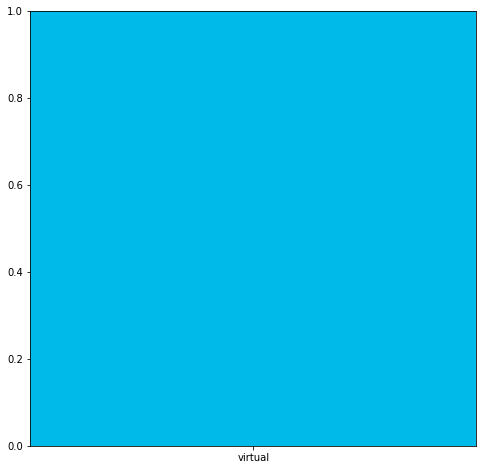

In [60]:
visualize_avg('Manhattan Community Board 8', topxlist)

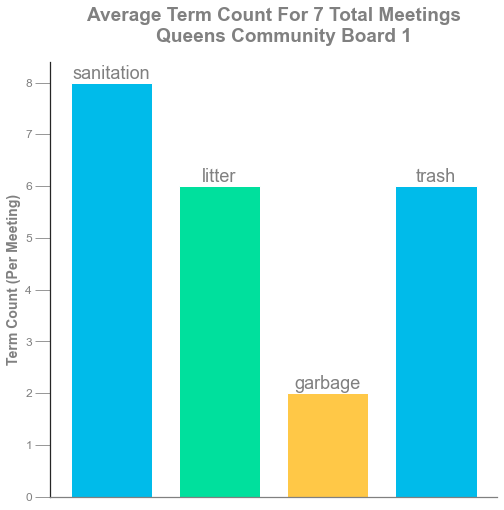

In [529]:
visualize_avg('Queens Community Board 1', topxlist)

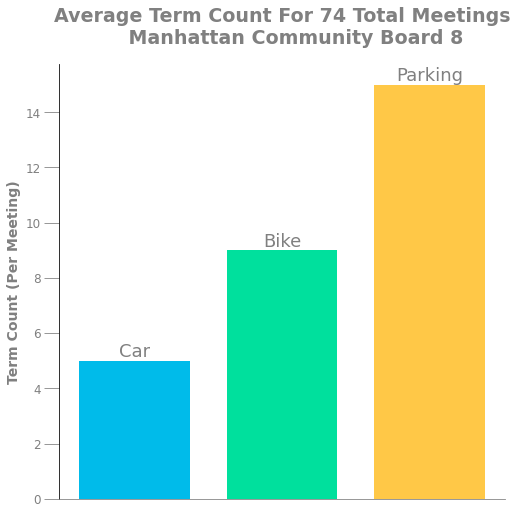

In [842]:
visualize_avg('Manhattan Community Board 8', topxlist)

In [732]:
df[df['author']=='Manhattan Community Board 8'].shape

(74, 23)

In [729]:
#Plot the data:
my_colors_short = ["#FFC847", "#00E09D", "#00BBEA" ]

In [714]:
topxlist = ['Car','Bike','Parking']
d = {}

In [719]:
for i in topxlist:
    d[i] = round(df[df['author']=='Manhattan Community Board 8'][i].mean())

# Time Series

In [72]:
weekly = df.groupby([pd.Grouper(key='publish_date', freq='W')
               ]).sum()

In [73]:
monthly = df.groupby([pd.Grouper(key='publish_date', freq='MS')
               ]).sum()

In [74]:
weekly = weekly.iloc[:,:-1]
monthly = monthly.iloc[:,:-1]

In [232]:
#data = data[data.index > '2020-03-01']#.shape

In [313]:
#weekly = weekly[(weekly.index >= '2020-04-01') & (weekly.index <= monthly.index.max())]

In [75]:
weekly = weekly[(weekly.index >= '2020-04-01')]

In [76]:
monthly = monthly[(monthly.index > '2020-03-01')]

In [65]:
#monthly = monthly[(monthly.index > '2020-03-01') & (monthly.index < '2021-03-01')]#.shape

#weekly = weekly[(weekly.index >= '2020-04-01') & (weekly.index <= data.index.max())]#.shape

In [77]:
monthly.head()

,topic_label_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access
publish_date,,,,,,
2020-04-01,135,128.0,5.0,2.0,0.0,0.0
2020-05-01,156,143.0,11.0,2.0,0.0,0.0
2020-06-01,201,186.0,12.0,2.0,1.0,0.0
2020-07-01,140,118.0,19.0,3.0,0.0,0.0
2020-08-01,78,74.0,3.0,1.0,0.0,0.0


In [66]:
monthly.columns

Index(['topic_label_count', 'virtual', 'Open Meetings Law',
       'public participation', 'Public Officers Law', 'in.person access',
       'Open Meetings Law'],
      dtype='object')

In [99]:
other_topics = weekly[['virtual', 'Open Meetings Law',
       'public participation', 'Public Officers Law', 'in.person access']]

In [530]:
small_subset = weekly[['sanitation','litter', 'garbage', 'trash']]

In [50]:
high_topics = weekly[['Traffic','Car','Parking', "Bike"]]

In [111]:
df.columns

Index(['video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'affordable.housing', 'asian',
       'up.?zonings?', 'chinese', 'hate.crimes?', 'up.zoned?',
       'hate.incidents?'],
      dtype='object')

In [87]:
march = weekly.reset_index()

In [96]:
df.columns

Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'virtual', 'Open Meetings Law',
       'public participation', 'Public Officers Law', 'in.person access',
       'Open Meetings Law', 'key_sentence'],
      dtype='object')

In [ ]:
public officer's law, article 78

In [97]:
df[(df['publish_date']>'2021-03-01') & (df['publish_date']<'2021-04-01') & (df.topic_label_count==43)]#.key_sentence.value_counts()

,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access,Open Meetings Law,key_sentence
561,604e823f7b9dcf683dbac452,IzeM6_KL2hw,Bronx Community Board 12,2021-03-02,Bx CBExecutive Committee Meeting,"[[0.8889419436454773, 'Housing'], [0.012272585...",Or so Kristen I missed your presentation back ...,"{'law': 11, 'body': 10, 'public': 10, 'website...",1:44:37,Open Meetings Law,43,"{'\bOpen Meetings? Law\b': 39, '\bpublic parti...",1.0,39.0,3.0,NaN,NaN,43.0,[\nI did the open meetings law and then that's...


In [ ]:
'virtual', 'Open Meetings Law',
       'public participation', 'Public Officers Law', 'in.person access'

In [90]:
monthly

,topic_label_count,virtual,Open Meetings Law,public participation,Public Officers Law,in.person access
publish_date,,,,,,
2020-04-01,135,128.0,5.0,2.0,0.0,0.0
2020-05-01,156,143.0,11.0,2.0,0.0,0.0
2020-06-01,201,186.0,12.0,2.0,1.0,0.0
2020-07-01,140,118.0,19.0,3.0,0.0,0.0
2020-08-01,78,74.0,3.0,1.0,0.0,0.0
2020-09-01,208,184.0,20.0,3.0,0.0,1.0
2020-10-01,217,202.0,10.0,4.0,1.0,0.0
2020-11-01,178,146.0,13.0,19.0,0.0,0.0
2020-12-01,186,174.0,8.0,4.0,0.0,0.0


In [80]:
test = weekly[['Open Meetings Law']]

In [84]:
test.columns[0]

'Open Meetings Law'

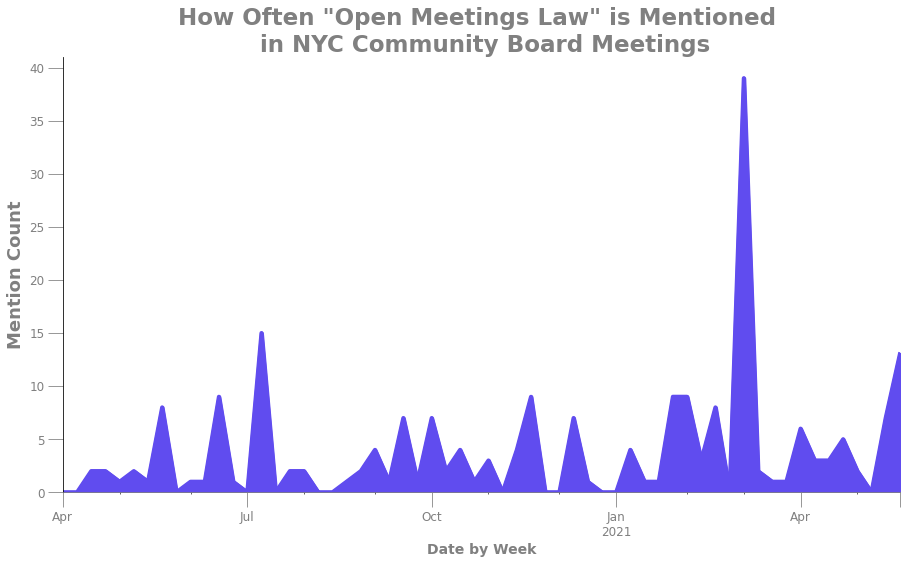

In [85]:
fig, ax = plt.subplots(figsize=(15,8))
#ax.set_prop_cycle(cycler('color', [ "#00E09D",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]) + cycler('lw', [1, 2, 3, 4, 5]))
test.plot.area(ax=ax, linewidth=4, color="#604CEF", legend = False)
ax.set_title(f'How Often "{test.columns[0]}" is Mentioned \n in NYC Community Board Meetings', size=23, weight='bold', c='grey')
ax.set_ylabel('Mention Count', size=18, weight='bold', c='grey')
ax.set_xlabel('Date by Week', size=14, weight='bold', c='grey')
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.spines['bottom'].set_color('grey')
#handles, labels = ax.get_legend_handles_labels()
ax.xaxis.label.set_color('grey')
#ax.tick_params(axis='x', colors='grey',size=15)
ax.get_xaxis().set_visible(True)
ax.tick_params(axis='y', colors='grey',size=15)
ax.tick_params(axis='x', colors='grey',size=15)
#ax.xaxis.label.set_size(20)
#ax.yaxis.label.set_size(20)
# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#ax.legend(loc='upper left', prop={'size': 14})    
#plt.savefig(f'Viz/Topics/HateCrimeWeekly_{datetime.date.today()}.png')
plt.show()

In [521]:
b_group = topic_map.groupby([pd.Grouper(key='publish_date', freq='W'),
                 pd.Grouper('borocd')
               ]).sum()

In [336]:
b_group.tail()

topic_label_count  hate.crimes?  Hate Crime
publish_date borocd                                             
2021-04-11   311                    16            16          16
2021-04-18   101                     1             1           1
             106                    12            12          12
             302                     4             4           4
             405                     1             1           1

In [524]:
b_group.reset_index(inplace=True)

#b_group['Bike_CitiBike'] = b_group['Bike']+b_group['CitiBike']

b_group.set_index('publish_date',inplace=True)

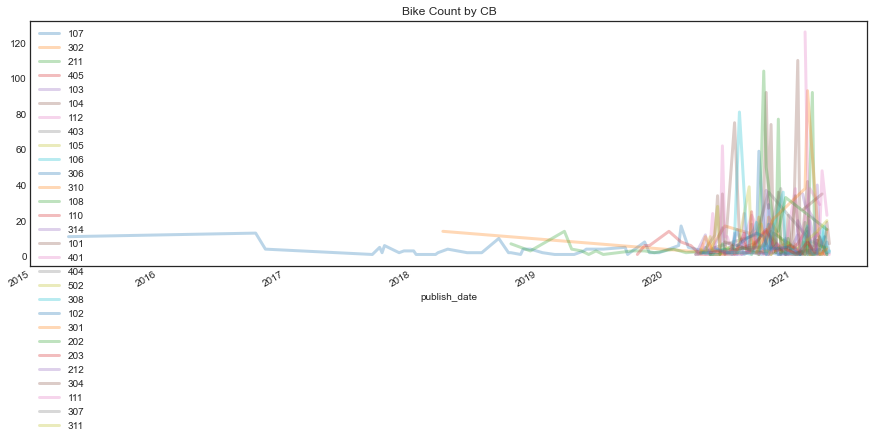

In [526]:
# Was it QCB1 with the Bike Spike?
fig, axes = plt.subplots(figsize=(15, 5))
thres = 0
top_cb = []
for cb in b_group['borocd'].unique():
    if b_group[b_group['borocd']==cb][['Sanitation']].sum().values[0] > thres:
        top_cb.append(cb)


for i in top_cb:
    b_group[b_group['borocd']==i][['Sanitation']].plot(label=i,lw=3, ax = axes,  alpha=0.3)

    axes.legend(labels=top_cb)

plt.title('Bike Count by CB')
plt.show()   

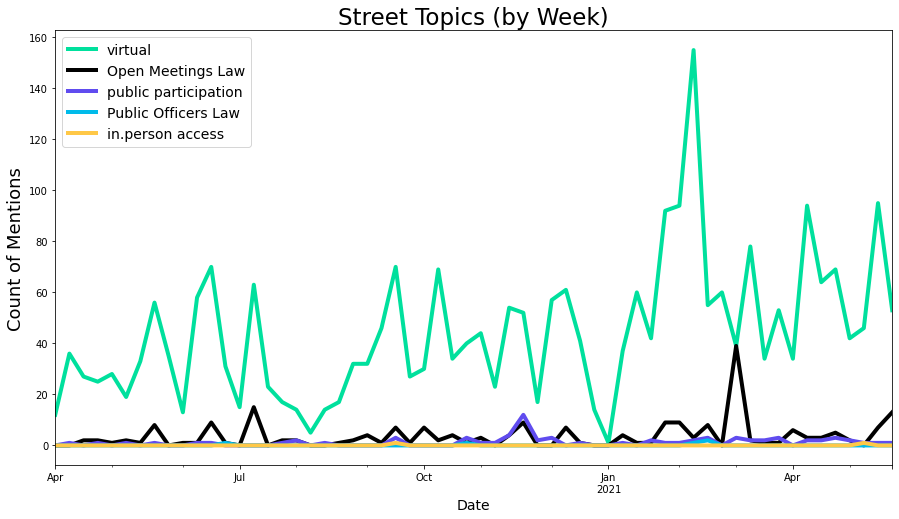

In [100]:
fig, ax = plt.subplots(figsize=(15,8))
ax.set_prop_cycle(cycler('color', [ "#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]) +
                   cycler('lw', [1, 2, 3, 4, 5, 6]))
other_topics.plot(ax=ax, linewidth=4)
ax.set_title('Street Topics (by Week)', size=23)
ax.set_ylabel('Count of Mentions', size=18)
ax.set_xlabel('Date', size=14)
ax.legend(loc='upper left', prop={'size': 14})    
#plt.savefig(f'Viz/Transportation/StreetTypeWeekly_{datetime.date.today()}.png')
plt.show()

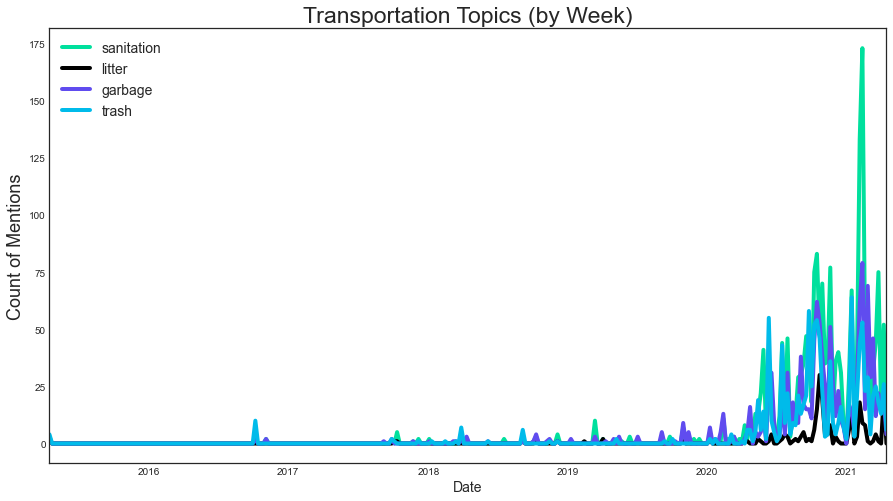

In [531]:
fig, ax = plt.subplots(figsize=(15,8))
ax.set_prop_cycle(cycler('color', [ "#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]) +
                   cycler('lw', [1, 2, 3, 4, 5, 6]))
small_subset.plot(ax=ax, linewidth=4)
ax.set_title('Transportation Topics (by Week)', size=23)
ax.set_ylabel('Count of Mentions', size=18)
ax.set_xlabel('Date', size=14)
ax.legend(loc='upper left', prop={'size': 14})    
#plt.savefig(f'Viz/Transportation/transitTypeWeekly_{datetime.date.today()}.png')
plt.show()

In [56]:
other_topics = monthly[[ 'Parking','Traffic','Transportation', 'DoT', 'Greenway', 'Street Safety']]

In [57]:
small_subset = monthly[['Bus', 'Pedestrian','Traffic','Parking', 'Car', 'Bike']]

In [58]:
high_topics = monthly[['Traffic','Car','Parking', "Bike"]]

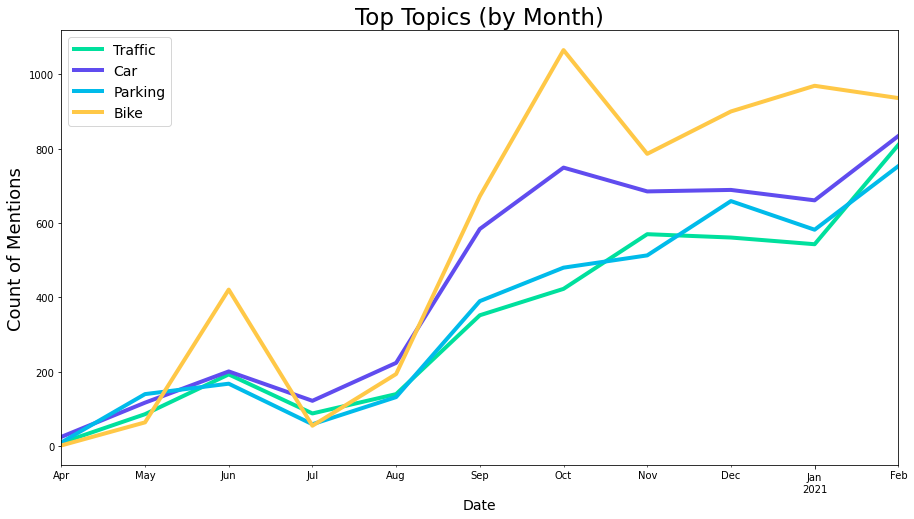

In [53]:
fig, ax = plt.subplots(figsize=(15,8))
ax.set_prop_cycle(cycler('color', [ "#00E09D",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]) +
                   cycler('lw', [1, 2, 3, 4, 5]))
high_topics.plot(ax=ax, linewidth=4)
ax.set_title('Top Topics (by Month)', size=23)
ax.set_ylabel('Count of Mentions', size=18)
ax.set_xlabel('Date', size=14)
ax.legend(loc='upper left', prop={'size': 14})    
plt.savefig(f'Viz/Transportation/Top_topicsMonthly_{datetime.date.today()}.png')
plt.show()

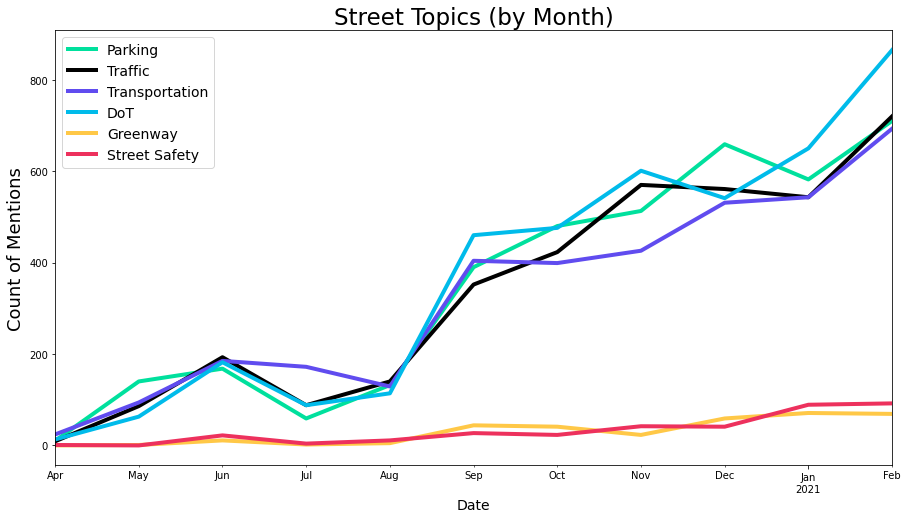

In [132]:
fig, ax = plt.subplots(figsize=(15,8))
ax.set_prop_cycle(cycler('color', [ "#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]) +
                   cycler('lw', [1, 2, 3, 4, 5, 6]))
other_topics.plot(ax=ax, linewidth=4)
ax.set_title('Street Topics (by Month)', size=23)
ax.set_ylabel('Count of Mentions', size=18)
ax.set_xlabel('Date', size=14)
ax.legend(loc='upper left', prop={'size': 14})    
plt.savefig(f'Viz/Transportation/StreetTypeMontly_{datetime.date.today()}.png')
plt.show()

In [ ]:
[ "#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D" ]

In [ ]:
# if only 4 - "#FFC847", "#00E09D", "#00BBEA","#604CEF" 

In [ ]:
"#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D"

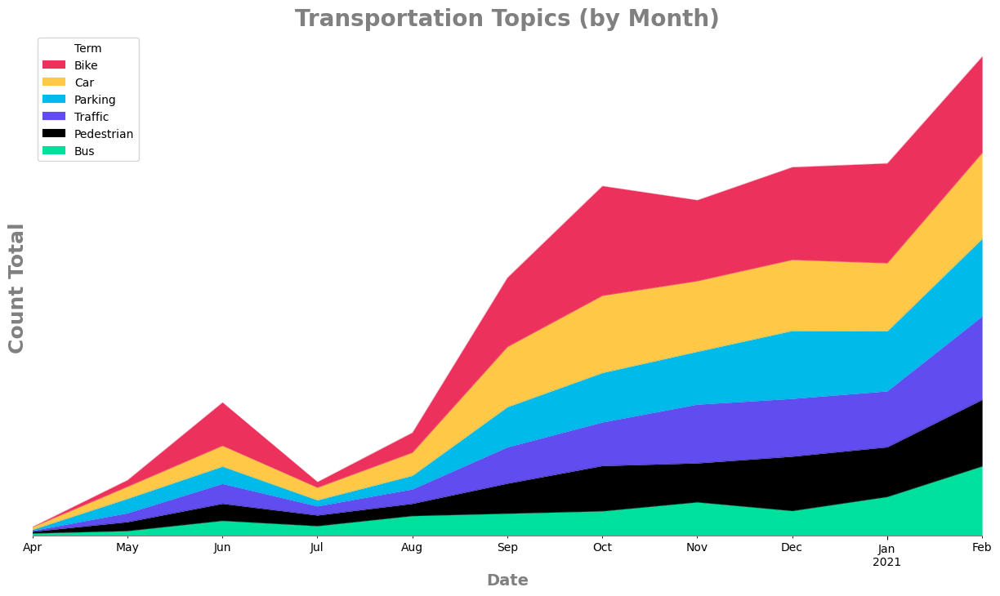

In [167]:
fig, ax = plt.subplots(figsize=(15,8))
ax.set_prop_cycle(cycler('color', ["#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D"]) +
                   cycler('lw', [1, 2, 3, 4,5,6]))
small_subset.plot.area(ax=ax, linewidth=.1, stacked=True)
ax.set_title('Transportation Topics (by Month)', size=20, weight='bold', c='grey')
ax.set_ylabel('Count Total ', size=18, weight='bold', c='grey')
ax.set_xlabel('Date', size=14, weight='bold', c='grey')
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(left=False,labelleft=False)
ax.spines['bottom'].set_color('grey')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left')
ax.xaxis.label.set_color('grey')
#ax.tick_params(axis='x', colors='grey')

# Only show ticks on the left and bottom spines
#ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
#ax.legend(loc='upper left', prop={'size': 14})    
#plt.savefig(f'Viz/Transportation/transitTypeMontly_{datetime.date.today()}.png')
plt.show()

In [61]:
#Plot the data:
my_colors = ["#FFC847", "#00E09D", "#00BBEA","#604CEF" ]

In [851]:
small_subset.columns

Index(['Bus', 'Pedestrian', 'Traffic', 'Parking', 'Car', 'Bike'], dtype='object')

In [532]:
man_cb = topic_map[topic_map['cd_full_title'].str.contains('Manhattan')]#['borocd'].unique()

In [879]:
man_cb['cd_full_title'].unique()

array(['Manhattan Community Board 1', 'Manhattan Community Board 2',
       'Manhattan Community Board 3', 'Manhattan Community Board 4',
       'Manhattan Community Board 5', 'Manhattan Community Board 6',
       'Manhattan Community Board 7', 'Manhattan Community Board 8',
       'Manhattan Community Board 10', 'Manhattan Community Board 12'],
      dtype=object)

In [131]:
my_colors = ["#00E09D","#000000",  "#604CEF",  "#00BBEA","#FFC847","#ED315D"]
topic_focus = ['Bus','Pedestrian','Traffic', 'Parking', 'Car', 'Bike']
col_pal = dict(zip(topic_focus, my_colors))

In [132]:
col_pal

{'Bus': '#00E09D',
 'Pedestrian': '#000000',
 'Traffic': '#604CEF',
 'Parking': '#00BBEA',
 'Car': '#FFC847',
 'Bike': '#ED315D'}

In [537]:
df.columns

Index(['obj_id', 'video_url', 'author', 'publish_date', 'title', 'topic',
       'fullTranscript', 'word_count', 'length', 'topic_label',
       'topic_label_count', 'topic_count', 'sanitation', 'solid.waste',
       'trash', 'litter', 'garbage', 'hauler', 'Sanitation', 'key_sentence'],
      dtype='object')

In [104]:
case_study = ['virtual']

In [106]:
topic_map.index

Int64Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
            ...
            879, 880, 881, 882, 883, 884, 885, 886, 887, 888],
           dtype='int64', length=889)

In [108]:
topic_map.rename(columns={'Open Meetings Law':'oml'},inplace=True)

In [109]:
topic_map[topic_map['cd_full_title']=='Queens Community Board 1']

,borocd,cd_full_title,obj_id,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,virtual,oml,public participation,Public Officers Law,in.person access,oml,key_sentence
843,401,Queens Community Board 1,5fe7e24a539a4d487dc18c52,R4EKhX8Gqio,Queens Community Board 1,2020-06-17,Community Board Queens Meeting,"[[0.3143855035305023, 'Transportation'], [0.20...","Madame, chairman of the board, Marie Tony Olli...","{'bike': 51, 'lane': 47, 'lanes': 21, 'traffic...",2:57:25,Open Meetings Law,7,"{'\bOpen Meetings? Law\b': 2, '\bvirtual\b': 5}",5.0,2.0,NaN,NaN,NaN,7.0,[And so we started taking steps to make sure t...
844,401,Queens Community Board 1,5fe7e32c539a4d487dc18cae,WYtZwaNoe_w,Queens Community Board 1,2020-10-21,Queens Full Board Meeting,"[[0.35772138833999634, 'Housing'], [0.26195615...","Speaking or resorting to R6A, there are r6as m...","{'parking': 3, 'restaurant': 3, 'report': 4, '...",1:16:50,Open Meetings Law,3,{'\bvirtual\b': 3},3.0,NaN,NaN,NaN,NaN,3.0,"[\nIf I may veteran's day, the borough hall is..."
845,401,Queens Community Board 1,5fe7e32d539a4d487dc18cdc,JIRoMz8tXzE,Queens Community Board 1,2020-11-18,Queens Full Board Meeting,"[[0.6782008409500122, 'Housing'], [0.150473758...",Eh Madam chair your meeting is now live. Thank...,"{'windows': 46, 'street': 8, 'building': 4, 'r...",2:01:30,Open Meetings Law,4,{'\bvirtual\b': 4},4.0,NaN,NaN,NaN,NaN,4.0,"[It's virtual, obviously P.M it's on the websi..."
846,401,Queens Community Board 1,5fe7e331539a4d487dc18d68,Ly_DyNmo1DA,Queens Community Board 1,2020-12-16,Queens Full Board Meeting,"[[0.4987127184867859, 'Zoning'], [0.0884551703...","Madam chair, we are now live on YouTube. Thank...","{'building': 13, 'buildings': 11, 'flood': 22,...",1:49:55,Open Meetings Law,1,{'\bvirtual\b': 1},1.0,NaN,NaN,NaN,NaN,1.0,[They have announced that they have a new home...
847,401,Queens Community Board 1,600a0df7ba03c1e5ba6d3390,xwHk_ul-gGQ,Queens Community Board 1,2021-01-20,Community Board Queens,"[[0.5434606075286865, 'Zoning'], [0.2348384857...","As I mentioned, my name is Frank Sinjak, I'm a...","{'building': 30, 'street': 8, 'housing': 16, '...",2:27:28,Open Meetings Law,4,{'\bvirtual\b': 4},4.0,NaN,NaN,NaN,NaN,4.0,"[Since the time of the January 4th meeting, we..."
848,401,Queens Community Board 1,602faaa3fc5b4f6f991a346b,Qx1kSfJBhDc,Queens Community Board 1,2021-02-17,Queens Full Board Meeting,"[[0.30393028259277344, 'Infrastructure'], [0.1...",I think we're ready for I found you muted Paul...,"{'bike': 28, 'business': 21, 'plan': 19, 'sani...",1:56:20,Open Meetings Law,5,{'\bvirtual\b': 5},5.0,NaN,NaN,NaN,NaN,5.0,"[It's good to see you all, even if it's only v..."
849,401,Queens Community Board 1,60526a83d570e8f3f829ad3f,0Zif6W_c1ec,Queens Community Board 1,2021-03-17,Queens Full Board Meeting,"[[0.29647716879844666, 'Elections'], [0.276937...","Madam chair community board, one Queens is now...","{'choice': 27, 'candidate': 16, 'candidates': ...",2:18:45,Open Meetings Law,3,"{'\bpublic participation\b': 2, '\bvirtual\b': 1}",1.0,NaN,2.0,NaN,NaN,3.0,[Excuse me: I'm the deputy district director o...
850,401,Queens Community Board 1,608312e9d0190a797ad234e8,JTHNDTLcDGM,Queens Community Board 1,2021-04-21,Community Board Queens Full Board Meeting,"[[0.5761062502861023, 'Zoning'], [0.1922440528...","Oh on YouTube, okay, thank you good evening.\n...","{'school': 72, 'building': 15, 'station': 15, ...",3:15:39,Open Meetings Law,2,"{'\bpublic participation\b': 1, '\bvirtual\b': 1}",1.0,NaN,1.0,NaN,NaN,2.0,"[It will be virtual on may 6th from 6 p.m, to ..."
851,401,Queens Community Board 1,60aaea366603f15ddc8c5f30,FumlESzqeeA,Queens Community Board 1,2021-05-19,Community Board Queens Full Board Meeting,"[[0.3688329756259918, 'Housing'], [0.277885288...",Going live in three minutes two minutes one mi...,"{'hotel': 26, 'hotels': 16, 'permit': 21, 'pro...",2:33:19,Open Meetings Law,1,{'\bpublic participation\b': 1},NaN,NaN,1.0,

ValueError: cannot reindex from a duplicate axis

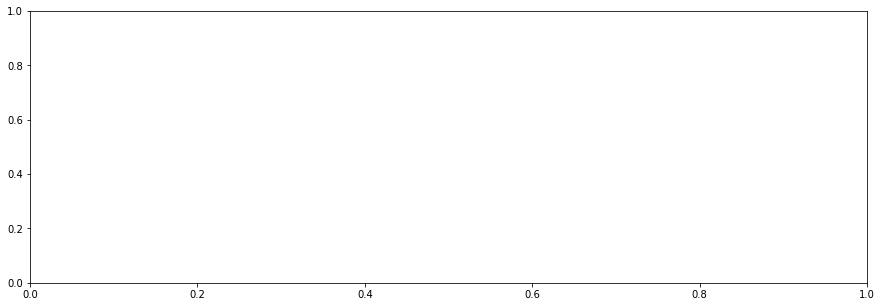

In [105]:
fig, ax = plt.subplots(figsize=(15, 5))
my_colors = ["#00E09D","#604CEF",  "#00BBEA", "#FFC847","#ED315D" ]

# make plot
topic_map.groupby('borocd')[case_study]\
.mean().plot(kind='bar', ax=ax, width=.75,color= my_colors)
handles, labels = ax.get_legend_handles_labels()

# make legend
ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left', bbox_to_anchor=(1.00, 1))

# change axis
#labels = [cb_name.strip('Manhattan ') for cb_name in man_cb['cd_full_title'].unique()]

#ax.set_xticklabels(labels, rotation = 45, ha='right', minor=False)

ax.set_title('Sanitation Topics In NYC', size=20, weight='bold', c='grey')
ax.set_ylabel('Count Average', size=18, weight='bold', c='grey')
ax.set_xlabel('Community Board', size=14, weight='bold', c='grey')
# Hide the right and top spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(bottom=False,labelleft=True)
ax.tick_params(left=False,labelleft=False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.tick_params(axis='x', colors='grey',size=15)
ax.tick_params(axis='y', colors='grey',size=15)

ax.xaxis.label.set_color('grey')
ax.yaxis.label.set_color('grey')


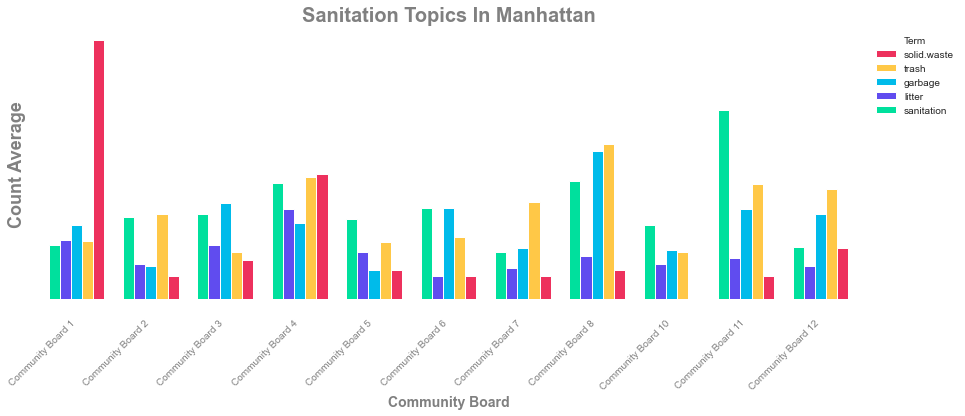

In [541]:
fig, ax = plt.subplots(figsize=(15, 5))
my_colors = ["#00E09D","#604CEF",  "#00BBEA", "#FFC847","#ED315D" ]

# make plot
man_cb.groupby('borocd')[case_study]\
.mean().plot(kind='bar', ax=ax, width=.75,color= my_colors)
handles, labels = ax.get_legend_handles_labels()

# make legend
ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left', bbox_to_anchor=(1.00, 1))

# change axis
labels = [cb_name.strip('Manhattan ') for cb_name in man_cb['cd_full_title'].unique()]

ax.set_xticklabels(labels, rotation = 45, ha='right', minor=False)

ax.set_title('Sanitation Topics In Manhattan', size=20, weight='bold', c='grey')
ax.set_ylabel('Count Average', size=18, weight='bold', c='grey')
ax.set_xlabel('Community Board', size=14, weight='bold', c='grey')
# Hide the right and top spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(bottom=False,labelleft=True)
ax.tick_params(left=False,labelleft=False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.tick_params(axis='x', colors='grey',size=15)
ax.tick_params(axis='y', colors='grey',size=15)

ax.xaxis.label.set_color('grey')
ax.yaxis.label.set_color('grey')

#plt.savefig(f'Viz/Transportation/transitTypeMontly_v1_mean_{datetime.date.today()}.svg')
plt.show()

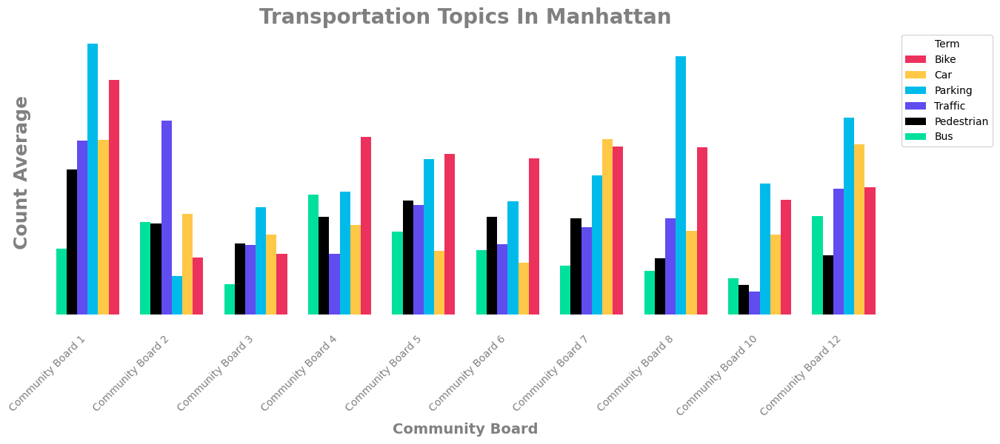

In [152]:
fig, ax = plt.subplots(figsize=(15, 5))
my_colors = ["#00E09D","#000000", "#604CEF",  "#00BBEA","#FFC847","#ED315D"]

# make plot
man_cb.groupby('borocd')[['Bus','Pedestrian','Traffic', 'Parking', 'Car', 'Bike']]\
.mean().plot(kind='bar', ax=ax, width=.75,color= my_colors)
handles, labels = ax.get_legend_handles_labels()

# make legend
ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left', bbox_to_anchor=(1.00, 1))

# change axis
labels = [cb_name.strip('Manhattan ') for cb_name in man_cb['cd_full_title'].unique()]

ax.set_xticklabels(labels, rotation = 45, ha='right', minor=False)

ax.set_title('Transportation Topics In Manhattan', size=20, weight='bold', c='grey')
ax.set_ylabel('Count Average', size=18, weight='bold', c='grey')
ax.set_xlabel('Community Board', size=14, weight='bold', c='grey')
# Hide the right and top spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(bottom=False,labelleft=True)
ax.tick_params(left=False,labelleft=False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.tick_params(axis='x', colors='grey',size=15)
ax.tick_params(axis='y', colors='grey',size=15)

ax.xaxis.label.set_color('grey')
ax.yaxis.label.set_color('grey')

plt.savefig(f'Viz/Transportation/transitTypeMontly_v1_alltopics_{datetime.date.today()}.svg')
plt.show()

In [445]:
topic_map.groupby('borocd')[['Bike']].sum().reset_index().head(1)

,borocd,Bike
0,101,590.0


In [451]:
test = topic_map.groupby([pd.Grouper(key='publish_date', freq='MS'),
                 pd.Grouper('borocd')
               ]).sum().reset_index()

In [456]:
test1 = topic_map[].groupby('borocd')[['Bike']].sum().reset_index()

In [457]:
test1.head(1)

,borocd,Bike
0,101,590.0


In [ ]:
["#7C172B", "#F09596", "#ED315D", "#B83856", "#AB398B"]

In [ ]:
<3 ['#ffffff','#fde9ed','#fbd2db','#f69aaf','#f26f8d','#ef4e74','#ed315d']
['#FFFFFF','#ECFDF8','#D9FBF0','#A8F5DE','#70EEC8','#38E7B3','#00E09D']

In [920]:
1/7*2*2*2

1.1428571428571428

In [ ]:
[(0, '#FFFFFF'),(.15, '#fde9ed'), (.30, '#fbd2db'), (.50, '#f69aaf'),
(.70, '#f26f8d'), (.90, '#ef4e74'), (1, '#ed315d')]

In [591]:
from matplotlib.colors import LinearSegmentedColormap

In [183]:
# create simple linear colormap that maps grey to blue
bike_cmap = LinearSegmentedColormap.from_list(
    'mycmap', [(0, '#FFFFFF'),(.15, '#fde9ed'), (.30, '#fbd2db'), (.60, '#f69aaf'),
(.80, '#f26f8d'),  (1, '#ed315d')])

In [393]:
bus_cmap = LinearSegmentedColormap.from_list(
    'mycmap', [(0, '#FFFFFF'),(.15, '#ECFDF8'), (.30, '#D9FBF0'), (.60, '#A8F5DE'),
(.80, '#70EEC8'),  (1, '#00E09D')])

In [445]:
def map_one_topic_agg(topic, key_topic_df):
    import contextily as ctx
    filter_df = key_topic_df.groupby('borocd')[[topic]].sum().reset_index()
    topic_gdf = cb_geo.merge(filter_df, left_on='boro_cd', right_on='borocd', how='left')
    topic_gdf[topic].fillna(0,inplace=True)
    topic_gdf = topic_gdf.to_crs(epsg=3857)
    
    # remove staten island
    topic_gdf = topic_gdf[topic_gdf['boro_cd'] < 500]
    
    # dark background
    
    fig, axes = plt.subplots(figsize=(10, 8))
    import seaborn
    seaborn.set_style('white', {'legend.frameon':True})
    plt.style.use('seaborn-white')
    
    
    topic_gdf.plot(topic, edgecolor="grey",linewidth=.4, ax=axes, cmap='Purples', 
                   legend=False, scheme='userdefined',classification_kwds={'bins':[0, 25, 80, 170, 300,350]},
                   legend_kwds={'loc': 'lower right'})
    
    #ctx.add_basemap(axes, url=ctx.providers.Stamen.TonerLite, zoom=12)
    
    #ax.axes.set_aspect('auto', 'datalim')
    axes.set_title(f'Total: {key_topic_df.shape[0]} Meetings Mention: "{topic.title()}"')
    axes.get_xaxis().set_visible(False)
    axes.get_yaxis().set_visible(False)
    
    axes.axis('off')
    #legend = plt.legend(loc="upper right", edgecolor="black")
    """leg = axes.get_legend()
    leg.get_texts()[0].set_text('0')
    leg.get_texts()[1].set_text('0 to 25')
    leg.get_texts()[2].set_text('25 to 80')
    leg.get_texts()[3].set_text('80 to 170')
    leg.get_texts()[4].set_text('170 to 300')
    leg.get_texts()[5].set_text('300 to 350')
    leg.get_texts()[6].set_text('More than 350')
    leg.set_title(title="Count of Mentions")"""

    #leg.title('')
    fig.tight_layout()
    plt.savefig(f'Viz/Topics/word_map{topic}_{datetime.date.today()}.png')

In [ ]:
,classification_kwds={'bins':[0, 25, 80, 170, 300,390]}

In [293]:
topic_map.publish_date.min()

Timestamp('2015-04-14 00:00:00')

In [294]:
topic_map.publish_date.max()

Timestamp('2021-03-17 00:00:00')

In [295]:
565/1381

0.4091238233164374

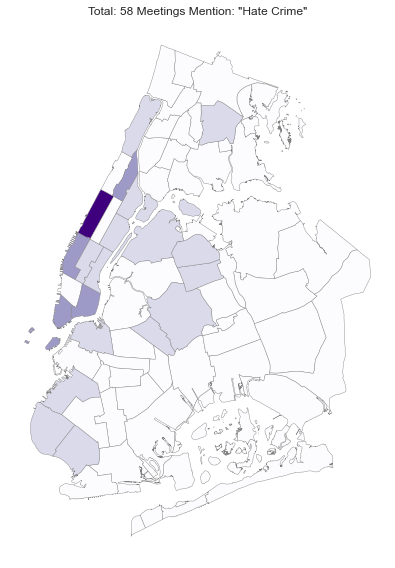

In [446]:
map_one_topic_agg('Hate Crime', topic_map)

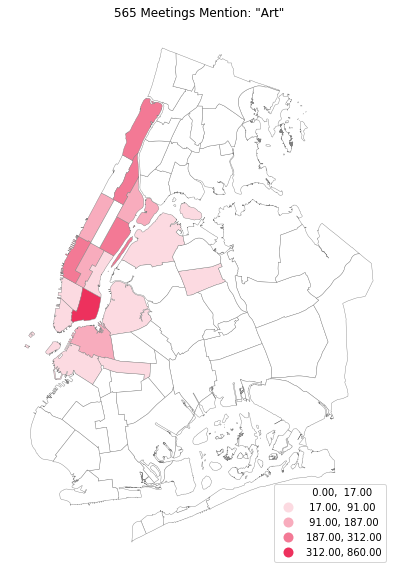

In [257]:
map_one_topic_agg('Art', topic_map)

highest car count = https://blockparty.studio/archive/?_id=5fe7e332539a4d487dc18d87

highest bus count = https://blockparty.studio/archive/?_id=5fe7e245539a4d487dc18bbd

In [91]:
trans_topics[trans_topics['bus']==trans_topics['bus'].max()]

,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,transit,traffic,cars?,bus,trucks?,pedestrians?,walking,vehicles?,transportation,D.?o.?T,bikes?,bicycles?,parking,crash,scooters?,subways?,CitiBikes?,buses,busway,mta,congestion,green.?ways?,Right.of.Way,automobiles?,bicyclists?,biking,cycling,motorcycles?,transport,crashes,trucking,street safety,cyclist,speed.zones?,Vision.Zero
82,m70HxjpLWXQ,Manhattan Community Board 5,2020-08-24,Transportation & Environment Committee Meeting,"[[0.4927915036678314, 'Transportation'], [0.09...","Luke Pj needs the link: okay, I'll resend, it ...","{'street': 19, 'bus': 23, 'bike': 18, 'traffic...",2:10:25,transport,429,"{'transit': 10, 'transportation': 9, 'D.?o.?T'...",10.0,53.0,14.0,72.0,NaN,46.0,1.0,23.0,9.0,48.0,66.0,4.0,9.0,1.0,NaN,2.0,1.0,26.0,25.0,11.0,5.0,NaN,NaN,NaN,2.0,NaN,3.0,NaN,NaN,NaN,1.0,NaN,4.0,NaN,NaN


In [ ]:
# Time to Map it!

In [ ]:
# Maybe we need a baseline as a proportion of all meetings? 

In [682]:
topic_map[topic_map['borocd']==101].publish_date.min()

Timestamp('2020-06-18 00:00:00')

In [162]:
topic_map[topic_map['borocd']==302].head()

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,Parking,DoT,CitiBike,Greenway,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Pedestrian,Truck,Bike_CitiBike
619,302,Brooklyn Community Board 2,VOWykNjXjuw,Brooklyn Community Board 2,2020-06-16,Parks & Recreation Committee,"[[0.9073856472969055, 'Parks'], [0.01812242530...","Five, and also for purposes of transparency, a...","{'parks': 5, 'moment': 2, 'park': 5, 'staff': ...",1:41:08,NaN,NaN,NaN,NaN,NaN,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,4.0,0.0,2.0
620,302,Brooklyn Community Board 2,g3Tucwr3C7E,Brooklyn Community Board 2,2020-09-10,General Meeting,"[[0.3742085099220276, 'Health'], [0.1410507857...","So, thank you.\nEveryone for participating in ...","{'school': 27, 'business': 3, 'health': 23, 'r...",1:46:07,NaN,2.0,1.0,NaN,NaN,6.0,17.0,0.0,2.0,1.0,0.0,8.0,1.0,1.0,0.0,18.0
621,302,Brooklyn Community Board 2,BqU2zjddp24,Brooklyn Community Board 2,2020-12-07,"Health, Environment & Social Services Committe...","[[0.40640291571617126, 'Health'], [0.382737547...","Recording has begun good evening, everyone in ...","{'asthma': 21, 'health': 6, 'emergency': 6, 'e...",2:01:54,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
622,302,Brooklyn Community Board 2,zKeC8VkSvz0,Brooklyn Community Board 2,2020-08-27,Land Use Committee,"[[0.5279223322868347, 'Land Use'], [0.27960482...","All right, I have 604 p.m, and thank you.\nEve...","{'building': 36, 'level': 26, 'parking': 19, '...",1:27:31,20.0,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,4.0,2.0,2.0,0.0,0.0,0.0
623,302,Brooklyn Community Board 2,hTjMrcmSMzo,Brooklyn Community Board 2,2020-10-23,Land Use Committee Meeting,"[[0.19621576368808746, 'Quality of Life'], [0....","I get Irene's there, I understand and Karen I ...","{'block': 11, 'building': 6, 'units': 15, 'win...",1:18:31,3.0,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4.0,0.0,0.0,1.0


https://color.adobe.com/create/color-wheel

In [ ]:
https://medium.com/qri-io/new-qri-dataset-s-nyc-real-time-traffic-speeds-c3e4c88f44be

In [177]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
newcmp = ListedColormap(["#FFFFFF","#00E09D",  "#00BBEA", "#604CEF","#ED315D",   "#000000" ])

In [496]:
def map_one_topic(topic, key_topic_df, start_date, end_date):
    filter_df = key_topic_df[(key_topic_df['publish_date']>start_date)\
         & (key_topic_df['publish_date']< end_date)]\
    .groupby('borocd')[[topic]].sum().reset_index()
    topic_gdf = cb_geo.merge(filter_df, left_on='boro_cd', right_on='borocd', how='left')
    topic_gdf[topic].fillna(0,inplace=True)
    
    # remove staten island
    topic_gdf = topic_gdf[topic_gdf['boro_cd'] < 500]
    
    # white background
    import seaborn
    seaborn.set_style('white', {'legend.frameon':True})
    plt.style.use('seaborn-white')
    
    fig, axes = plt.subplots(figsize=(15, 10))
    
    topic_gdf.plot(topic, edgecolor="grey",linewidth=.4, ax=axes, cmap='Purples', 
                   legend=False, scheme='naturalbreaks')
    
    #ax.axes.set_aspect('auto', 'datalim')
    axes.set_title(datetime.datetime.strptime(start_date, '%Y-%m-%d').strftime('%B %d, %Y') \
                   + f' - "{topic}" Mentioned {filter_df[topic].sum()} Time(s)', size=18, weight='bold', c='grey', y=-0.01)
    axes.get_xaxis().set_visible(False)
    axes.get_yaxis().set_visible(False)
    axes.axis('off')

    #fig.tight_layout()
    plt.savefig(f'Viz/Gifs/Hate/word_map{topic}_{start_date}_{end_date}.png')

In [397]:
week_range = pd.date_range('2020-11-22','2021-04-18', 
              freq='W').strftime("20%y-%m-%d").tolist()
l = week_range
step = 1
grp = 2
week_range_step = [(l+l)[x:x+grp] for x,_ in list(enumerate(l))[::step]]

In [ ]:
.strftime(

In [439]:
from datetime import date
for x, y in week_range_step[:-1]:
    print(x,y)
    print(datetime.datetime.strptime(x, '%Y-%m-%d').strftime('%B %d, %Y'))

2020-11-22 2020-11-29
November 22, 2020
2020-11-29 2020-12-06
November 29, 2020
2020-12-06 2020-12-13
December 06, 2020
2020-12-13 2020-12-20
December 13, 2020
2020-12-20 2020-12-27
December 20, 2020
2020-12-27 2021-01-03
December 27, 2020
2021-01-03 2021-01-10
January 03, 2021
2021-01-10 2021-01-17
January 10, 2021
2021-01-17 2021-01-24
January 17, 2021
2021-01-24 2021-01-31
January 24, 2021
2021-01-31 2021-02-07
January 31, 2021
2021-02-07 2021-02-14
February 07, 2021
2021-02-14 2021-02-21
February 14, 2021
2021-02-21 2021-02-28
February 21, 2021
2021-02-28 2021-03-07
February 28, 2021
2021-03-07 2021-03-14
March 07, 2021
2021-03-14 2021-03-21
March 14, 2021
2021-03-21 2021-03-28
March 21, 2021
2021-03-28 2021-04-04
March 28, 2021
2021-04-04 2021-04-11
April 04, 2021
2021-04-11 2021-04-18
April 11, 2021


In [935]:
month_range = pd.date_range('2019-11-01','2021-03-01', 
              freq='MS').strftime("20%y-%m-%d").tolist()

In [516]:
l = month_range
step = 1
grp = 2
month_range_step = [(l+l)[x:x+grp] for x,_ in list(enumerate(l))[::step]]

In [518]:
month_range_step[0]

['2019-11-01', '2019-12-01']

In [498]:
#from itertools import izip

def grouped(iterable, n):
    "s -> (s0,s1,s2,...sn-1), (sn,sn+1,sn+2,...s2n-1), (s2n,s2n+1,s2n+2,...s3n-1), ..."
    return zip(*[iter(iterable)]*n)

In [468]:
for x, y in week_range_step[::-1]:
    print(x,y)

2020-11-22 2020-11-29
2020-11-29 2020-12-06
2020-12-06 2020-12-13
2020-12-13 2020-12-20
2020-12-20 2020-12-27
2020-12-27 2021-01-03
2021-01-03 2021-01-10
2021-01-10 2021-01-17
2021-01-17 2021-01-24
2021-01-24 2021-01-31
2021-01-31 2021-02-07
2021-02-07 2021-02-14
2021-02-14 2021-02-21
2021-02-21 2021-02-28
2021-02-28 2021-03-07
2021-03-07 2021-03-14
2021-03-14 2021-03-21
2021-03-21 2021-03-28
2021-03-28 2021-04-04
2021-04-04 2021-04-11
2021-04-11 2021-04-18
2021-04-18 2020-11-22


In [461]:
"""for x, y in month_range_step[::]:
    print(x,y)"""

'for x, y in month_range_step[::]:\n    print(x,y)'

In [471]:
import imageio
import os

In [466]:
import warnings
warnings.filterwarnings('ignore')

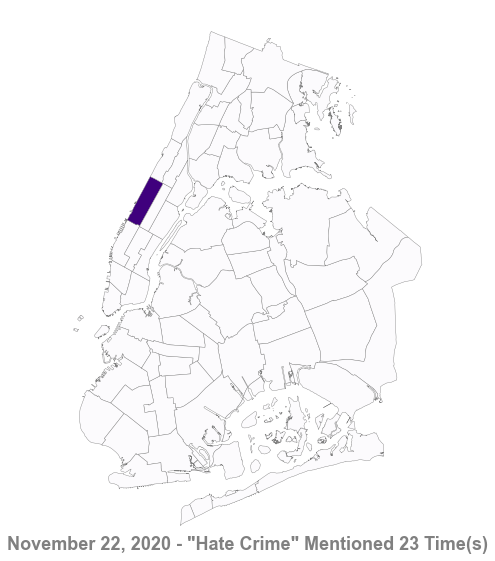

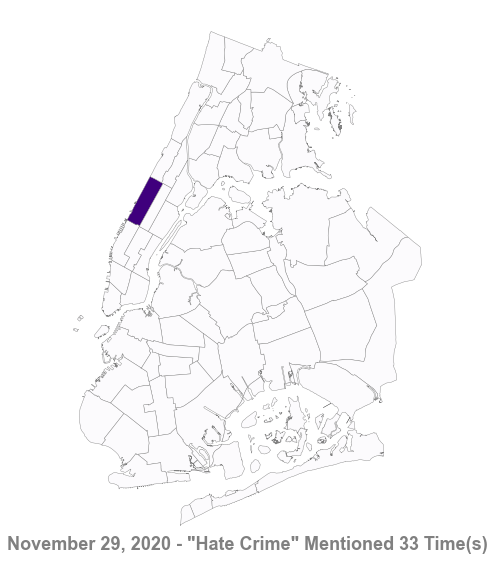

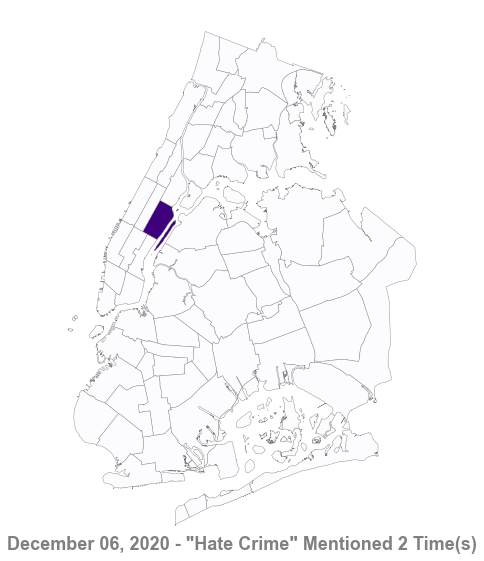

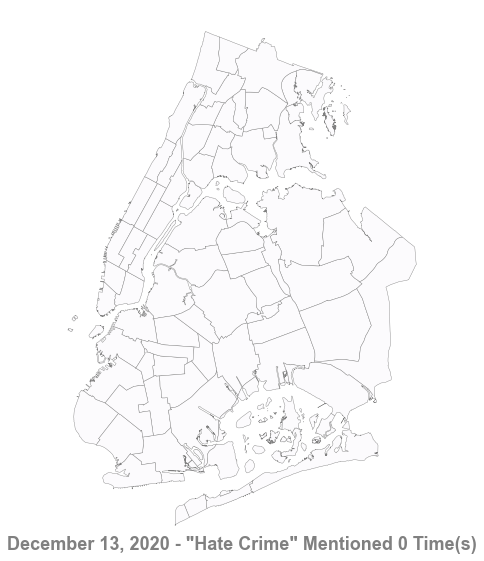

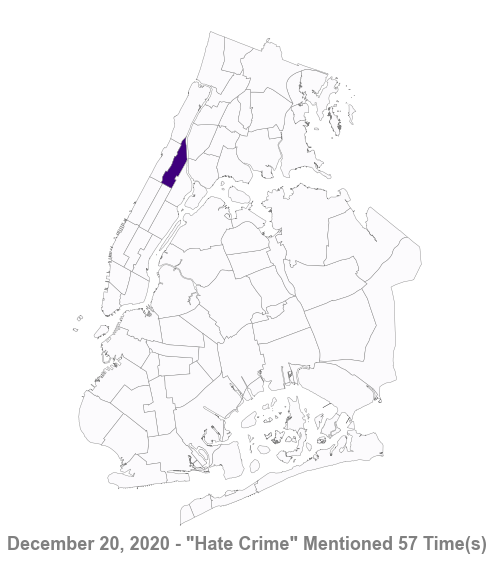

...

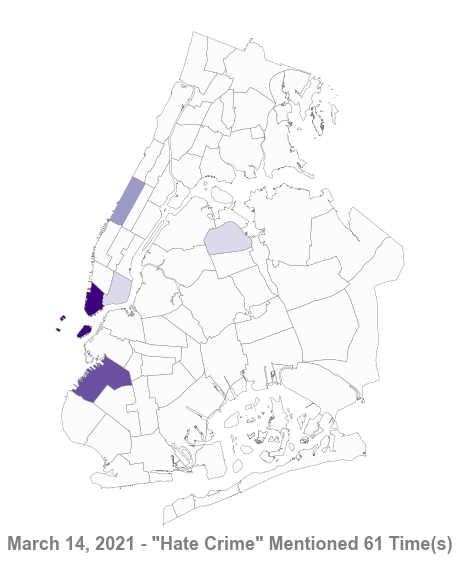

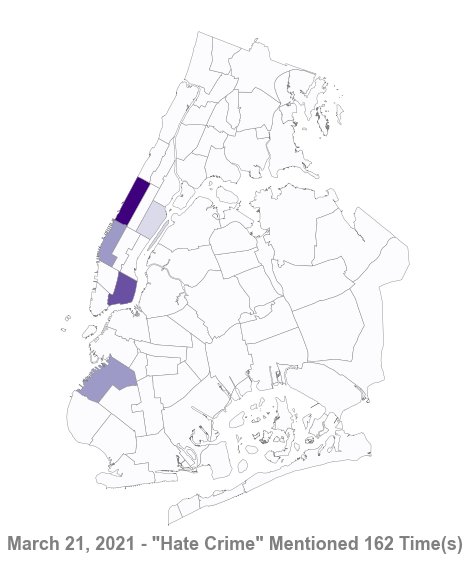

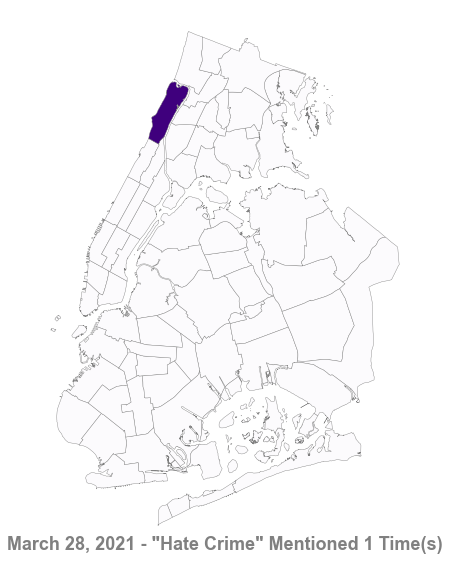

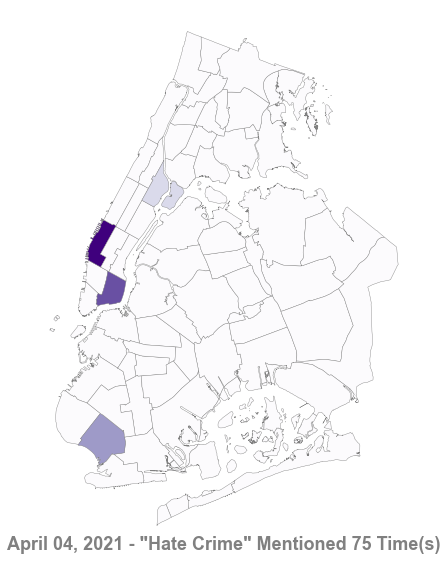

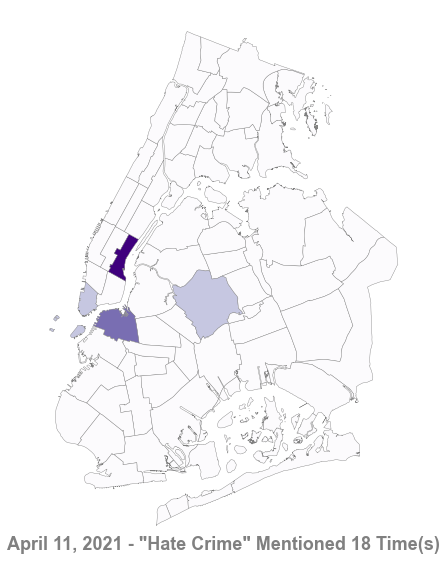

In [497]:
for x, y in week_range_step[:-1]:
    #print(x,y)
    map_one_topic('Hate Crime', topic_map, x, y)

In [476]:
directory = 'Viz/Gifs/Hate'

In [ ]:
os.path.join(subdir, file)

In [ ]:
frames = []

# Load each file into a list
for root, dirs, filenames in os.walk(indir):
  for filename in filenames:
    if filename.endswith(".jpg"):
        print(filename)
        frames.append(imageio.imread(indir + "/" + filename))


# Save them as frames into a gif 
exportname = "output.gif"
kargs = { 'duration': 5 }
imageio.mimsave(exportname, frames, 'GIF', **kargs)

In [499]:
# Build GIF

frames = []

for filename in sorted(os.listdir(directory)):
    print(os.path.join(directory,filename))
    if filename.endswith(".png"):
        frames.append(imageio.imread(os.path.join(directory,filename)))

            
# Save them as frames into a gif 
exportname = "hatecrime.gif"
imageio.mimsave(exportname, frames, format='GIF', duration=1)          

Viz/Gifs/Hate/.ipynb_checkpoints
Viz/Gifs/Hate/word_mapHate Crime_2020-11-22_2020-11-29.png
Viz/Gifs/Hate/word_mapHate Crime_2020-11-29_2020-12-06.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-06_2020-12-13.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-13_2020-12-20.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-20_2020-12-27.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-27_2021-01-03.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-03_2021-01-10.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-10_2021-01-17.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-17_2021-01-24.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-24_2021-01-31.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-31_2021-02-07.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-07_2021-02-14.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-14_2021-02-21.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-21_2021-02-28.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-28_2021-03-07.png
Viz/Gifs/Hate/word_mapHate Crime_2021-03-07_2021-03-14.png
Viz/Gifs/Hate/word_mapH

In [486]:
# Build GIF
with imageio.get_writer('mygif.gif', mode='I') as writer:
    for filename in sorted(os.listdir(directory)):
        print(os.path.join(directory,filename))
        if filename.endswith(".png"):
            image = imageio.imread(os.path.join(directory,filename))
            writer.append_data(image)

Viz/Gifs/Hate/.ipynb_checkpoints
Viz/Gifs/Hate/word_mapHate Crime_2020-11-22_2020-11-29.png
Viz/Gifs/Hate/word_mapHate Crime_2020-11-29_2020-12-06.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-06_2020-12-13.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-13_2020-12-20.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-20_2020-12-27.png
Viz/Gifs/Hate/word_mapHate Crime_2020-12-27_2021-01-03.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-03_2021-01-10.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-10_2021-01-17.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-17_2021-01-24.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-24_2021-01-31.png
Viz/Gifs/Hate/word_mapHate Crime_2021-01-31_2021-02-07.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-07_2021-02-14.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-14_2021-02-21.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-21_2021-02-28.png
Viz/Gifs/Hate/word_mapHate Crime_2021-02-28_2021-03-07.png
Viz/Gifs/Hate/word_mapHate Crime_2021-03-07_2021-03-14.png
Viz/Gifs/Hate/word_mapH

In [502]:
topic_map[(topic_map['publish_date']>'2020-11-01')\
         & (topic_map['publish_date']< '2020-12-01')]\
    .groupby('borocd')[['Bike']].sum().reset_index()

,borocd,Bike
0,101,214.0
1,103,39.0
2,104,59.0
3,105,13.0
4,106,35.0
5,107,66.0
6,108,94.0
7,110,5.0
8,112,31.0
9,202,12.0


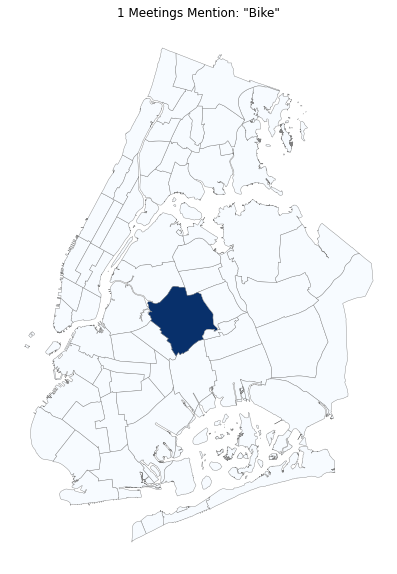

In [496]:
map_one_topic('Bike', topic_map, month_range[0],month_range[1])

In [ ]:
, classification_kwds={'bins':[0, 100, 200, 300, 400]}, scheme='naturalbreaks',
                  legend_kwds={'loc': 'lower right'}

In [144]:
topic_map['Bike_CitiBike'] = topic_map['Bike'].fillna(0) + topic_map['CitiBike'].fillna(0)

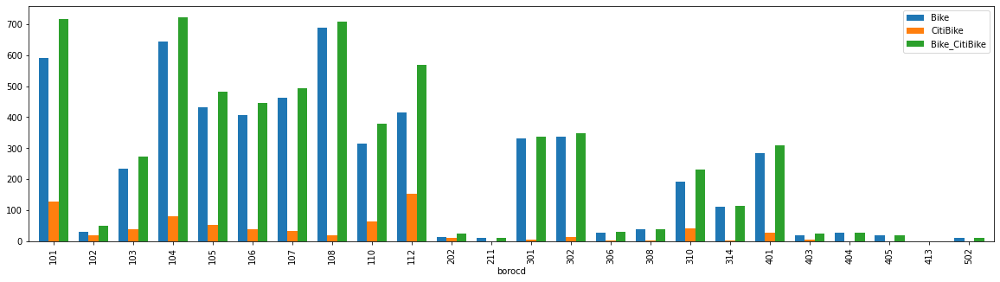

In [146]:
fig, axes = plt.subplots(figsize=(20, 5))
topic_map.groupby('borocd')[['Bike','CitiBike','Bike_CitiBike']].sum().plot(kind='bar', ax= axes, width=.75 )

In [978]:
plt.rcParams.update(plt.rcParamsDefault)

<AxesSubplot:xlabel='borocd'>

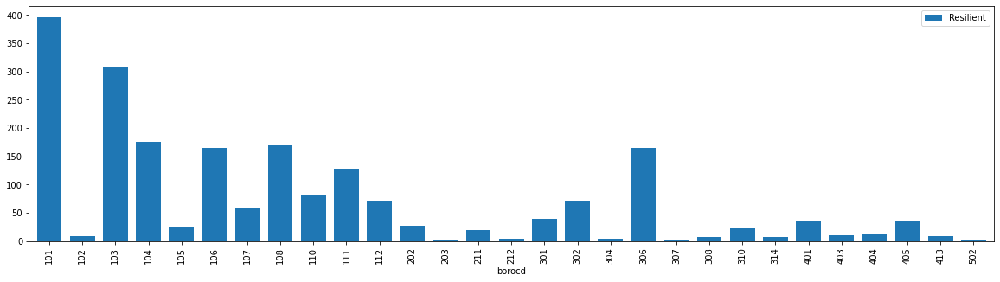

In [445]:
fig, axes = plt.subplots(figsize=(20, 5))
topic_map.groupby('borocd')[[
         'Resilient']].sum().plot(kind='bar', ax= axes, width=.75 )

Interesting relationship between Parking and Traffic, do these have collinearity?

In [68]:
b_group = topic_map.groupby([pd.Grouper(key='publish_date', freq='MS'),
                 pd.Grouper('borocd')
               ]).sum()

In [70]:
b_group.reset_index(inplace=True)

In [71]:
b_group['Bike_CitiBike'] = b_group['Bike']+b_group['CitiBike']

In [72]:
b_group.set_index('publish_date',inplace=True)

In [332]:
"""for i in range(len(b_group['borocd'].unique())):
    b_group[b_group['borocd']==b_group['borocd'].unique()[i]][['Parking','Subway']].plot(legend=True,lw=2)
    plt.title(b_group['borocd'].unique()[i])"""

"for i in range(len(b_group['borocd'].unique())):\n    b_group[b_group['borocd']==b_group['borocd'].unique()[i]][['Parking','Subway']].plot(legend=True,lw=2)\n    plt.title(b_group['borocd'].unique()[i])"

In [73]:
b_group.head(10)

,borocd,Parking,DoT,CitiBike,Greenway,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Pedestrian,Truck,Bike_CitiBike
publish_date,,,,,,,,,,,,,,,,,
2019-11-01,405,1.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,0.0,4.0,0.0,1.0,11.0,3.0,2.0,2.0
2020-01-01,405,0.0,3.0,0.0,0.0,0.0,8.0,1.0,0.0,13.0,1.0,0.0,31.0,9.0,2.0,3.0,1.0
2020-02-01,102,4.0,8.0,0.0,0.0,0.0,2.0,3.0,0.0,4.0,16.0,1.0,3.0,15.0,3.0,4.0,3.0
2020-02-01,405,7.0,6.0,0.0,0.0,0.0,24.0,3.0,0.0,23.0,32.0,1.0,80.0,36.0,4.0,6.0,3.0
2020-03-01,102,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,1.0,7.0,0.0,1.0,1.0,3.0,0.0,0.0
2020-03-01,103,1.0,4.0,0.0,0.0,0.0,6.0,8.0,0.0,1.0,5.0,0.0,0.0,2.0,0.0,0.0,8.0
2020-03-01,211,2.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,0.0,0.0,0.0,3.0,1.0,3.0,0.0,2.0
2020-03-01,405,17.0,1.0,0.0,0.0,0.0,7.0,0.0,0.0,4.0,18.0,0.0,9.0,21.0,1.0,4.0,0.0
2020-04-01,103,1.0,4.0,0.0,0.0,0.0,6.0,1.0,0.0,0.0,5.0,0.0,5.0,1.0,10.0,3.0,1.0


In [440]:
b_group.head()

,borocd,Parking,DoT,CitiBike,Greenway,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Pedestrian,Truck,Bike_CitiBike
publish_date,,,,,,,,,,,,,,,,,
2019-11-01,405,1.0,0.0,0.0,0.0,0.0,4.0,2.0,0.0,0.0,4.0,0.0,1.0,11.0,3.0,2.0,2.0
2020-01-01,405,0.0,3.0,0.0,0.0,0.0,8.0,1.0,0.0,13.0,1.0,0.0,31.0,9.0,2.0,3.0,1.0
2020-02-01,102,4.0,8.0,0.0,0.0,0.0,2.0,3.0,0.0,4.0,16.0,1.0,3.0,15.0,3.0,4.0,3.0
2020-02-01,405,7.0,6.0,0.0,0.0,0.0,24.0,3.0,0.0,23.0,32.0,1.0,80.0,36.0,4.0,6.0,3.0
2020-03-01,102,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,1.0,7.0,0.0,1.0,1.0,3.0,0.0,0.0


In [343]:
b_group['Bike'].describe()

count    180.000000
mean      31.316667
std       51.086352
min        0.000000
25%        1.000000
50%        6.500000
75%       43.000000
max      262.000000
Name: Bike, dtype: float64

In [350]:
b_group[b_group['borocd']==401][['Bike']].cumsum().values

array([[167.],
       [170.],
       [186.],
       [195.],
       [226.],
       [284.]])

In [346]:
for i in b_group['borocd'].unique():
    print(i)
    print(b_group[b_group['borocd']==i][['Bike']].cumsum().values[0])

405
[2.]
102
[3.]
103
[8.]
211
[2.]
306
[1.]
310
[0.]
403
[0.]
104
[22.]
110
[6.]
302
[3.]
314
[2.]
502
[0.]
101
[1.]
105
[80.]
107
[0.]
112
[98.]
308
[9.]
401
[167.]
404
[4.]
106
[3.]
108
[4.]
301
[3.]
413
[0.]
202
[12.]


104
110
302
101
105
107
112
401
106
108
301


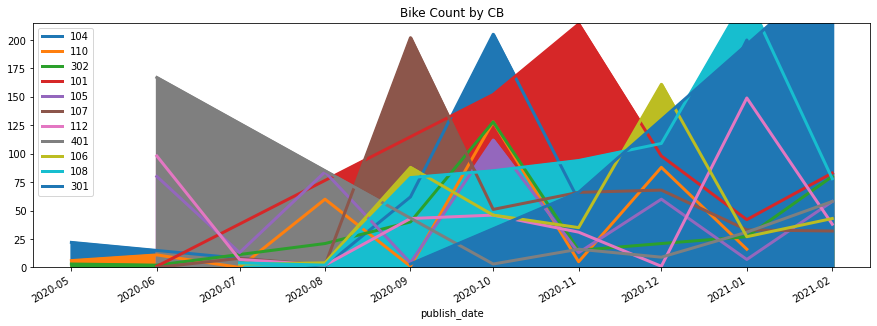

In [355]:
# Was it QCB1 with the Bike Spike?
fig, axes = plt.subplots(figsize=(15, 5))
thres = 280
top_cb = []
for cb in b_group['borocd'].unique():
    if b_group[b_group['borocd']==cb][['Bike']].sum().values[0] > thres:
        top_cb.append(cb)


for i in top_cb:
    print(i)
    b_group[b_group['borocd']==i][['Bike']].plot.area(label=i,lw=3, ax = axes)

    axes.legend(labels=top_cb)

plt.title('Bike Count by CB')
plt.show()    

In [ ]:
my_colors = ["#00E09D","#604CEF",  "#00BBEA", "#FFC847"]

# make plot
man_cb.groupby('borocd')[['Bus', 'Traffic', 'Parking', 'Car']]\

In [170]:
def cb_time_series(cb_id):
    fig, ax = plt.subplots(figsize=(15, 5))
    ax.set_prop_cycle(cycler('color', ["#00E09D","#000000", "#604CEF",  "#00BBEA","#FFC847","#ED315D"]) +
                   cycler('lw', [1, 2, 3, 4,5,6]))

    b_group[b_group['borocd']==cb_id][['Bus','Pedestrian','Traffic', 'Parking', 'Car', 'Bike']]\
    .plot.area(legend=True,linewidth=.1, stacked=True, ax = ax)
    
    cb_name = topic_map[topic_map['borocd']==cb_id]['author'].values[0]
    ax.set_title(f'{cb_name} \n Transportation Topics (by Month)', size=20, weight='bold', c='grey')
    ax.set_ylabel('Count Total ', size=18, weight='bold', c='grey')
    ax.set_xlabel('Date', size=14, weight='bold', c='grey')
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.tick_params(left=False,labelleft=False)
    ax.spines['bottom'].set_visible(False)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left')
    ax.xaxis.label.set_color('grey')
    ax.tick_params(axis='x', colors='grey')
    # make legend
    ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left', bbox_to_anchor=(1.00, 1))

    # Only show ticks on the left and bottom spines
    #ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    monthyearFmt = mdates.DateFormatter('%B')
    ax.xaxis.set_major_formatter(monthyearFmt)
    
    #plt.savefig(f'Viz/Transportation/timeseries{cb_id}_{datetime.date.today()}.svg')
    plt.show()

In [147]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

In [101]:
import matplotlib.dates as mdates
import numpy as np
converter = mdates.ConciseDateConverter()
munits.registry[np.datetime64] = converter
munits.registry[datetime.date] = converter
munits.registry[datetime.datetime] = converter



In [ ]:
.strftime("%d-%B")

In [ ]:
cb_time_series(401)

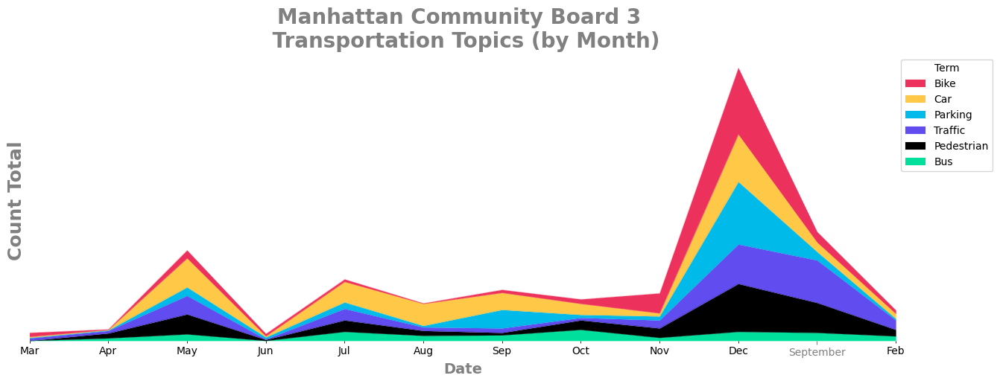

In [172]:
cb_time_series(103)

In [ ]:
my_colors = ["#00E09D","#604CEF",  "#00BBEA", "#FFC847"]

# make plot
man_cb.groupby('borocd')[['Bus', 'Traffic', 'Parking', 'Car']]\

In [165]:
def cb_time_series_bus(cb_id):
    fig, ax = plt.subplots(figsize=(15, 5))
    ax.set_prop_cycle(cycler('color', ["#00E09D","#604CEF",  "#00BBEA", "#FFC847"]) +
                   cycler('lw', [1, 2, 3, 4]))

    b_group[b_group['borocd']==cb_id][['Bus', 'Traffic', 'Parking', 'Car']]\
    .plot(legend=True,linewidth=5,  ax = ax)
    
    cb_name = topic_map[topic_map['borocd']==cb_id]['author'].values[0]
    ax.set_title(f'{cb_name} \n Transportation Topics (by Month)', size=20, weight='bold', c='grey')
    ax.set_ylabel('Count Total ', size=18, weight='bold', c='grey')
    ax.set_xlabel('Date', size=14, weight='bold', c='grey')
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.tick_params(left=False,labelleft=False)
    ax.spines['bottom'].set_visible(False)
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left')
    ax.xaxis.label.set_color('grey')
    #ax.tick_params(axis='x', colors='grey')
    # make legend
    ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left', bbox_to_anchor=(1.00, 1))

    # Only show ticks on the left and bottom spines
    #ax.yaxis.set_ticks_position('left')
    
    plt.savefig(f'Viz/Transportation/timeseries_BUS_not_area{cb_id}_{datetime.date.today()}.svg')
    plt.show()

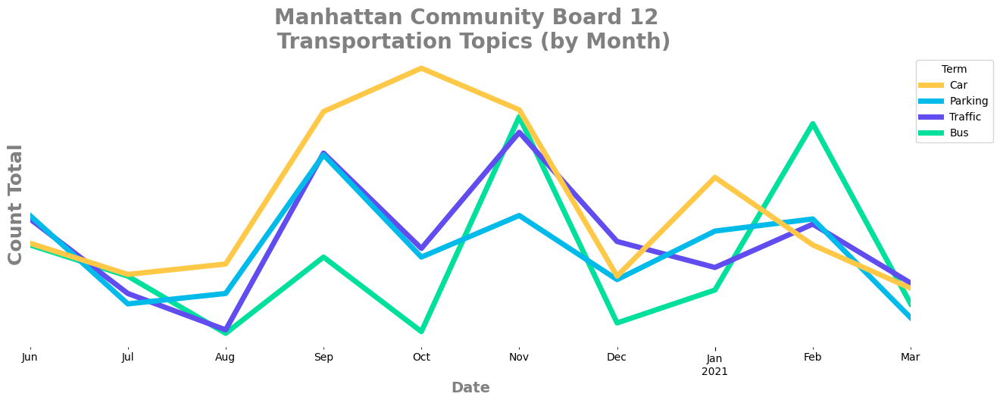

In [166]:
cb_time_series_bus(112)

In [ ]:

small_subset.plot.area(ax=ax, linewidth=.1, stacked=True)
ax.set_title('Transportation Topics (by Month)', size=20, weight='bold', c='grey')
ax.set_ylabel('Count Total ', size=18, weight='bold', c='grey')
ax.set_xlabel('Date', size=14, weight='bold', c='grey')
# Hide the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(left=False,labelleft=False)
ax.spines['bottom'].set_color('grey')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title='Term', loc='upper left')
ax.xaxis.label.set_color('grey')
#ax.tick_params(axis='x', colors='grey')

# Only show ticks on the left and bottom spines
#ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
#ax.legend(loc='upper left', prop={'size': 14})    
plt.savefig(f'Viz/Transportation/transitTypeMontly_{datetime.date.today()}.svg')

Text(0.5, 1.0, '401')

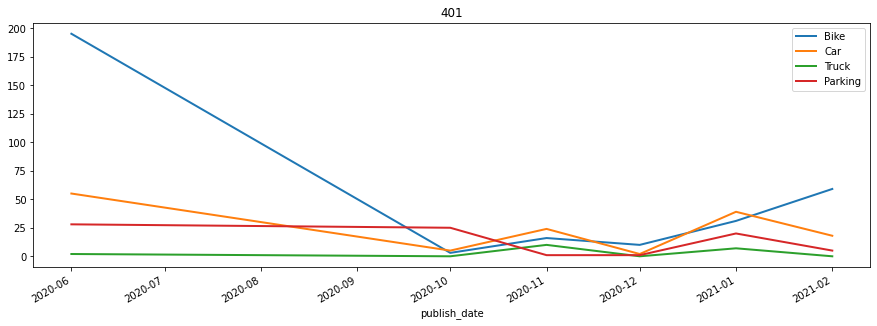

In [74]:
fig, axes = plt.subplots(figsize=(15, 5))
cb_id = 401
b_group[b_group['borocd']==cb_id][['Bike','Car','Truck','Parking']].plot(legend=True,lw=2, ax = axes)
plt.title(cb_id)

Text(0.5, 1.0, '401 CB1 Q')

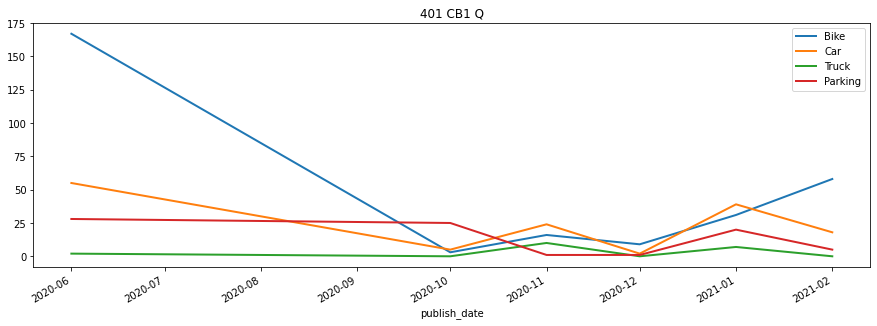

In [272]:
fig, axes = plt.subplots(figsize=(15, 5))
b_group[b_group['borocd']==401][['Bike','Car','Truck','Parking']].plot(legend=True,lw=2, ax = axes)
plt.title('401 CB1 Q')

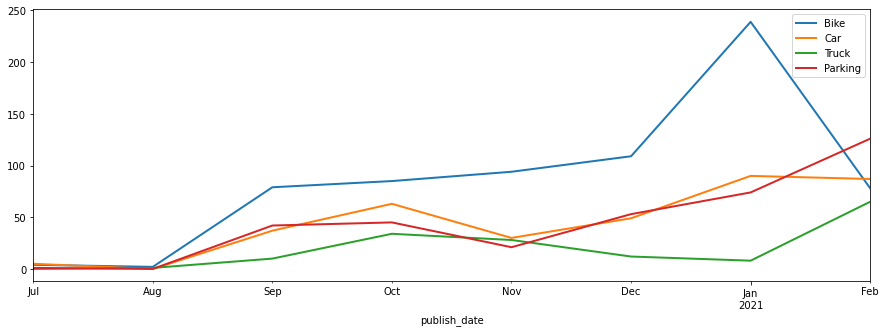

In [271]:
fig, axes = plt.subplots(figsize=(15, 5))
b_group[b_group['borocd']==108][['Bike','Car','Truck','Parking']].plot(legend=True,lw=2, ax = axes)

In [310]:
def timeSeriesTopic(topic_list):
    fig, axes = plt.subplots(figsize=(15, 5))
    b_group[b_group['borocd']==112][topic_list].plot(lw=2, ax= axes,c='r')
    b_group[b_group['borocd']==104][topic_list].plot(lw=2, ax= axes,c='b')
    b_group[b_group['borocd']==108][topic_list].plot(lw=2, ax= axes,c='g')
    plt.title(topic_list)
    plt.show()

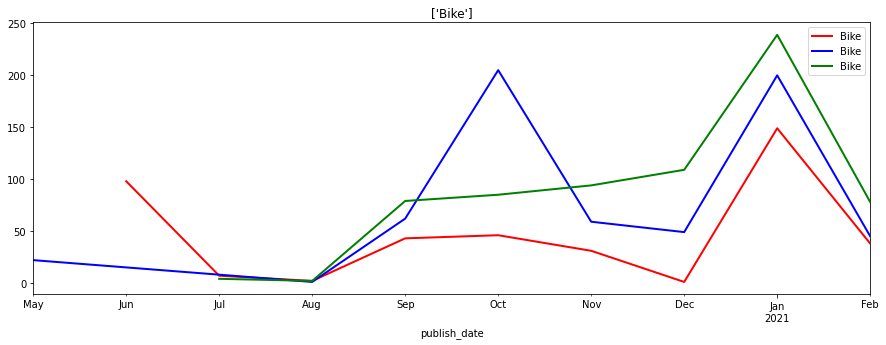

In [315]:
timeSeriesTopic(['Bike'])

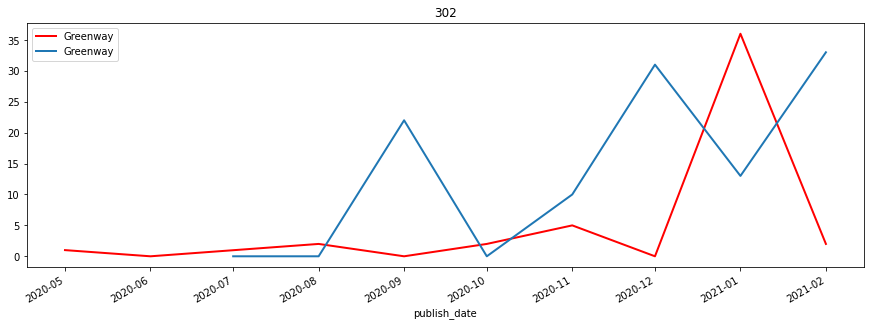

In [199]:
fig, axes = plt.subplots(figsize=(15, 5))
b_group[b_group['borocd']==302][['Greenway']].plot(lw=2, ax= axes, c='r')
b_group[b_group['borocd']==106][['Greenway']].plot(lw=2, ax= axes)
plt.title('302')
plt.show()

In [160]:
topic_map['publish_date'] = pd.to_datetime(topic_map['publish_date'])  

In [165]:
topic_map[topic_map['Greenway']==topic_map['Greenway'].max()]

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,Parking,DoT,CitiBike,Greenway,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Pedestrian,Truck,Bike_CitiBike
663,302,Brooklyn Community Board 2,HuaMN6FnI6E,Brooklyn Community Board 2,2021-01-14,Parks & Recreation Committee Meeting,"[[0.641738772392273, 'Parks'], [0.097446672618...",The Brooklyn community board 2 parks and Recre...,"{'bathroom': 16, 'park': 10, 'project': 4, 'gr...",1:56:23,6.0,2.0,NaN,33.0,NaN,2.0,8.0,0.0,0.0,0.0,0.0,0.0,2.0,3.0,1.0,8.0


In [ ]:
df[df.topic_count == {}]

In [120]:
df[df.topic_count == {}]

,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,affordable.housing,asian,up.?zonings?,chinese,hate.crimes?,up.zoned?,hate.incidents?
3,n96Xzbg7Fls,Manhattan Community Board 12,2020-11-06,Health & Environment,"[[0.616631269454956, 'Health'], [0.03978963568...",And with the restaurants and this open street ...,"{'services': 15, 'health': 15, 'fireworks': 36...",3:07:09,upzone,1,{},NaN,NaN,NaN,NaN,NaN,NaN,NaN
214,f2nqFw0_4I0,Manhattan Community Board 12,2020-11-11,Business Development Committee Meeting,"[[0.15718063712120056, 'Employment'], [0.11110...","Hey Ashley, I'm so sorry, I thought we were on...","{'businesses': 14, 'business': 16, 'partners':...",1:33:27,upzone,1,{},NaN,NaN,NaN,NaN,NaN,NaN,NaN
316,ZpSYiF7cjbs,Manhattan Community Board 8,2021-01-30,Social Justice Committee Meeting,"[[0.173096165060997, 'Landmarks'], [0.12867909...",So maybe I'll ask you to do it again sure wait...,"{'officials': 25, 'capital': 4, 'police': 6, '...",1:52:45,upzone,1,{},NaN,NaN,NaN,NaN,NaN,NaN,NaN
373,TBTAeV0jGFE,Manhattan Community Board 1,2021-02-22,Executive Committee –,"[[0.49472182989120483, 'Elections'], [0.222409...","Tammy we are now recording okay, that should w...","{'elections': 4, 'island': 6, 'street': 5, 'ba...",1:37:00,upzone,1,{},NaN,NaN,NaN,NaN,NaN,NaN,NaN
491,_AJszAb2JP8,Manhattan Community Board 8,2020-06-22,Youth Committee Zoom Meeting,"[[0.17430277168750763, 'Education'], [0.116158...",Just for the recording this is the Monday June...,"{'lives': 13, 'racism': 8, 'school': 13, 'ally...",1:38:46,upzone,1,{},NaN,NaN,NaN,NaN,NaN,NaN,NaN


In previous times, we've been doing the breaking bread building bonds initiative. We have several partners in regards to this initiative, where we have dinners of 10 to 12. People of various backgrounds sit together and discuss their differences and the commonalities and I'm happy to say some of the CB2 members have participated, but I don't know if you realize that one of our partners is the chinese-american planning councils project reach, which does a lot of work in terms of anti-racism and holding classes and so forth.

https://blockparty.studio/Archive/?_id=604a99080ae4135e852a0c63

In [450]:
df.sort_values(['topic_label_count', 'publish_date'], ascending=[False,False]).head(20)

,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,topic_label,topic_label_count,topic_count,\bresiliency\b,\bresilient\b,\bresilience\b,Resilient
2,g1gcT-cVsWM,Manhattan Community Board 8,2020-12-10,Land Use Committee Meeting,"[[0.541478157043457, 'Zoning'], [0.09162350744...","Foreign me, okay, will tell me when it's a goo...","{'building': 47, 'buildings': 29, 'flood': 38,...",3:14:40,Resilient,91,"{'\bresilient\b': 29, '\bresilience\b': 3, '\b...",59.0,29.0,3.0,91.0
45,lSVYyCiArvI,Manhattan Community Board 6,2020-11-24,Manhattan Community Board Six - Land Use & Wat...,"[[0.5335935950279236, 'Zoning'], [0.0807763934...","And I guess we're ready one. Second, we're goi...","{'text': 18, 'flood': 17, 'buildings': 23, 'co...",2:35:50,Resilient,65,"{'\bresilient\b': 18, '\bresilience\b': 1, '\b...",46.0,18.0,1.0,65.0
144,8Vk90m_2VE4,Manhattan Community Board 10,2020-12-21,Land Use Committee Meeting,"[[0.6580401659011841, 'Zoning'], [0.0573235787...","Good evening, Kevin and Shawty good evening ca...","{'buildings': 20, 'flood': 15, 'building': 9, ...",1:23:35,Resilient,50,"{'\bresilient\b': 24, '\bresilience\b': 3, '\b...",23.0,24.0,3.0,50.0
3,Tsa95F4R0oY,Manhattan Community Board 1,2020-12-09,Environmental Protection Committee,"[[0.6098386645317078, 'Zoning'], [0.0608458034...","Now, recording all right welcome everyone to t...","{'building': 19, 'text': 21, 'island': 19, 'fl...",3:08:28,Resilient,50,"{'\bresilient\b': 6, '\bresilience\b': 1, '\br...",43.0,6.0,1.0,50.0
242,g3G0KU5RYhU,Manhattan Community Board 11,2021-02-08,"Environment, Open Space & Parks Committee Meeting","[[0.4925993084907532, 'Parks'], [0.35880997776...","Can you hear me? Okay, you got my email yep. T...","{'parks': 21, 'park': 11, 'resiliency': 14, 's...",2:51:59,Resilient,49,"{'\bresilient\b': 7, '\bresilience\b': 5, '\br...",37.0,7.0,5.0,49.0
286,mSDL1Z1pdp8,Manhattan Community Board 4,2020-11-17,Chelsea Land Use Committee,"[[0.7333296537399292, 'Zoning'], [0.0669254213...","The speaker for DCP I yes you're, the planner ...","{'flood': 27, 'building': 27, 'buildings': 17,...",2:40:09,Resilient,48,"{'\bresilient\b': 13, '\bresilience\b': 2, '\b...",33.0,13.0,2.0,48.0
116,G0Bdp46g2xY,Manhattan Community Board 3,2020-11-18,Manhattan - Land Use Committee Meeting,"[[0.475576251745224, 'Zoning'], [0.14812316000...","You Linda is recording okay, great , I'm so go...","{'flood': 33, 'building': 24, 'buildings': 17,...",2:36:24,Resilient,47,"{'\bresilient\b': 18, '\bresilience\b': 4, '\b...",25.0,18.0,4.0,47.0
179,hs2D_RzLLfk,Manhattan Community Board 4,2020-11-17,MCB4 - Chelsea Land Use Committee Webinar,"[[0.5490630865097046, 'Zoning'], [0.0787656903...",Back here it does look a little strange does n...,"{'building': 25, 'flood': 36, 'buildings': 15,...",2:41:10,Resilient,47,"{'\bresilient\b': 13, '\bresilience\b': 2, '\b...",32.0,13.0,2.0,47.0
19,YPGGW5n1Z4A,Brooklyn Community Board 6,2020-12-03,Brooklyn CBLandmarks/ Land Use Meeting,"[[0.6660201549530029, 'Zoning'], [0.0538692548...",Some work on the Riverside with some replaceme...,"{'building': 17, 'flood': 18, 'buildings': 15,...",2:23:50,Resilient,41,"{'\bresilient\b': 20, '\bresiliency\b': 21}",21.0,20.0,NaN,41.0
18,0bASeaH6NqQ,Manhattan Community Board 1,2020-12-10,Battery Park City Committee,"[[0.46255871653556824, 'Parks'], [0.2585974335...","Connecting event, okay, welcome everybody. It'...","{'park': 51, 'battery': 46, 'money': 20, 'stat...",3:05:57,Resilient,40,"{'\bresilient\b': 1, '\bresilience\b': 1, '\br...",38.0,1.0,1.0,40.0


In [ ]:
V2oIE4WO2kw

In [448]:
def find_signl(video_url):
    key = "9PDTFfeZI86y8uDSs4Mxd3Ar2O19tsM17EYgr378"
    import requests 

    url = "https://signals-prod.ent.sdy.ai/signals"

    headers = {"x-api-key": key, "Content-Type": "application/json"}
    
    full_transcript = topic_map[(topic_map['video_url']==video_url)]['fullTranscript'].values[0]
    
    payload = {"text": full_transcript}
    
    response = requests.post(url, headers=headers, json=payload)
    if not response.ok:
        raise Exception
        
    data = response.json()
    output = "\n \n".join([i.get('context').get('before').get('text') + i.get('text')\
                    +i.get('context').get('after').get('text')  for i in data.get('signals')])
    return output

In [451]:
print(find_signl('g1gcT-cVsWM'))

Is that what you're about to tell us you went away faster than I? Could ask don't meet you?We're super close I think some people just joined, so we were at 22 last time, I checked, give it another minute or two yeah. You can give it a minute. Okay, I mean you can also start.
 
If we have time so, the public won't have the opportunity to comment on anything other than what is presented before it today in terms of procedure. It's the same as every other committee meeting and the full board meetings.If you click on the participants button at the bottom of your screen, which right now has the number 54 next to it , you'll see a list of people attending the meeting at the bottom of that list is a little virtual hand. That says raise hand if you click on that you'll be pushed to the top of the pile and you'll be able to comment so we'll see your hands in order and then I will call on you in the order in which you raise your hands, am I missing anything. Will we have a quorum now?
 
Official 

In [530]:
topic_map[(topic_map['borocd']==112)& (topic_map['Bike']>1) & (topic_map['publish_date']>'2021-01-01')\
         & (topic_map['publish_date']<'2021-01-30')].sort_values(by='publish_date')

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,Parking,DoT,CitiBike,Greenway,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Pedestrian,Truck,Bike_CitiBike
534,112,Manhattan Community Board 12,ZTcVAtnGMi8,Manhattan Community Board 12,2021-01-05,Traffic & Transportation Committee Meeting,"[[0.4592602849006653, 'Transportation'], [0.11...",But it's not quick enough. We have to get to W...,"{'street': 19, 'stations': 14, 'bikes': 11, 's...",2:27:25,14.0,52.0,43.0,2.0,NaN,24.0,112.0,0.0,7.0,16.0,2.0,16.0,7.0,16.0,4.0,155.0
532,112,Manhattan Community Board 12,ytOa7dKRNkM,Manhattan Community Board 12,2021-01-08,Health & Environment,"[[0.5334219336509705, 'Health'], [0.1120441406...","Oh man, so are you coming up to Moat's face I ...","{'vaccine': 31, 'vaccines': 11, 'state': 11, '...",3:13:57,NaN,NaN,NaN,NaN,NaN,0.0,4.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,4.0
542,112,Manhattan Community Board 12,huAdZ8GBHiI,Manhattan Community Board 12,2021-01-08,Public Safety Committee Meeting,"[[0.4150855839252472, 'Safety'], [0.2076177448...","Foreign, hello, everyone welcome.\nWe will be ...","{'parole': 17, 'bill': 6, 'state': 13, 'prison...",1:54:49,15.0,1.0,NaN,NaN,NaN,7.0,9.0,0.0,1.0,9.0,0.0,2.0,47.0,5.0,3.0,9.0
539,112,Manhattan Community Board 12,fLxvs2UHTGY,Manhattan Community Board 12,2021-01-13,Parks & Cultural Affairs Committee,"[[0.8266367316246033, 'Parks'], [0.04279527068...","Oh now, foreign yeah oops are we live, I'm jus...","{'field': 26, 'soccer': 11, 'fence': 7, 'park'...",1:55:01,NaN,2.0,1.0,NaN,NaN,1.0,13.0,0.0,0.0,0.0,2.0,1.0,0.0,4.0,1.0,14.0
541,112,Manhattan Community Board 12,5emlTcVpwtk,Manhattan Community Board 12,2021-01-20,Executive Committee,"[[0.341253399848938, 'Health'], [0.25912109017...",I'm eating so my camera is off for the moment....,"{'business': 8, 'task': 4, 'services': 7, 'for...",2:19:00,NaN,4.0,3.0,NaN,NaN,3.0,4.0,0.0,0.0,3.0,1.0,1.0,8.0,1.0,0.0,7.0
543,112,Manhattan Community Board 12,etKrWGK0Yak,Manhattan Community Board 12,2021-01-27,Virtual General Meeting,"[[0.3145398199558258, 'Education'], [0.2578567...","Hello, everyone, hi Roman.\nHow are you oh goo...","{'rest': 35, 'business': 6, 'budget': 7, 'stat...",3:33:10,15.0,4.0,3.0,2.0,NaN,15.0,5.0,0.0,10.0,6.0,0.0,3.0,16.0,5.0,0.0,8.0


In [249]:
gw.get('signals')[0].get('context').get('before').get('text')

"I've proposed numerous items of legislation to try and do that to provide rent relief for them. We did succeed in having a very strong commercial eviction moratorium in tandem with our residential eviction martial to keep these businesses from being booted out, but they still have accumulating obligations accumulating rent, it's kind of similar to what residents are facing and we're trying to deal with both of them."

In [252]:
print("\n \n".join([i.get('context').get('before').get('text') + i.get('text')\
                    +i.get('context').get('after').get('text')  for i in gw.get('signals')]))

I've proposed numerous items of legislation to try and do that to provide rent relief for them. We did succeed in having a very strong commercial eviction moratorium in tandem with our residential eviction martial to keep these businesses from being booted out, but they still have accumulating obligations accumulating rent, it's kind of similar to what residents are facing and we're trying to deal with both of them.Our state budget is due at the end of next month and I just communicated with the governor a couple weeks ago that I think we need several billion dollars committed to rent relief, both for residential and commercial tenants to help them survive the pandemic and the difficulties that they face from it. That is connected to the fight over revenues and taxes. I believe we need to increase taxes on the wealthy to help us get through this and provide that kind of support, the governor's less supportive of that, but has not closed the door entirely.
 
I don't think that's done ye

In [208]:
gw = find_signl(topic_map[(topic_map['video_url']=='Qx1kSfJBhDc')]['fullTranscript'].values[0])

In [197]:
gw = find_signl(topic_map[(topic_map['video_url']=='HuaMN6FnI6E')]['fullTranscript'].values[0])

In [198]:
gw

["The Brooklyn community board 2 parks and Recreation Committee, I'm Barbara Zoller Gringer, one of the co-chairs of the committee.",
 'There are about 20 miles of greenway that are currently in use.',
 "The use of the greenway by people on bikes has gone down a little bit, but it's still approximately nearly three times as great as the 2019 average pedestrians people using the greenway on foot are isn't quite as dramatic, but still about double what it was in 2019 and I think one thing that I'd like to highlight for you all here this evening is that Bgi is undertaking a very is a comprehensive user study that will document use of data as well as user demographics over the course of an entire year and spread out across the entire geography the whole 26 mile alignment of the Brooklyn waterfront green, so that we're in the planning stages of that project.",
 "Seeing on your screen, we also are kind of continuing the work of supporting native wildlife, so we planted about 1500 new native 

In [764]:
topic_map[(topic_map['borocd']==112)].sort_values(by='Bus', ascending=False).head()

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,DoT,Parking,CitiBike,Greenway,Pedestrian,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Bike_CitiBike
481,112,Manhattan Community Board 12,jb18Blr3dBA,Manhattan Community Board 12,2020-11-03,Traffic & Transportation Committee Meeting,"[[0.6316274404525757, 'Transportation'], [0.10...",I'm gonna just do a count: hi Lyle oops hi.\nH...,"{'street': 27, 'traffic': 21, 'project': 9, 'b...",2:31:50,12.0,26.0,NaN,NaN,18.0,NaN,17.0,0.0,0.0,22.0,83.0,0.0,115.0,47.0,NaN
520,112,Manhattan Community Board 12,XB8x0rhVwgE,Manhattan Community Board 12,2021-02-02,Traffic & Transportation Committee Meeting,"[[0.5013103485107422, 'Transportation'], [0.33...","So Chanel, maybe would you mind promoting Kimb...","{'tunnel': 12, 'street': 12, 'bus': 17, 'traff...",1:49:05,18.0,34.0,8.0,3.0,16.0,NaN,25.0,31.0,0.0,17.0,50.0,0.0,100.0,30.0,39.0
470,112,Manhattan Community Board 12,teWeFhw1KHQ,Manhattan Community Board 12,2020-07-06,Traffic & Transportation Committee Meeting,"[[0.33231067657470703, 'Transportation'], [0.2...",And let me just see where we are. Let me just ...,"{'station': 15, 'stations': 10, 'elevators': 9...",1:44:54,1.0,18.0,5.0,1.0,3.0,NaN,5.0,7.0,9.0,22.0,13.0,2.0,30.0,14.0,12.0
482,112,Manhattan Community Board 12,D8qLRBUcfJk,Manhattan Community Board 12,2020-06-01,Traffic & Transportation Committee Meeting,"[[0.5575844645500183, 'Transportation'], [0.07...","In our community Board district, I'm gonna, le...","{'station': 14, 'street': 15, 'stations': 12, ...",2:04:40,22.0,38.0,39.0,NaN,5.0,NaN,17.0,54.0,0.0,12.0,17.0,0.0,28.0,13.0,93.0
486,112,Manhattan Community Board 12,WwTHnmXfFhE,Manhattan Community Board 12,2020-09-17,Traffic & Transportation Committee Meeting,"[[0.6552014350891113, 'Safety'], [0.1579425483...","Nycdot, better buses and look for 181St street...","{'street': 26, 'parking': 28, 'traffic': 12, '...",2:42:50,21.0,74.0,1.0,NaN,22.0,NaN,7.0,15.0,8.0,7.0,57.0,4.0,21.0,71.0,16.0


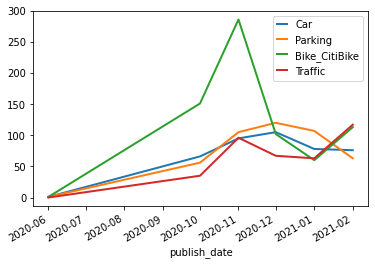

In [669]:
b_group[b_group['borocd']==101][['Car','Parking','Bike_CitiBike','Traffic']].plot(legend=True,lw=2)

In [647]:
b_group[b_group['borocd']==101].head(1)

,borocd,DoT,Parking,CitiBike,Greenway,Pedestrian,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Bike_CitiBike
publish_date,,,,,,,,,,,,,,,,
2020-06-01,101,0.0,1.0,0.0,0.0,0.0,0.0,5.0,1.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0


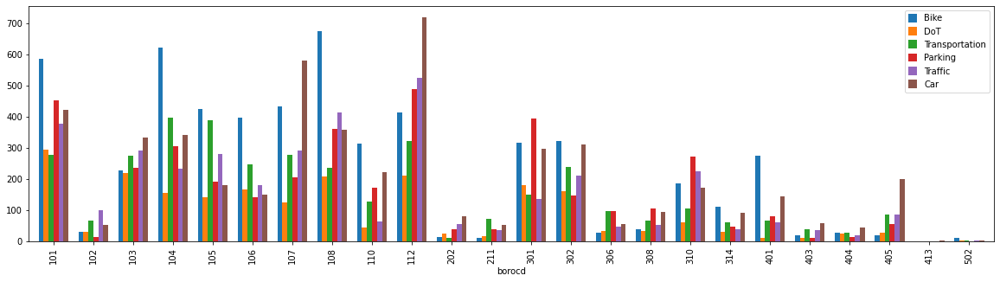

In [580]:
fig, axes = plt.subplots(figsize=(20, 5))
topic_map.groupby('borocd')[[
       'Bike', "DoT", 
       'Transportation', 'Parking', 'Traffic',
       'Car']].sum().plot(kind='bar', ax= axes, width=.75 )

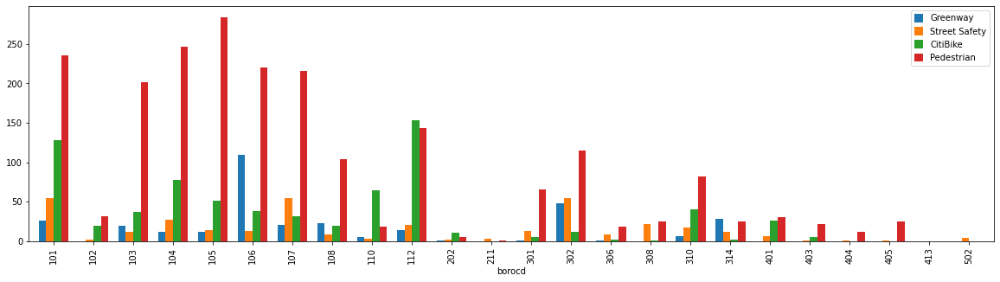

In [579]:
fig, axes = plt.subplots(figsize=(20, 5))
topic_map.groupby('borocd')[[
       'Greenway','Street Safety', 'CitiBike', 'Pedestrian']].sum().plot(kind='bar', ax= axes, width=.75 )

In [502]:
topic_map[topic_map['borocd']==108].head(1)

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,DoT,Parking,CitiBike,Greenway,Pedestrian,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car
339,108,Manhattan Community Board 8,g1gcT-cVsWM,Manhattan Community Board 8,2020-12-10,Land Use Committee Meeting,"[[0.541478157043457, 'Zoning'], [0.09162350744...","Foreign me, okay, will tell me when it's a goo...","{'building': 47, 'buildings': 29, 'flood': 38,...",3:14:40,NaN,9.0,NaN,NaN,1.0,NaN,3.0,0.0,0.0,5.0,2.0,0.0,0.0,0.0


In [496]:
topic_map[topic_map['borocd']==302].head(1)

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,DoT,Parking,CitiBike,Greenway,Pedestrian,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car
589,302,Brooklyn Community Board 2,VOWykNjXjuw,Brooklyn Community Board 2,2020-06-16,Parks & Recreation Committee,"[[0.9073856472969055, 'Parks'], [0.01812242530...","Five, and also for purposes of transparency, a...","{'parks': 5, 'moment': 2, 'park': 5, 'staff': ...",1:41:08,NaN,NaN,NaN,NaN,1.0,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0


In [317]:
topic_map[topic_map['borocd']==401].sort_values(by='Car',ascending=False).head()

,borocd,cd_full_title,video_url,author,publish_date,title,topic,fullTranscript,word_count,length,Parking,DoT,CitiBike,Greenway,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car,Pedestrian,Truck,Bike_CitiBike
789,401,Queens Community Board 1,R4EKhX8Gqio,Queens Community Board 1,2020-06-17,Community Board Queens Meeting,"[[0.3143855035305023, 'Transportation'], [0.20...","Madame, chairman of the board, Marie Tony Olli...","{'bike': 51, 'lane': 47, 'lanes': 21, 'traffic...",2:57:25,28.0,4.0,3.0,NaN,NaN,15.0,167.0,3.0,2.0,31.0,5.0,1.0,55.0,19.0,2.0,170.0
793,401,Queens Community Board 1,xwHk_ul-gGQ,Queens Community Board 1,2021-01-20,Community Board Queens,"[[0.5434606075286865, 'Zoning'], [0.2348384857...","As I mentioned, my name is Frank Sinjak, I'm a...","{'building': 30, 'street': 8, 'housing': 16, '...",2:27:28,20.0,3.0,6.0,NaN,NaN,19.0,31.0,2.0,9.0,21.0,0.0,3.0,39.0,4.0,7.0,37.0
791,401,Queens Community Board 1,JIRoMz8tXzE,Queens Community Board 1,2020-11-18,Queens Full Board Meeting,"[[0.6782008409500122, 'Housing'], [0.150473758...",Eh Madam chair your meeting is now live. Thank...,"{'windows': 46, 'street': 8, 'building': 4, 'r...",2:01:30,1.0,12.0,2.0,NaN,NaN,5.0,16.0,5.0,0.0,4.0,0.0,0.0,24.0,5.0,10.0,18.0
794,401,Queens Community Board 1,Qx1kSfJBhDc,Queens Community Board 1,2021-02-17,Queens Full Board Meeting,"[[0.30393028259277344, 'Infrastructure'], [0.1...",I think we're ready for I found you muted Paul...,"{'bike': 28, 'business': 21, 'plan': 19, 'sani...",1:56:20,5.0,6.0,7.0,NaN,NaN,14.0,58.0,0.0,1.0,1.0,0.0,0.0,18.0,6.0,0.0,65.0
790,401,Queens Community Board 1,WYtZwaNoe_w,Queens Community Board 1,2020-10-21,Queens Full Board Meeting,"[[0.35772138833999634, 'Housing'], [0.26195615...","Speaking or resorting to R6A, there are r6as m...","{'parking': 3, 'restaurant': 3, 'report': 4, '...",1:16:50,25.0,6.0,7.0,NaN,NaN,7.0,3.0,0.0,2.0,1.0,0.0,0.0,5.0,2.0,0.0,10.0


In [584]:
cb_12 = topic_map[topic_map['borocd']==112]

In [585]:
cb_12.set_index('publish_date', inplace=True)

In [478]:
topic_map.groupby('borocd')[['DoT',
       'Parking', 'CitiBike', 'Greenway', 'Pedestrian', 'Vision Zero',
       'Transportation', 'Bike', 'Scooter', 'Subway', 'Traffic',
       'Street Safety', 'Bus', 'Car']].sum().describe()

,DoT,Parking,CitiBike,Greenway,Pedestrian,Vision Zero,Transportation,Bike,Scooter,Subway,Traffic,Street Safety,Bus,Car
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.00000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,88.541667,158.291667,24.208333,12.416667,52.208333,0.125000,148.25000,157.166667,7.666667,61.625000,151.958333,7.250000,73.750000,156.000000
std,85.662624,149.590304,33.107177,21.305065,61.638483,0.448427,122.71928,154.580123,10.239169,57.927851,143.752045,8.404192,82.072211,138.868408
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,23.750000,37.750000,1.750000,0.000000,12.000000,0.000000,63.75000,19.750000,0.000000,15.500000,40.750000,2.000000,19.250000,44.000000
50%,38.000000,105.500000,12.000000,2.500000,19.500000,0.000000,93.00000,130.000000,3.500000,40.000000,91.500000,4.500000,43.500000,113.500000
75%,155.750000,242.500000,36.000000,19.250000,91.250000,0.000000,248.50000,266.250000,9.250000,99.000000,242.000000,9.500000,101.000000,238.250000
max,286.000000,488.000000,127.000000,96.000000,221.000000,2.000000,396.00000,554.000000,37.000000,199.000000,523.000000,34.000000,312.000000,549.000000


In [322]:
cb

202

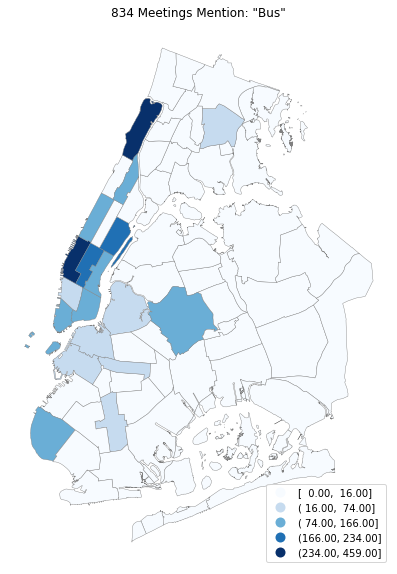

In [331]:
map_one_topic('Bus', topic_map)